> Notebook com o treinamento dos modelos de ML para a classificação do label vivo_ano1

---

1) excluir os casos de pele não melanoma (CID-O CID44 com as morfologias entre 80101 e 81103); ok

2) não utilizar as datas de recidiva (na ficha de seguimento há sobreposição); ok

3) a variável Cidade de residência (transformada em  RRAS - Rede Regional de Atenção à Saúde) relacionada com RRAS de atendimento (o valor 99 é ignorado);

4) Na questão de predição do óbito, sugiro que o comportamento 1 e 2 não sejam interessantes para a análise. Ao se observar a coluna MORFO o último dígito 1, 2 ou 3 faz referencia ao comportamento do tumor, por exemplo, 80503 = ductal invasivo. Os últimos dígitos 1 são incerto se benigno ou limítrofe e 2 carcinoma in situ.
Minha sugestão é gerar uma variável chamada comportamento e deixar só o comportamento 3 para certas análises; ok

5) trabalhar com o ano do diagnóstico agrupado é uma boa opção. O câncer não sofre mudanças abruptas ao longo do tempo e controlar por períodos de diagnóstico pode ser mais vantajoso (2000 - 2004; 2005 - 2009; 2010 - 2015). ok

6) não me recordo se os estadiamentos X e Y foram retirados, mas não devem ser trabalhados; ok

7) EC e ECGRUP dizem quase a mesma coisa. Talvez verificar o melhor preditor e usar para o modelo; ok

8) quanto a variável metástase e recidiva a distancia, deveriam estar preenchidas de forma homogênea, assim sugiro usar as informações de recidiva à distância;

9) o tempo entre o diagnóstico e o tratamento ou consulta e o tratamento devem ser recalculados (foi refeito, eu me recordo) e retirados das análise aqueles que não tiveram a possibilidade de serem tratados; ok

10) nesta base, a última coluna está preenchida com as habilitações para o tratamento CACON e UNACON. ok

# **Libraries**

Import of all libraries used in the project. 

In [ ]:
import pandas as pd
import numpy as np

# Graphs
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

import pickle # Save models
seed = 10 # seed for the random state

In [ ]:
# Preprocessing
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, MaxAbsScaler, QuantileTransformer, OneHotEncoder
from sklearn.model_selection import train_test_split

In [ ]:
# Classification
from imblearn.over_sampling import SMOTE

from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
import xgboost as xgb

from sklearn.metrics import ConfusionMatrixDisplay, roc_curve, roc_auc_score, auc

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

In [ ]:
from sklearn import tree

In [ ]:
%%capture

!pip install shap

import shap

# **Functions**

Here we have some functions used in the project, the ones for general use are for creating new columns in the data and reading and saving datasets. The functions for the models contain the preprocessing, division into training and test data, validation of the regressions and plot of the graph with the features importances.

In [ ]:
# Functions Library
!gdown --id 15TI1DRr9rMQOoNmn8S44D55Ek99m4kaZ --quiet

from functions import *

# **Introduction**

In this section, two machine learning models will be used to classify the `vivo_ano1` column, Random Forest and XGBoost, for both datasets, São Paulo and other states.

The label is 1 if the patient is alive after one year of treatment and 0 if not.

The first approach is using the "raw data", the second is without the `EC` column, the third one is without `EC` and `HORMONIO`, the fourth is using the grouped years and without the column `EC` and the fifth is also with the years gruped and without `EC` and `HORMONIO`.

The years will be grouped as follows: 2000 to 2003, 2004 to 2007, 2008 to 2011, 2012 to 2015 and 2016 until the end. So we will have 5 datasets for SP and another 5 for other states.

Reading the data from SP and other states.

We can see that we still have some missing values in both datasets, but the columns `DTRECIDIVA`, `delta_t4`, `delta_t5` and `delta_t6` will not be used in this approach.

In [ ]:
df_SP = read_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_SP_labels.csv')
df_fora = read_csv('/content/drive/MyDrive/Trabalho/Cancer/Datasets/cancer_foraSP_labels.csv')

(506037, 77)
(32891, 77)


Here we have the correlations between the label and the other columns, the columns with higher correlations will not be used as features of the models, because they may have been used to create the label, such as the ``ULTINFO`` column, or they can be used as label for other machine learning models.

In [ ]:
# SP
corr_matrix = df_SP.corr()
abs(corr_matrix['vivo_ano1']).sort_values(ascending = False).head(20)

vivo_ano1       1.000000
vivo_ano3       0.550659
ULTIDIAG        0.516977
ULTICONS        0.511464
ULTITRAT        0.506234
vivo_ano5       0.379191
obito_cancer    0.334877
obito_geral     0.288888
HORMONIO        0.213111
MORFO           0.211231
CIRURGIA        0.200385
RECNENHUM       0.143184
ULTINFO         0.135111
DIAGTRAT        0.109031
CLINICA         0.107280
RECLOCAL        0.098045
TRATCONS        0.078914
RADIO           0.078885
RECDIST         0.068599
SEXO            0.067825
Name: vivo_ano1, dtype: float64

In [ ]:
# Other states
corr_matrix = df_fora.corr()
abs(corr_matrix['vivo_ano1']).sort_values(ascending = False).head(20)

vivo_ano1       1.000000
vivo_ano3       0.547481
ULTIDIAG        0.534214
ULTICONS        0.525986
ULTITRAT        0.521397
vivo_ano5       0.365313
obito_cancer    0.313149
obito_geral     0.281608
CIRURGIA        0.225414
HORMONIO        0.188568
MORFO           0.187409
RECNENHUM       0.144844
DIAGTRAT        0.143071
ULTINFO         0.125962
ANODIAG         0.112732
TRATCONS        0.102913
RECDIST         0.099343
RECLOCAL        0.092728
DIAGPREV        0.092233
RADIO           0.081094
Name: vivo_ano1, dtype: float64

Here we have the number of examples for each category of the label, it is clear that there is an imbalance, similar to the previous classification. 

In [ ]:
df_SP.vivo_ano1.value_counts()

1    382541
0    123496
Name: vivo_ano1, dtype: int64

In [ ]:
df_fora.vivo_ano1.value_counts()

1    24709
0     8182
Name: vivo_ano1, dtype: int64

Years of diagnosis present in the data.

In [ ]:
np.sort(df_SP.ANODIAG.unique())

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021])

In [ ]:
np.sort(df_fora.ANODIAG.unique())

array([2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010,
       2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])

Before dividing the datasets, it is necessary to select only the patients who have been followed up for at least one year.

In [ ]:
# SP
df_SP_ano1 = df_SP[~((df_SP.obito_geral == 0) & (df_SP.vivo_ano1 == 0))]
df_SP_ano1.shape

(469704, 77)

In [ ]:
# Other States
df_fora_ano1 = df_fora[~((df_fora.obito_geral == 0) & (df_fora.vivo_ano1 == 0))]
df_fora_ano1.shape

(29771, 77)

# **First approach**

Approach with "raw data".

## **Preprocessing**

Now we are going to divide the data into training and testing, and then do the preprocessing in both datasets to perform the training of the models and their evaluation.

First, it is necessary to define the columns that will be used as features and the label. We will not use some columns of the datasets: `UFRESID`, because we already have the division between SP and other states in the two datasets. 

It was chosen to keep the column `IDADE`, so we will not use the `FAIXAETAR`. Finally, the other columns contained in the list `list_drop` are possible labels, so they will not be used as features for machine learning models.

In [ ]:
list_drop = ['UFRESID', 'FAIXAETAR', 'ULTICONS', 'ULTIDIAG', 'ULTITRAT', 
             'obito_geral', 'obito_cancer', 'vivo_ano3', 'vivo_ano5', 'ULTINFO']

# 'RECNENHUM', 'RECLOCAL', 'RECREGIO', 'REC01', 'REC02', 'REC03', 'RECDIST'

lb = 'vivo_ano1'

A function was created to perform the preprocessing, `preprocessing`, that uses the other functions created, `get_train_test` (divides the dataset into train and test sets), `train_preprocessing` (do the preprocessing of the train set) and `test_preprocessing` (do the preprocessing of the test set). 

> To see the complete function go to the [functions section](https://cancer-project.readthedocs.io/en/latest/Cancer%20Libraries%20and%20functions.html#Models).

**SP**

In [ ]:
X_train_SP, X_test_SP, y_train_SP, y_test_SP, feat_cols_SP = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                           random_state=seed,
                                                                           balance_data=False,
                                                                           encoder_type='LabelEncoder', 
                                                                           norm_name='StandardScaler')

X_train = (352278, 66), X_test = (117426, 66)
y_train = (352278,), y_test = (117426,)


**Other states**

In [ ]:
X_train_OS, X_test_OS, y_train_OS, y_test_OS, feat_cols_OS = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                           random_state=seed,
                                                                           balance_data=False,
                                                                           encoder_type='LabelEncoder', 
                                                                           norm_name='StandardScaler')

X_train = (22328, 66), X_test = (7443, 66)
y_train = (22328,), y_test = (7443,)


## **Training machine learning models**

After dividing the data into training and testing, using the encoder and normalizing, the data is ready to be used by the machine learning models.

### **Random Forest**


The first model that will be tested is the Random Forest, for this test the parameter `random_state` will be used, to obtain the same training values of the model every time it is runned.

The hyperparameter `class_weight` was also used, because the model has difficulty learning the class with fewer examples, so using this parameter this class will have a higher weight in the training of the model.

In [ ]:
# SP 
rf_sp = RandomForestClassifier(class_weight={0:4.2, 1:1}, 
                               random_state=seed,
                               criterion='entropy',
                               max_depth=10)

rf_sp.fit(X_train_SP, y_train_SP)

RandomForestClassifier(class_weight={0: 4.2, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

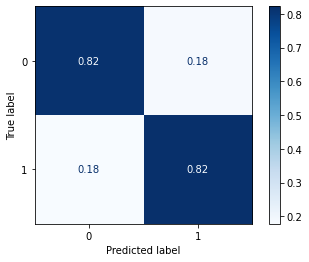

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp, X_test_SP, y_test_SP, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data, shows a good performance of the model, with 82% of accuracy.


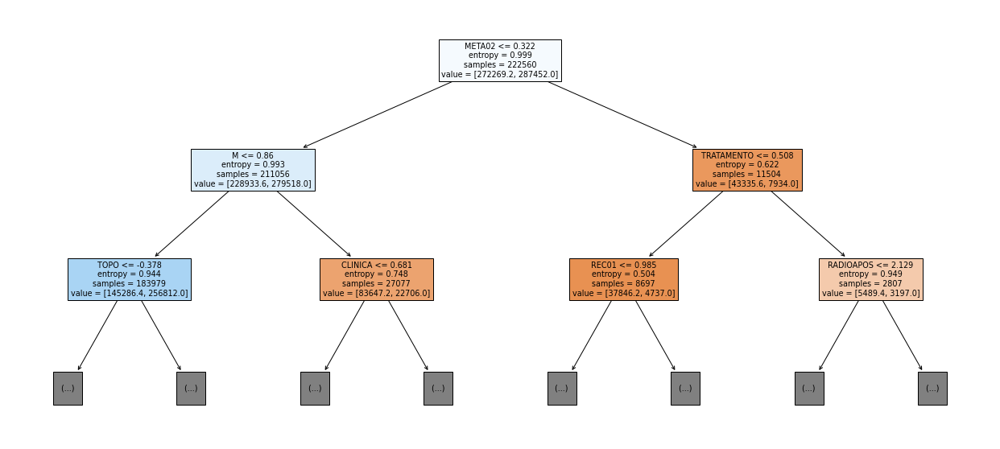

In [ ]:
show_tree(rf_sp, feat_cols_SP, 2)

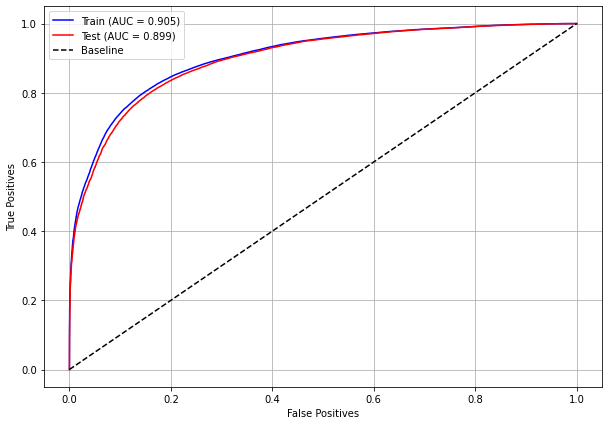

In [ ]:
plot_roc_curve(rf_sp, X_train_SP, X_test_SP, y_train_SP, y_test_SP)

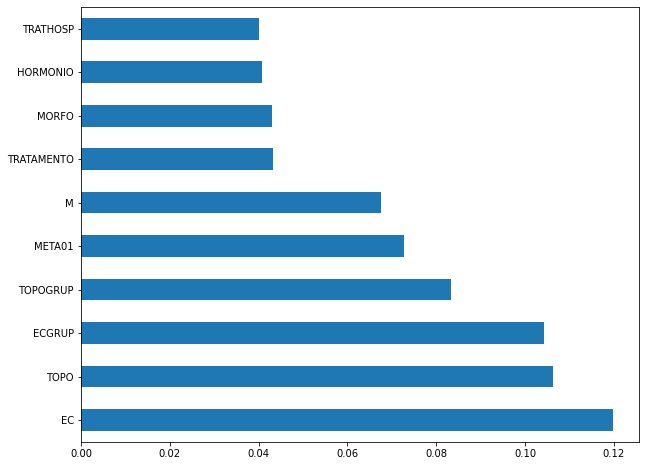

In [ ]:
plot_feat_importances(rf_sp, feat_cols_SP)

> The four most important features in the model were `EC`, `TOPO`, `ECGRUP` and `TOPOGRUP`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp).shap_values(X_test_SP)

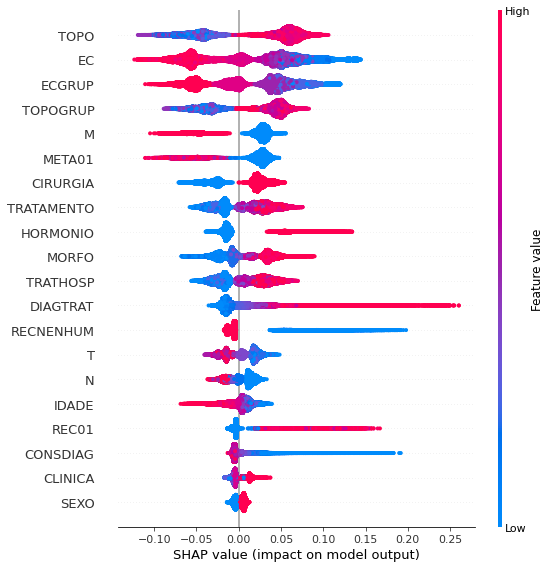

In [ ]:
shap.summary_plot(shap_values[1], X_test_SP, 
                  feature_names=feat_cols_SP)

In [ ]:
# Other states
rf_fora = RandomForestClassifier(class_weight={0:6.247, 1:1}, 
                                 random_state=seed,
                                 criterion='entropy',
                                 max_depth=10)

rf_fora.fit(X_train_OS, y_train_OS)

RandomForestClassifier(class_weight={0: 6.247, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

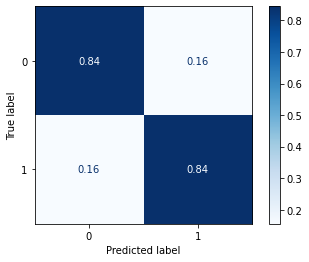

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora, X_test_OS, y_test_OS, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest algorithm, with other states data, shows a good performance of the model, because the model achieves a 84% of accuracy.


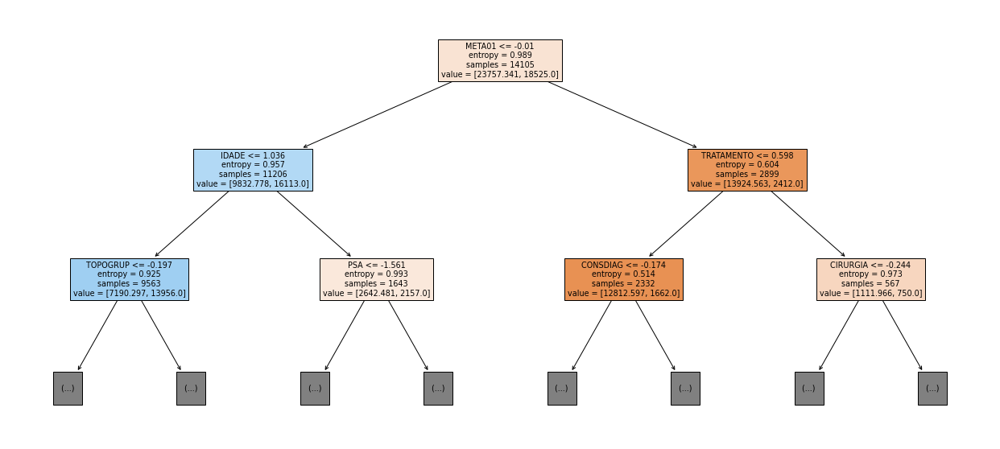

In [ ]:
show_tree(rf_fora, feat_cols_OS, 2)

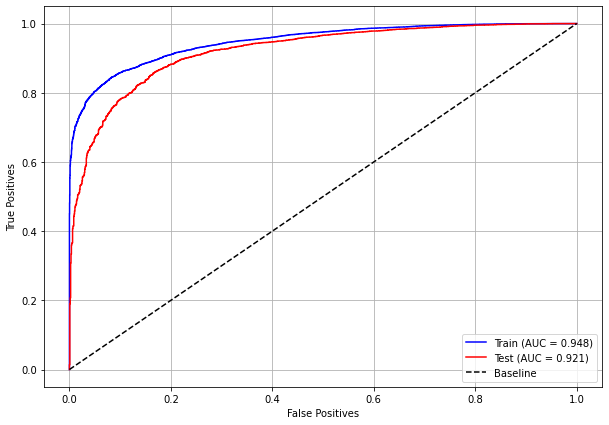

In [ ]:
plot_roc_curve(rf_fora, X_train_OS, X_test_OS, y_train_OS, y_test_OS)

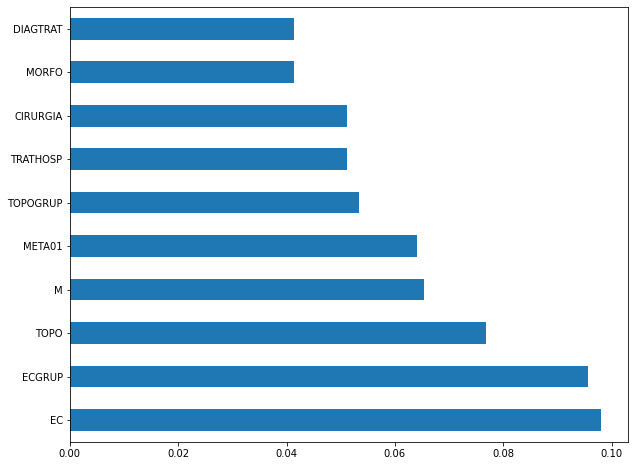

In [ ]:
plot_feat_importances(rf_fora, feat_cols_OS)

> The four most important features in the model were `EC`, `ECGRUP`, `TOPO` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora).shap_values(X_test_OS)

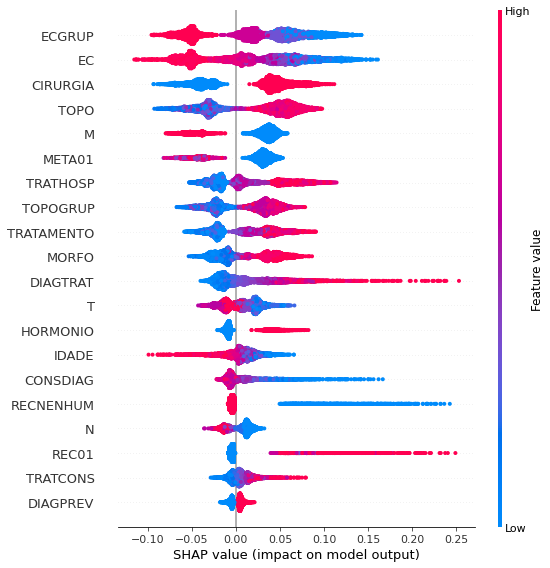

In [ ]:
shap.summary_plot(shap_values[1], X_test_OS, 
                  feature_names=feat_cols_OS)

In [ ]:
# RandomizedSearchCV
hyperRF = {'n_estimators': [100, 300, 500, 800, 1200],
           'max_depth': [5, 8, 15, 25, 30],
           'min_samples_split': [2, 5, 10, 15, 100],
           'min_samples_leaf': [1, 2, 5, 10]} 

rf = RandomForestClassifier(random_state=seed, criterion='entropy')

randRS = RandomizedSearchCV(rf, hyperRF, n_iter=20, cv = 5, verbose = 2, n_jobs=4)

In [ ]:
# SP
bestSP = randRS.fit(X_train_SP, y_train_SP)

In [ ]:
bestSP.best_params_

In [ ]:
# SP
rf_sp_opt = RandomForestClassifier(random_state=seed, class_weight={0:1, 1:60},
                                   max_depth=30, min_samples_leaf=1, 
                                   min_samples_split=2, n_estimators=800,
                                   criterion='entropy')

rf_sp_opt.fit(X_train_SP, y_train_SP)

In [ ]:
plot_confusion_matrix(rf_sp_opt, X_test_SP, y_test_SP, cmap='Blues', 
                      normalize='true', values_format='.2f')
plt.show()

In [ ]:
# Other States
bestOS = randRS.fit(X_train_OS, y_train_OS)

In [ ]:
bestOS.best_params_

In [ ]:
# Other states
rf_fora_opt = RandomForestClassifier(random_state=seed, class_weight={0:1, 1:2.7},
                                     max_depth=25, min_samples_leaf=2, 
                                     min_samples_split=2, n_estimators=300,
                                     criterion='entropy')

rf_fora_opt.fit(X_train_OS, y_train_OS)

In [ ]:
plot_confusion_matrix(rf_fora_opt, X_test_OS, y_test_OS, cmap='Blues', 
                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost**


The training of the XGBoost model follows the same pattern with `random_state`. A higher weight was also used for the class with fewer examples, using the hyperparameter `scale_pos_weight`.

The hyperparameter `max_depth` was chosen as 10 because the default value for this hyperparameter is 3, a low value for the amount of data we have.

In [ ]:
# SP
xgboost_sp = xgb.XGBClassifier(max_depth=10, 
                               scale_pos_weight=0.225,
                               random_state=seed)

xgboost_sp.fit(X_train_SP, y_train_SP)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.225)

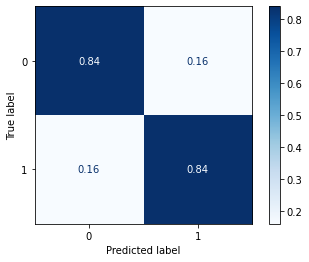

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgboost_sp, X_test_SP, y_test_SP, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data, shows a good performance of the model, with 84% of accuracy.


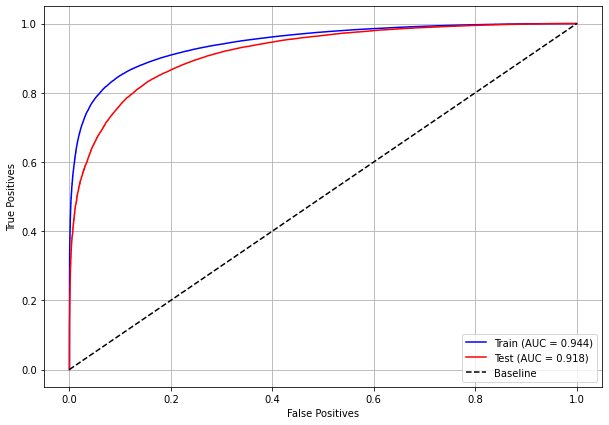

In [ ]:
plot_roc_curve(xgboost_sp, X_train_SP, X_test_SP, y_train_SP, y_test_SP)

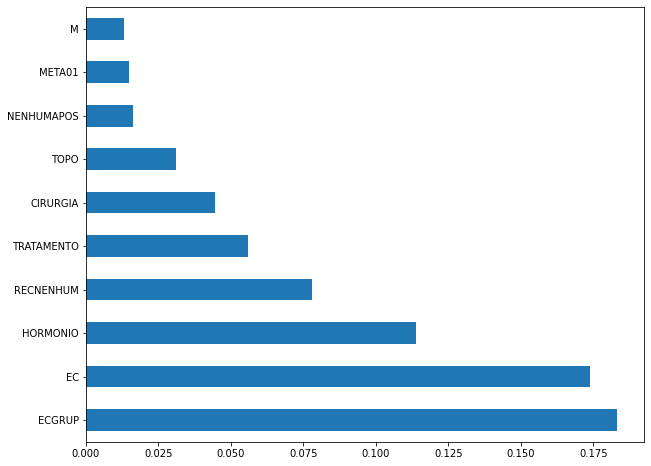

In [ ]:
plot_feat_importances(xgboost_sp, feat_cols_SP)

> The four most important features in the model were `ECGRUP`, `EC`, `HORMONIO` and `RECNENHUM`.

In [ ]:
shap_values = shap.TreeExplainer(xgboost_sp).shap_values(X_test_SP)

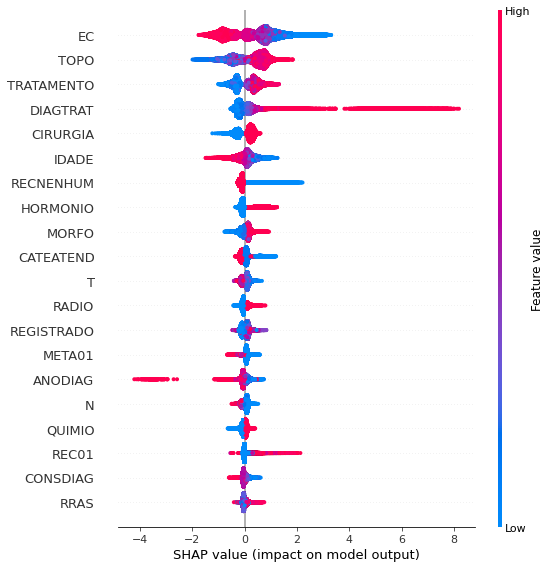

In [ ]:
shap.summary_plot(shap_values, X_test_SP, 
                  feature_names=feat_cols_SP)

In [ ]:
# Other states 
xgboost_fora = xgb.XGBClassifier(max_depth=10, 
                                 scale_pos_weight=0.11,
                                 random_state=seed)

xgboost_fora.fit(X_train_OS, y_train_OS)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.11)

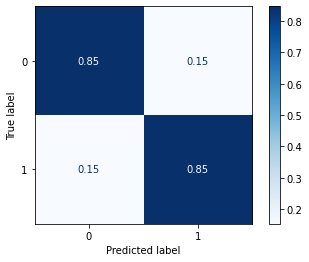

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgboost_fora, X_test_OS, y_test_OS, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost algorithm, with other states data, shows a good performance of the model, because the model achieves a 85% of accuracy.


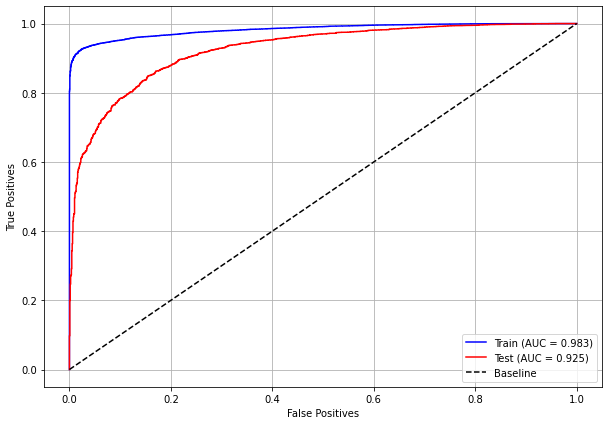

In [ ]:
plot_roc_curve(xgboost_fora, X_train_OS, X_test_OS, y_train_OS, y_test_OS)

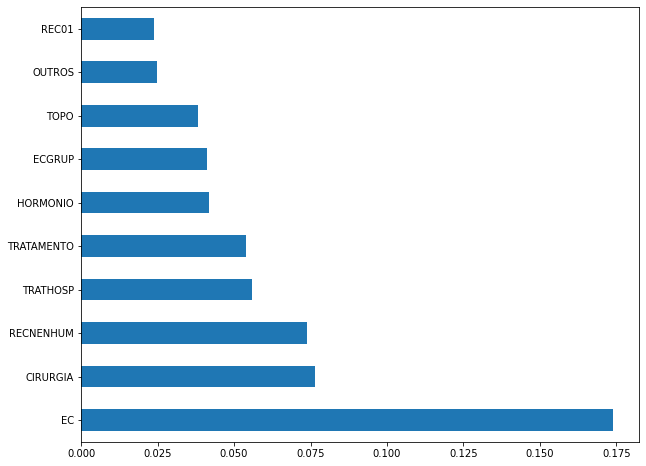

In [ ]:
plot_feat_importances(xgboost_fora, feat_cols_OS)

> The four most important features in the model were `EC`, `CIRURGIA`, `RECNENHUM` and `TRATHOSP`.

In [ ]:
shap_values = shap.TreeExplainer(xgboost_fora).shap_values(X_test_OS)

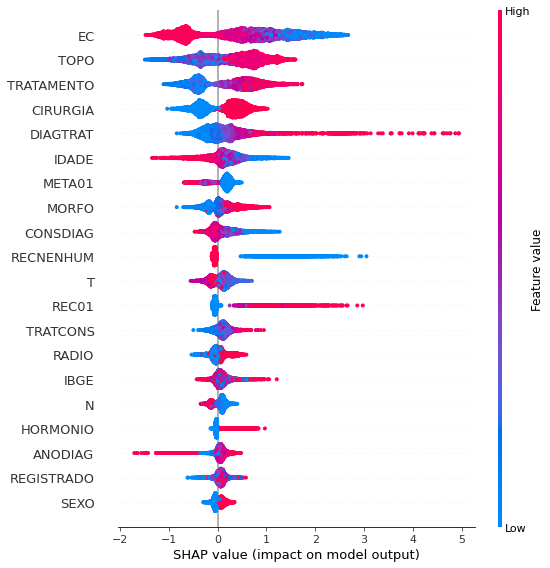

In [ ]:
shap.summary_plot(shap_values, X_test_OS, 
                  feature_names=feat_cols_OS)

In [ ]:
# RandomizedSearchCV

hyperXGB = {'learning_rate': [0.05, 0.10, 0.15, 0.20, 0.25, 0.30],
            'max_depth': [3, 4, 5, 6, 8, 10, 12, 15],
            'min_child_weight': [1, 3, 5, 7],
            'gamma': [0.0, 0.1, 0.2 , 0.3, 0.4],
            'colsample_bytree': [0.3, 0.4, 0.5 , 0.7]}

xgboost = xgb.XGBClassifier(random_state=seed)
xgbRS = RandomizedSearchCV(xgboost, hyperXGB, n_iter=20, cv = 5, verbose = 2, n_jobs=4)

In [ ]:
# SP
bestSP = xgbRS.fit(X_train_SP, y_train_SP)

In [ ]:
bestSP.best_params_

In [ ]:
# SP
xgb_sp_opt = xgb.XGBClassifier(random_state=seed, scale_pos_weight=0.06,
                               colsample_bytree=0.4, gamma=0.2, 
                               learning_rate=0.15, max_depth=10, 
                               min_child_weight=5)

xgb_sp_opt.fit(X_train_SP, y_train_SP)

In [ ]:
plot_confusion_matrix(xgb_sp_opt, X_test_SP, y_test_SP, cmap='Blues', 
                      normalize='true', values_format='.2f')
plt.show()

In [ ]:
# Other States
bestOS = xgbRS.fit(X_train_OS, y_train_OS)

In [ ]:
bestOS.best_params_

In [ ]:
# Other states
xgb_fora_opt = xgb.XGBClassifier(random_state=seed, scale_pos_weight=2.1,
                                 colsample_bytree=0.3, gamma=0.1, 
                                 learning_rate=0.1, max_depth=15, 
                                 min_child_weight=5)

xgb_fora_opt.fit(X_train_OS, y_train_OS)

In [ ]:
plot_confusion_matrix(xgb_fora_opt, X_test_OS, y_test_OS, cmap='Blues', 
                      normalize='true', values_format='.2f')
plt.show()

# **Second approach**

Approach without column `EC` as a feature.

## **Preprocessing**

Now we are going to divide the data into training and testing, and then do the preprocessing in both datasets to perform the training of the models and their evaluation.

First, it is necessary to define the columns that will be used as features and the label. We will not use some columns of the datasets: `UFRESID`, because we already have the division between SP and other states in the two datasets. 

It was chosen to keep the column `IDADE`, so we will not use the `FAIXAETAR`, as well as the column `ECGRUP` and not the column `EC`. Finally, the other columns contained in the list `list_drop` are possible labels, so they will not be used as features for machine learning models.

In [ ]:
list_drop = ['UFRESID', 'FAIXAETAR', 'ULTICONS', 'ULTIDIAG', 'ULTITRAT', 
             'obito_geral', 'obito_cancer', 'vivo_ano3', 'vivo_ano5',
             'ULTINFO', 'EC']

# 'RECNENHUM', 'RECLOCAL', 'RECREGIO', 'REC01', 'REC02', 'REC03', 'RECDIST'

lb = 'vivo_ano1'

A function was created to perform the preprocessing, `preprocessing`, that uses the other functions created, `get_train_test` (divides the dataset into train and test sets), `train_preprocessing` (do the preprocessing of the train set) and `test_preprocessing` (do the preprocessing of the test set). 

> To see the complete function go to the [functions section](https://cancer-project.readthedocs.io/en/latest/Cancer%20Libraries%20and%20functions.html#Models).

**SP**

In [ ]:
X_train_SP, X_test_SP, y_train_SP, y_test_SP, feat_cols_SP = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                           random_state=seed,
                                                                           balance_data=False,
                                                                           encoder_type='LabelEncoder', 
                                                                           norm_name='StandardScaler')

X_train = (352278, 65), X_test = (117426, 65)
y_train = (352278,), y_test = (117426,)


**Other states**

In [ ]:
X_train_OS, X_test_OS, y_train_OS, y_test_OS, feat_cols_OS = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                           random_state=seed,
                                                                           balance_data=False,
                                                                           encoder_type='LabelEncoder', 
                                                                           norm_name='StandardScaler')

X_train = (22328, 65), X_test = (7443, 65)
y_train = (22328,), y_test = (7443,)


## **Training machine learning models**

After dividing the data into training and testing, using the encoder and normalizing, the data is ready to be used by the machine learning models.

### **Random Forest**


The first model that will be tested is the Random Forest, for this test the parameter `random_state` will be used, to obtain the same training values of the model every time it is runned.

The hyperparameter `class_weight` was also used, because the model has difficulty learning the class with fewer examples, so using this parameter this class will have a higher weight in the training of the model.

In [ ]:
# SP 
rf_sp = RandomForestClassifier(class_weight={0:4.2, 1:1}, 
                               random_state=seed,
                               criterion='entropy',
                               max_depth=10)

rf_sp.fit(X_train_SP, y_train_SP)

RandomForestClassifier(class_weight={0: 4.2, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

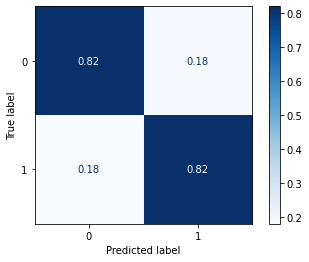

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp, X_test_SP, y_test_SP, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data, shows a good performance of the model, with 82% of accuracy.


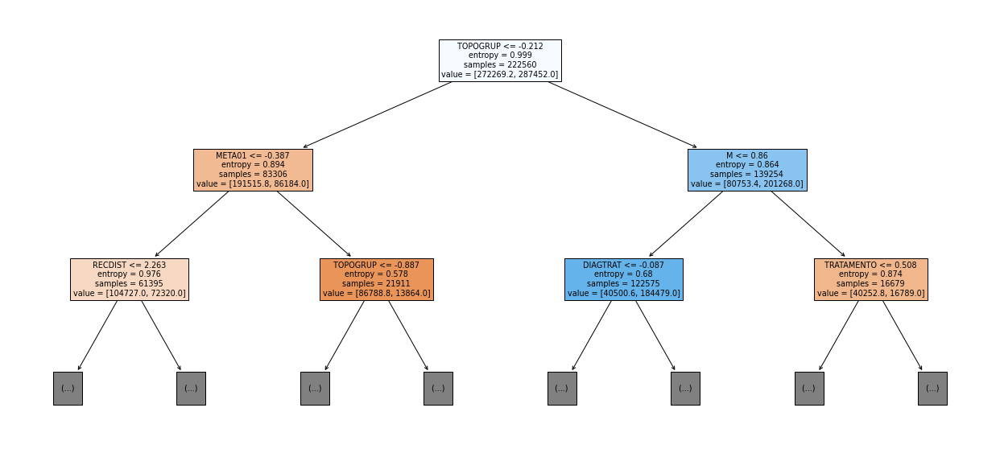

In [ ]:
show_tree(rf_sp, feat_cols_SP, 2)

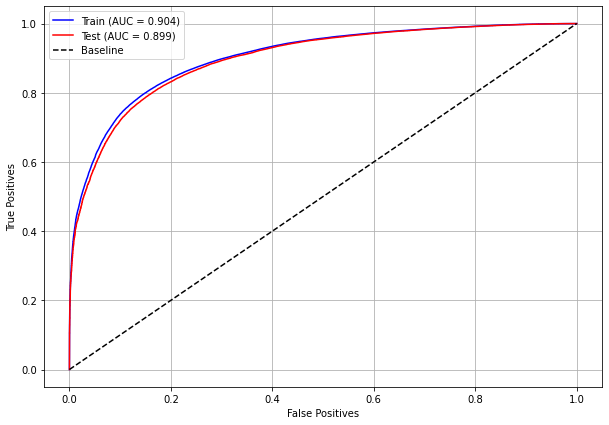

In [ ]:
plot_roc_curve(rf_sp, X_train_SP, X_test_SP, y_train_SP, y_test_SP)

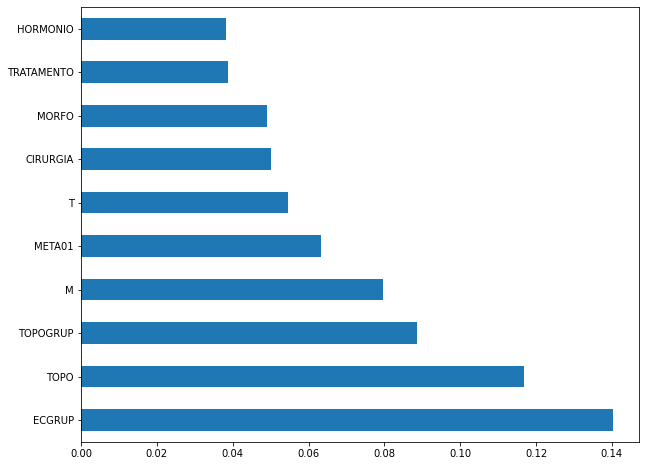

In [ ]:
plot_feat_importances(rf_sp, feat_cols_SP)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp).shap_values(X_test_SP)

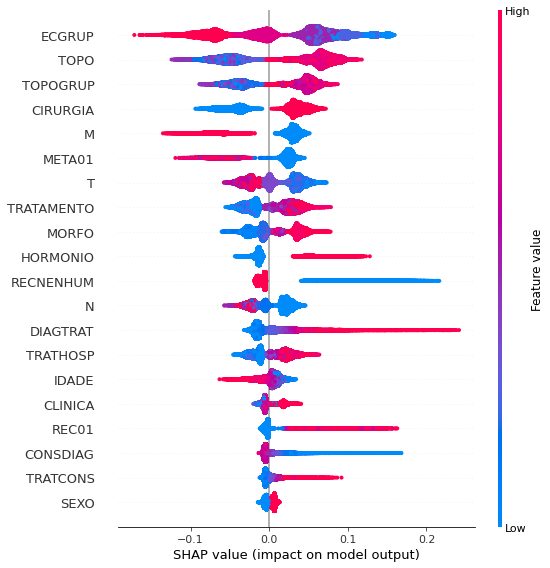

In [ ]:
shap.summary_plot(shap_values[1], X_test_SP, 
                  feature_names=feat_cols_SP)

In [ ]:
# Other states
rf_fora = RandomForestClassifier(class_weight={0:6.5, 1:1}, 
                                 random_state=seed,
                                 criterion='entropy',
                                 max_depth=10)

rf_fora.fit(X_train_OS, y_train_OS)

RandomForestClassifier(class_weight={0: 6.5, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

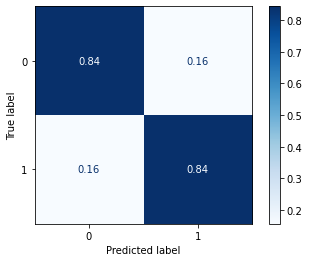

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora, X_test_OS, y_test_OS, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest algorithm, with other states data, shows a good performance of the model, because the model achieves a 84% of accuracy.


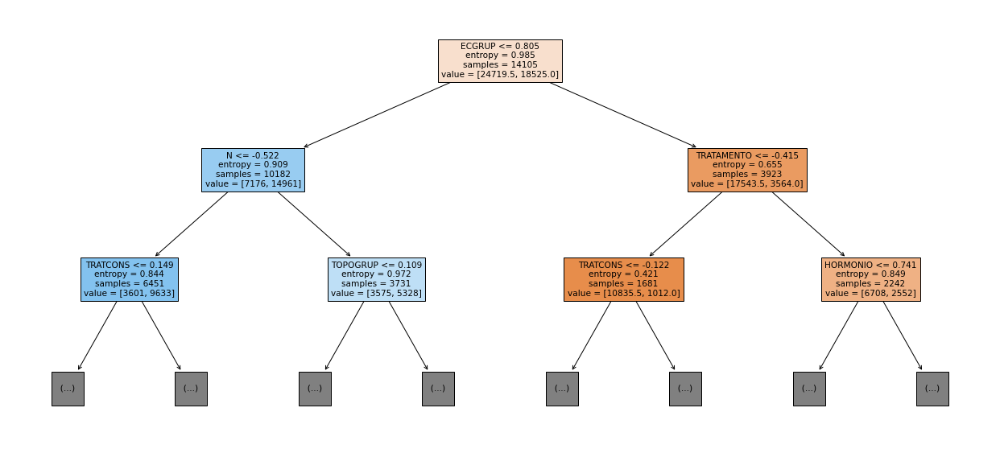

In [ ]:
show_tree(rf_fora, feat_cols_OS, 2)

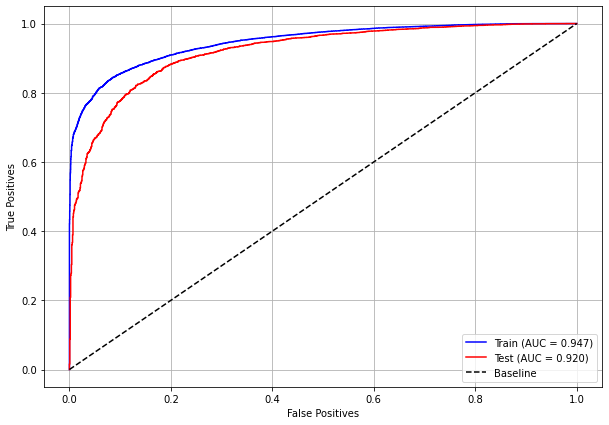

In [ ]:
plot_roc_curve(rf_fora, X_train_OS, X_test_OS, y_train_OS, y_test_OS)

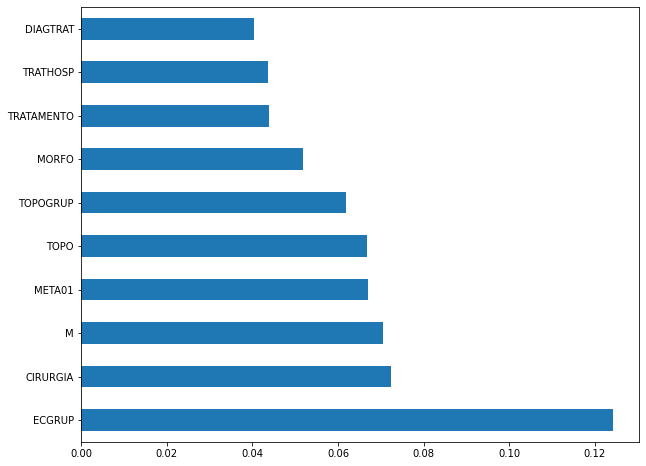

In [ ]:
plot_feat_importances(rf_fora, feat_cols_OS)

> The four most important features in the model were `ECGRUP`, `CIRURGIA`, `M` and `META01`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora).shap_values(X_test_OS)

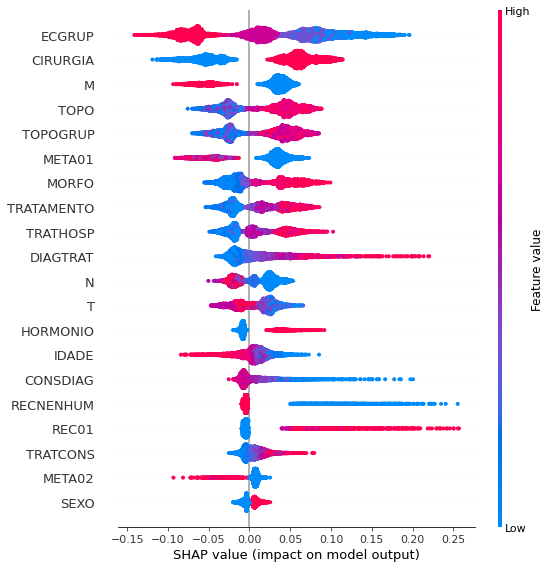

In [ ]:
shap.summary_plot(shap_values[1], X_test_OS, 
                  feature_names=feat_cols_OS)

### **XGBoost**


The training of the XGBoost model follows the same pattern with `random_state`. A higher weight was also used for the class with fewer examples, using the hyperparameter `scale_pos_weight`.

The hyperparameter `max_depth` was chosen as 10 because the default value for this hyperparameter is 3, a low value for the amount of data we have.

In [ ]:
# SP
xgboost_sp = xgb.XGBClassifier(max_depth=10, 
                               scale_pos_weight=0.23,
                               random_state=seed)

xgboost_sp.fit(X_train_SP, y_train_SP)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.23)

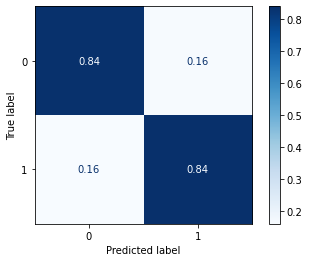

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgboost_sp, X_test_SP, y_test_SP, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data, shows a good performance of the model, with 84% of accuracy.


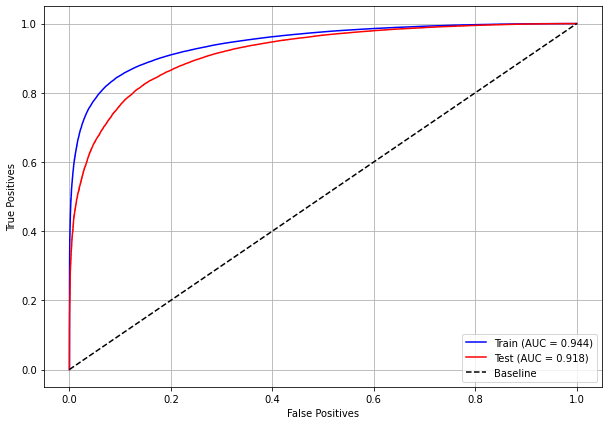

In [ ]:
plot_roc_curve(xgboost_sp, X_train_SP, X_test_SP, y_train_SP, y_test_SP)

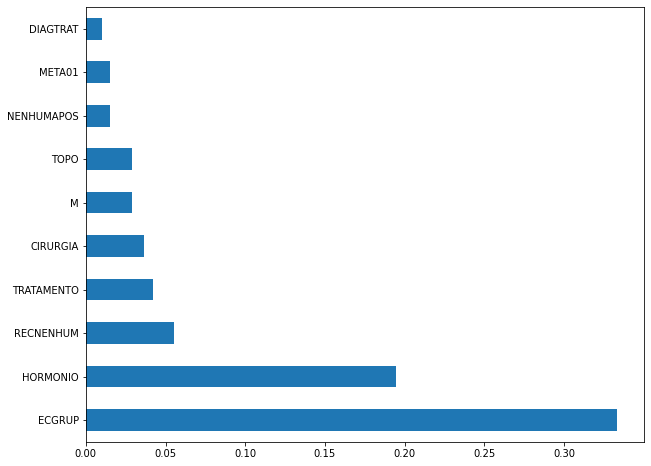

In [ ]:
plot_feat_importances(xgboost_sp, feat_cols_SP)

> The four most important features in the model were `ECGRUP`, `HORMONIO`, `RECNENHUM` and `TRATAMENTO`.

In [ ]:
shap_values = shap.TreeExplainer(xgboost_sp).shap_values(X_test_SP)

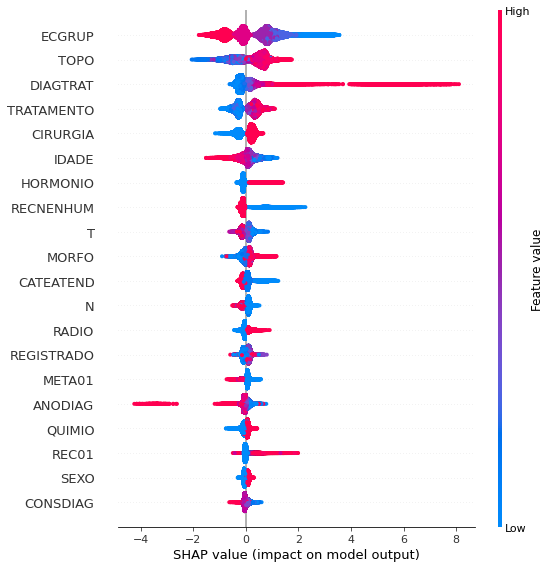

In [ ]:
shap.summary_plot(shap_values, X_test_SP, 
                  feature_names=feat_cols_SP)

In [ ]:
# Other states 
xgboost_fora = xgb.XGBClassifier(max_depth=10, 
                                 scale_pos_weight=0.11,
                                 random_state=seed)

xgboost_fora.fit(X_train_OS, y_train_OS)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.11)

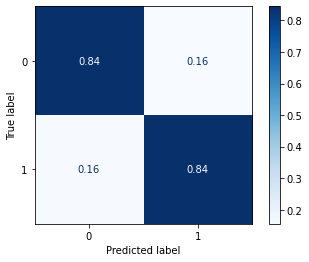

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgboost_fora, X_test_OS, y_test_OS, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost algorithm, with other states data, shows a good performance of the model, because the model achieves a 84% of accuracy.


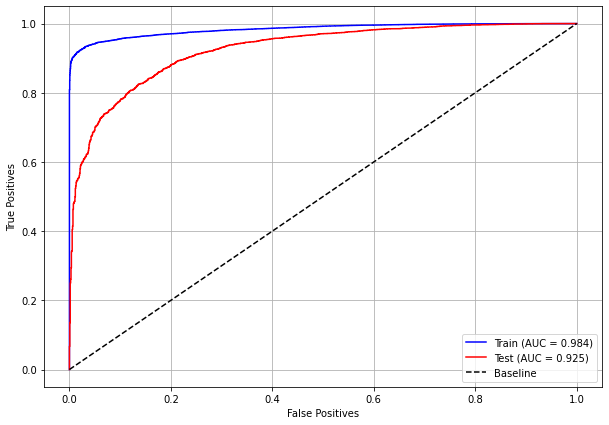

In [ ]:
plot_roc_curve(xgboost_fora, X_train_OS, X_test_OS, y_train_OS, y_test_OS)

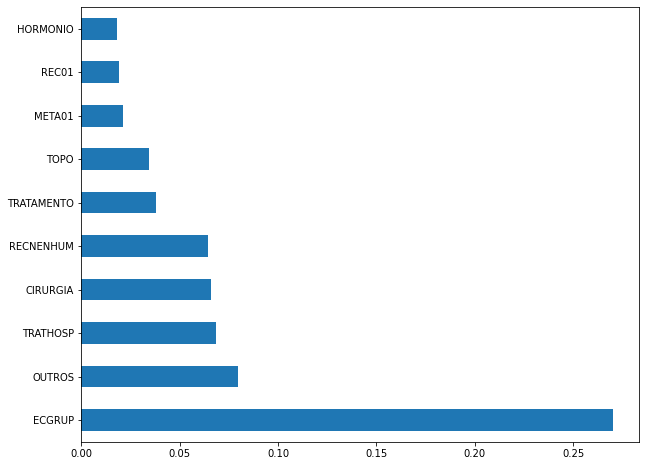

In [ ]:
plot_feat_importances(xgboost_fora, feat_cols_OS)

> The four most important features in the model were `ECGRUP`, `OUTROS`, `TRATHOSP` and `CIRURGIA`.

In [ ]:
shap_values = shap.TreeExplainer(xgboost_fora).shap_values(X_test_OS)

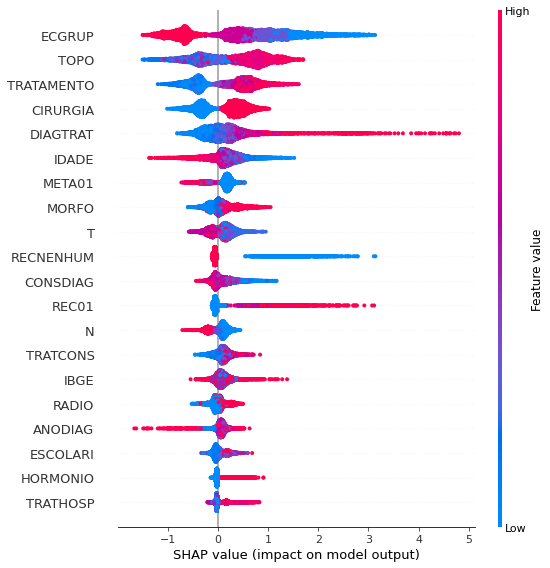

In [ ]:
shap.summary_plot(shap_values, X_test_OS, 
                  feature_names=feat_cols_OS)

# **Third approach**

Approach without column `EC` and `HORMONIO` as features.

## **Preprocessing**

Now we are going to divide the data into training and testing, and then do the preprocessing in both datasets to perform the training of the models and their evaluation.

First, it is necessary to define the columns that will be used as features and the label. We will not use some columns of the datasets: `UFRESID`, because we already have the division between SP and other states in the two datasets. 

It was chosen to keep the column `IDADE`, so we will not use the `FAIXAETAR`, as well as the column `ECGRUP` and not the column `EC`. Finally, the other columns contained in the list `list_drop` are possible labels, so they will not be used as features for machine learning models.

In [ ]:
list_drop = ['UFRESID', 'FAIXAETAR', 'ULTICONS', 'ULTIDIAG', 'ULTITRAT', 
             'obito_geral', 'obito_cancer', 'vivo_ano3', 'vivo_ano5', 
             'ULTINFO', 'EC', 'HORMONIO']

# 'RECNENHUM', 'RECLOCAL', 'RECREGIO', 'REC01', 'REC02', 'REC03', 'RECDIST'

lb = 'vivo_ano1'

A function was created to perform the preprocessing, `preprocessing`, that uses the other functions created, `get_train_test` (divides the dataset into train and test sets), `train_preprocessing` (do the preprocessing of the train set) and `test_preprocessing` (do the preprocessing of the test set). 

> To see the complete function go to the [functions section](https://cancer-project.readthedocs.io/en/latest/Cancer%20Libraries%20and%20functions.html#Models).

**SP**

In [ ]:
X_train_SP, X_test_SP, y_train_SP, y_test_SP, feat_cols_SP = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                           random_state=seed,
                                                                           balance_data=False,
                                                                           encoder_type='LabelEncoder', 
                                                                           norm_name='StandardScaler')

X_train = (352278, 64), X_test = (117426, 64)
y_train = (352278,), y_test = (117426,)


**Other states**

In [ ]:
X_train_OS, X_test_OS, y_train_OS, y_test_OS, feat_cols_OS = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                           random_state=seed,
                                                                           balance_data=False,
                                                                           encoder_type='LabelEncoder', 
                                                                           norm_name='StandardScaler')

X_train = (22328, 64), X_test = (7443, 64)
y_train = (22328,), y_test = (7443,)


## **Training machine learning models**

After dividing the data into training and testing, using the encoder and normalizing, the data is ready to be used by the machine learning models.

### **Random Forest**


The first model that will be tested is the Random Forest, for this test the parameter `random_state` will be used, to obtain the same training values of the model every time it is runned.

The hyperparameter `class_weight` was also used, because the model has difficulty learning the class with fewer examples, so using this parameter this class will have a higher weight in the training of the model.

In [ ]:
# SP 
rf_sp = RandomForestClassifier(class_weight={0:4.2, 1:1}, 
                               random_state=seed,
                               criterion='entropy',
                               max_depth=10)

rf_sp.fit(X_train_SP, y_train_SP)

RandomForestClassifier(class_weight={0: 4.2, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

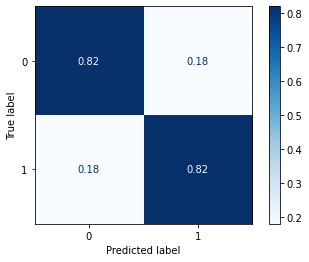

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp, X_test_SP, y_test_SP, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data, shows a good performance of the model, with 82% of accuracy.


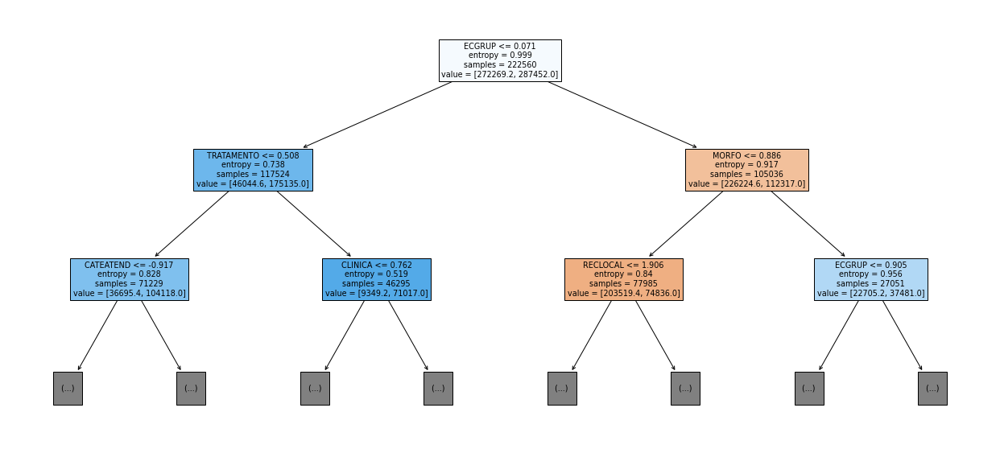

In [ ]:
show_tree(rf_sp, feat_cols_SP, 2)

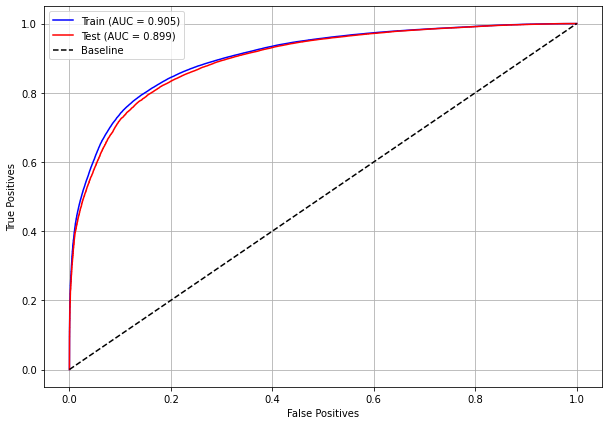

In [ ]:
plot_roc_curve(rf_sp, X_train_SP, X_test_SP, y_train_SP, y_test_SP)

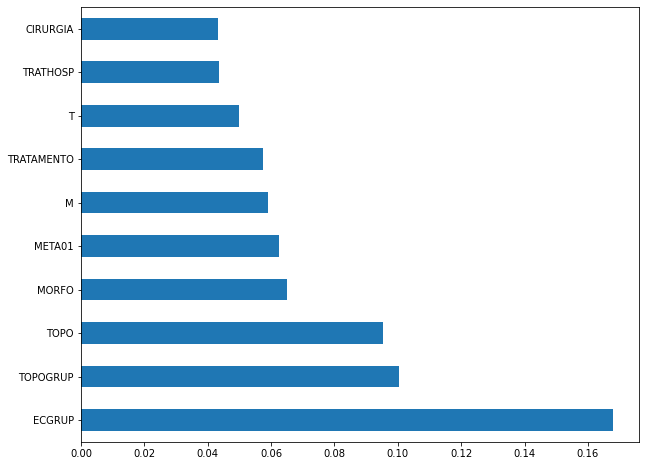

In [ ]:
plot_feat_importances(rf_sp, feat_cols_SP)

> The four most important features in the model were `ECGRUP`, `TOPOGRUP`, `TOPO` and `MORFO`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp).shap_values(X_test_SP)

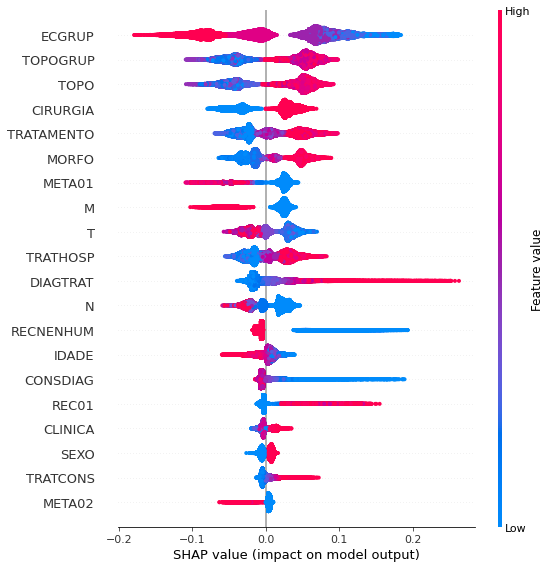

In [ ]:
shap.summary_plot(shap_values[1], X_test_SP, 
                  feature_names=feat_cols_SP)

In [ ]:
# Other states
rf_fora = RandomForestClassifier(class_weight={0:6.5, 1:1}, 
                                 random_state=seed,
                                 criterion='entropy',
                                 max_depth=10)

rf_fora.fit(X_train_OS, y_train_OS)

RandomForestClassifier(class_weight={0: 6.5, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

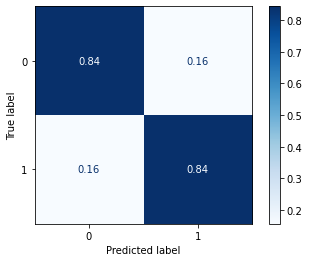

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora, X_test_OS, y_test_OS, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest algorithm, with other states data, shows a good performance of the model, because the model achieves a 84% of accuracy.


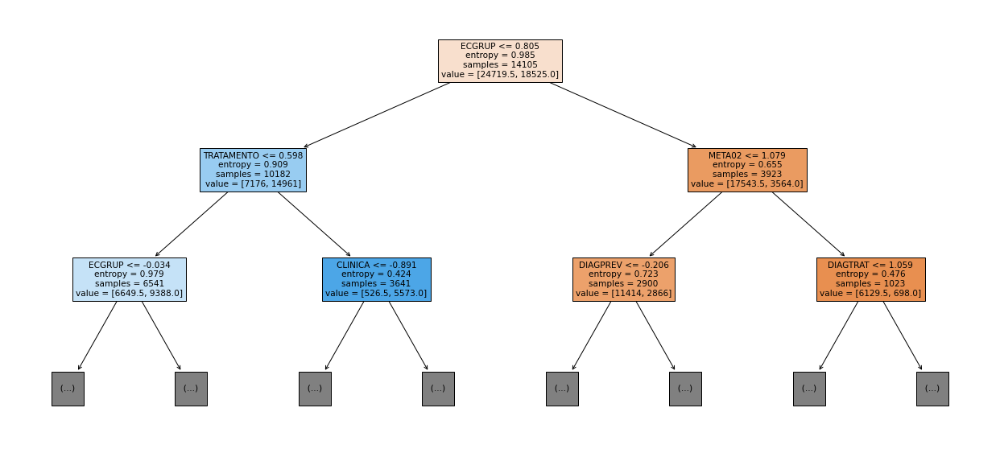

In [ ]:
show_tree(rf_fora, feat_cols_OS, 2)

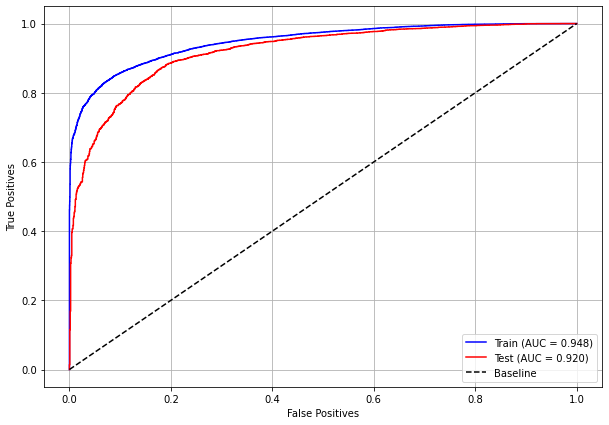

In [ ]:
plot_roc_curve(rf_fora, X_train_OS, X_test_OS, y_train_OS, y_test_OS)

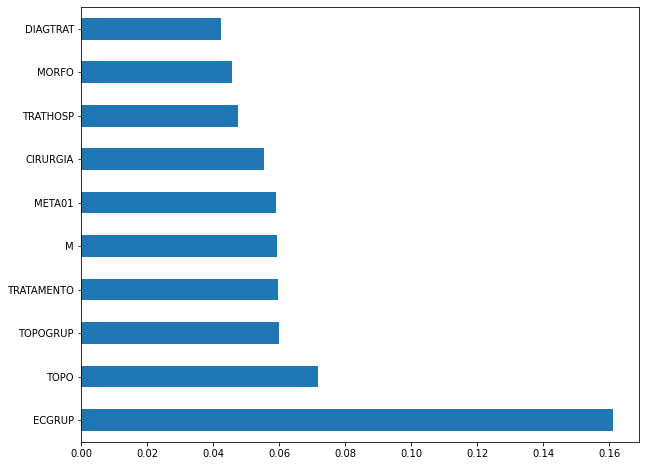

In [ ]:
plot_feat_importances(rf_fora, feat_cols_OS)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `TRATAMENTO`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora).shap_values(X_test_OS)

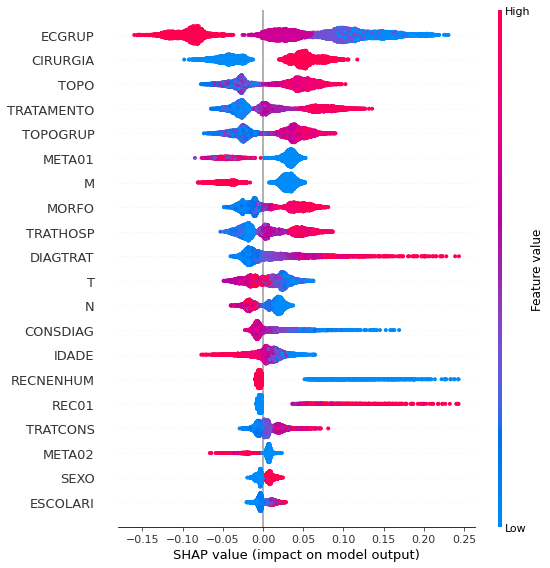

In [ ]:
shap.summary_plot(shap_values[1], X_test_OS, 
                  feature_names=feat_cols_OS)

### **XGBoost**


The training of the XGBoost model follows the same pattern with `random_state`. A higher weight was also used for the class with fewer examples, using the hyperparameter `scale_pos_weight`.

The hyperparameter `max_depth` was chosen as 10 because the default value for this hyperparameter is 3, a low value for the amount of data we have.

In [ ]:
# SP
xgboost_sp = xgb.XGBClassifier(max_depth=10, 
                               scale_pos_weight=0.225,
                               random_state=seed)

xgboost_sp.fit(X_train_SP, y_train_SP)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.225)

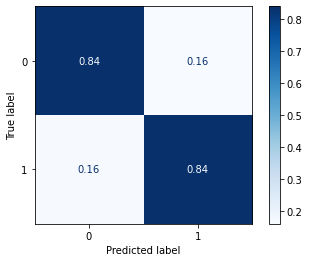

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgboost_sp, X_test_SP, y_test_SP, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data, shows a good performance of the model, with 84% of accuracy.


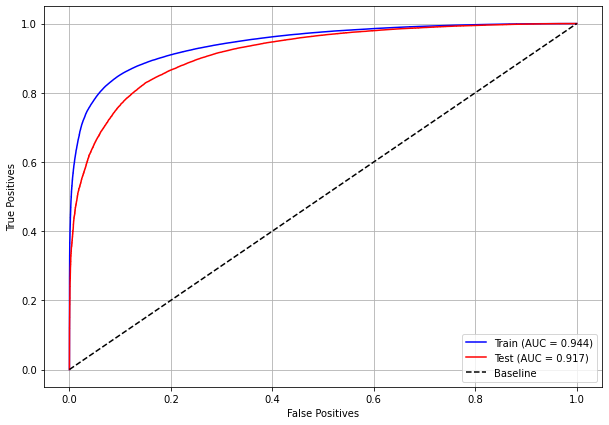

In [ ]:
plot_roc_curve(xgboost_sp, X_train_SP, X_test_SP, y_train_SP, y_test_SP)

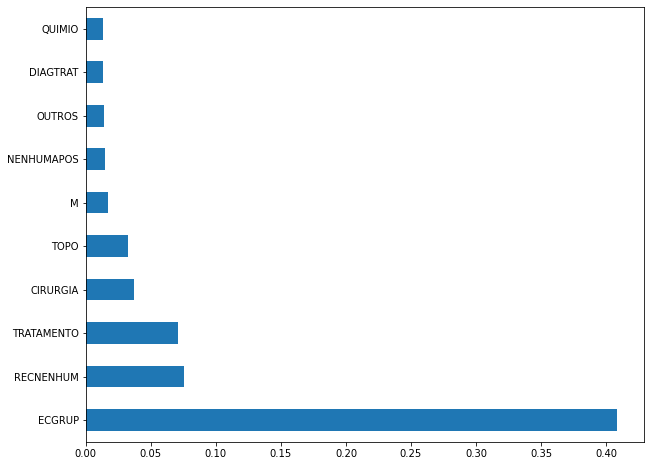

In [ ]:
plot_feat_importances(xgboost_sp, feat_cols_SP)

> The four most important features in the model were `ECGRUP`, `RECNENHUM`, `TRATAMENTO` and `CIRURGIA`.

In [ ]:
shap_values = shap.TreeExplainer(xgboost_sp).shap_values(X_test_SP)

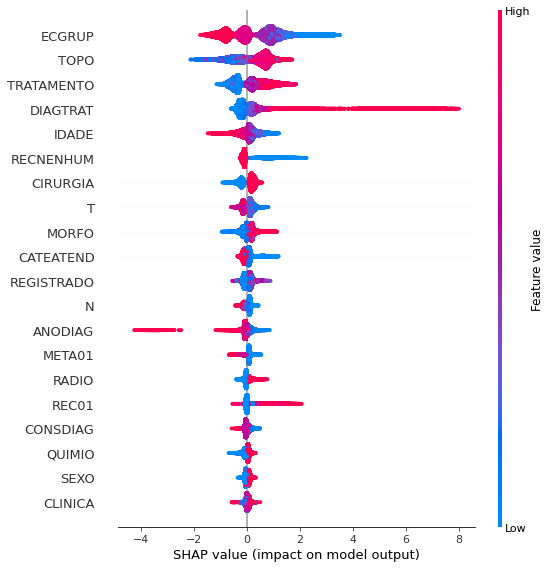

In [ ]:
shap.summary_plot(shap_values, X_test_SP, 
                  feature_names=feat_cols_SP)

In [ ]:
# Other states 
xgboost_fora = xgb.XGBClassifier(max_depth=10, 
                                 scale_pos_weight=0.108,
                                 random_state=seed)

xgboost_fora.fit(X_train_OS, y_train_OS)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.108)

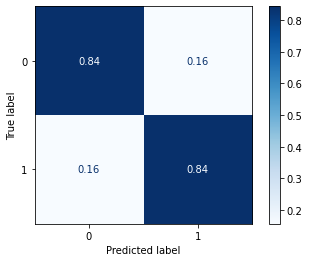

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgboost_fora, X_test_OS, y_test_OS, cmap='Blues', 
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost algorithm, with other states data, shows a good performance of the model, because the model achieves a 84% of accuracy.


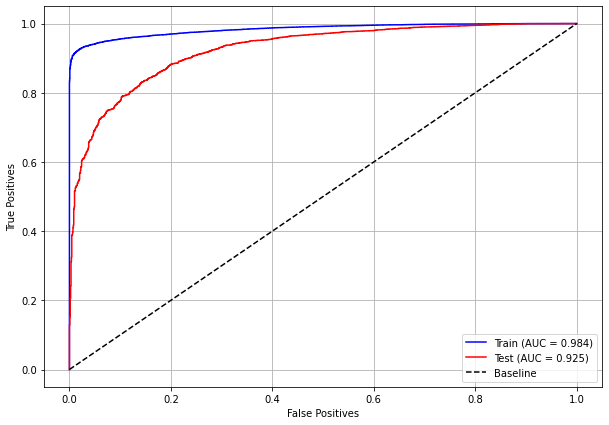

In [ ]:
plot_roc_curve(xgboost_fora, X_train_OS, X_test_OS, y_train_OS, y_test_OS)

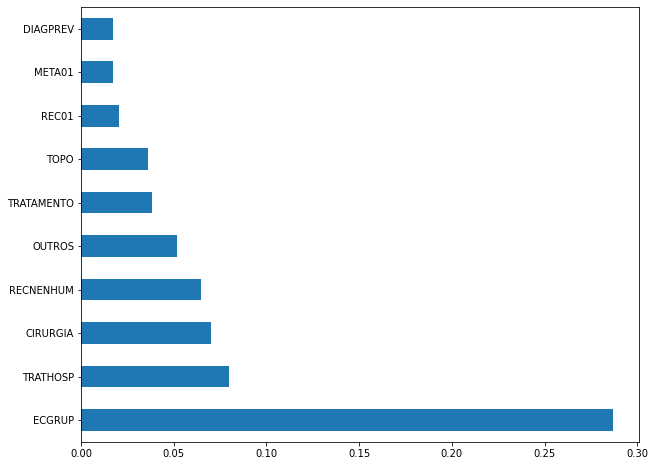

In [ ]:
plot_feat_importances(xgboost_fora, feat_cols_OS)

> The four most important features in the model were `ECGRUP`, `TRATHOSP`, `CIRURGIA` and `RECNENHUM`.

In [ ]:
shap_values = shap.TreeExplainer(xgboost_fora).shap_values(X_test_OS)

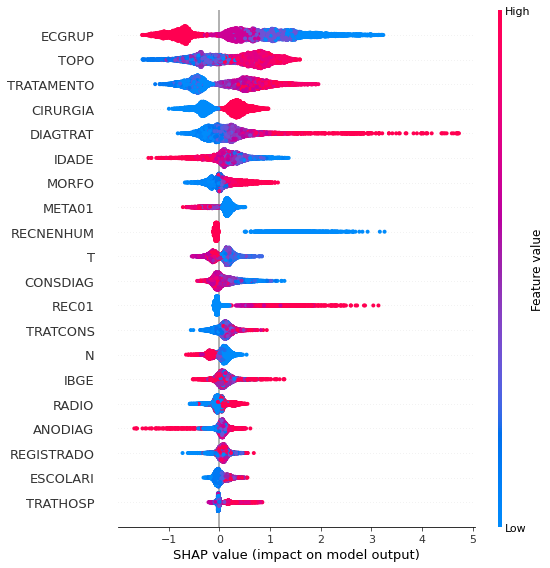

In [ ]:
shap.summary_plot(shap_values, X_test_OS, 
                  feature_names=feat_cols_OS)

# **Fourth approach**

Approach with grouped years and without the column `EC`.

## **Preprocessing**

Now we are going to divide the data into training and testing, and then do the preprocessing in both datasets to perform the training of the models and their evaluation. We will use the years grouped too, resulting in 5 datasets for SP and more 5 for other states.

First, it is necessary to define the columns that will be used as features and the label. We will not use some columns of the datasets: `UFRESID`, because we already have the division between SP and other states in the two datasets.

It was chosen to keep the column `IDADE`, so we will not use the `FAIXAETAR`, as well as the column `ECGRUP` and not the column `EC`. Finally, the other columns contained in the list `list_drop` are possible labels, so they will not be used as features for machine learning models.

In [ ]:
list_drop = ['UFRESID', 'FAIXAETAR', 'ULTICONS', 'ULTIDIAG', 'ULTITRAT', 
             'obito_geral', 'obito_cancer', 'vivo_ano3', 'vivo_ano5', 'ULTINFO', 
             'EC']

# 'RECNENHUM', 'RECLOCAL', 'RECREGIO', 'REC01', 'REC02', 'REC03', 'RECDIST'

lb = 'vivo_ano1'

A function was created to perform the preprocessing, `preprocessing`, that uses the other functions created, `get_train_test` (divides the dataset into train and test sets), `train_preprocessing` (do the preprocessing of the train set) and `test_preprocessing` (do the preprocessing of the test set). 

The process will be done 5 times for SP and other states, using the datasets with grouped years.

> To see the complete function go to the [functions section](https://cancer-project.readthedocs.io/en/latest/Cancer%20Libraries%20and%20functions.html#Models).

### **SP**

In [ ]:
X_trainSP_00_03, X_testSP_00_03, y_trainSP_00_03, y_testSP_00_03, feat_SP_00_03 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2000, 
                                                                                                last_year=2003, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (47196, 65), X_test = (15732, 65)
y_train = (47196,), y_test = (15732,)


In [ ]:
X_trainSP_04_07, X_testSP_04_07, y_trainSP_04_07, y_testSP_04_07, feat_SP_04_07 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2004, 
                                                                                                last_year=2007,
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')                                                            

X_train = (59781, 65), X_test = (19928, 65)
y_train = (59781,), y_test = (19928,)


In [ ]:
X_trainSP_08_11, X_testSP_08_11, y_trainSP_08_11, y_testSP_08_11, feat_SP_08_11 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2008, 
                                                                                                last_year=2011, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (80382, 65), X_test = (26795, 65)
y_train = (80382,), y_test = (26795,)


In [ ]:
X_trainSP_12_15, X_testSP_12_15, y_trainSP_12_15, y_testSP_12_15, feat_SP_12_15 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2012, 
                                                                                                last_year=2015, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (99850, 65), X_test = (33284, 65)
y_train = (99850,), y_test = (33284,)


In [ ]:
X_trainSP_16_21, X_testSP_16_21, y_trainSP_16_21, y_testSP_16_21, feat_SP_16_21 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2016, 
                                                                                                last_year=2021, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (65067, 65), X_test = (21689, 65)
y_train = (65067,), y_test = (21689,)


### **Other states**

In [ ]:
X_trainOS_00_03, X_testOS_00_03, y_trainOS_00_03, y_testOS_00_03, feat_OS_00_03 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2000, 
                                                                                                last_year=2003, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (2694, 65), X_test = (899, 65)
y_train = (2694,), y_test = (899,)


In [ ]:
X_trainOS_04_07, X_testOS_04_07, y_trainOS_04_07, y_testOS_04_07, feat_OS_04_07 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2004, 
                                                                                                last_year=2007, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (3738, 65), X_test = (1246, 65)
y_train = (3738,), y_test = (1246,)


In [ ]:
X_trainOS_08_11, X_testOS_08_11, y_trainOS_08_11, y_testOS_08_11, feat_OS_08_11 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2008, 
                                                                                                last_year=2011, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (4652, 65), X_test = (1551, 65)
y_train = (4652,), y_test = (1551,)


In [ ]:
X_trainOS_12_15, X_testOS_12_15, y_trainOS_12_15, y_testOS_12_15, feat_OS_12_15 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2012, 
                                                                                                last_year=2015, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (6019, 65), X_test = (2007, 65)
y_train = (6019,), y_test = (2007,)


In [ ]:
X_trainOS_16_20, X_testOS_16_20, y_trainOS_16_20, y_testOS_16_20, feat_OS_16_20 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2016, 
                                                                                                last_year=2020, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (5223, 65), X_test = (1742, 65)
y_train = (5223,), y_test = (1742,)


## **Training and evaluation of the models**

After dividing the data into training and testing, using the encoder and normalizing, the data is ready to be used by the machine learning models.

### **Random Forest**


The first model is the Random Forest, the `random_state` will be used as a parameter, to obtain the same training values of the model every time it is runned.

The hyperparameter `class_weight` was used because the models have difficulty to learn the class with fewer examples.

**SP**

In [ ]:
# SP - 2000 to 2003
rf_sp_00_03 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:3.35, 1:1},
                                     criterion='entropy',
                                     max_depth=10)

rf_sp_00_03.fit(X_trainSP_00_03, y_trainSP_00_03)

RandomForestClassifier(class_weight={0: 3.35, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

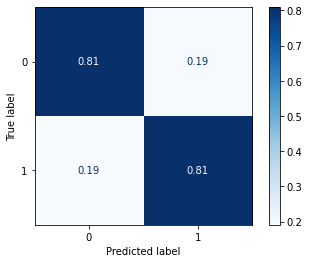

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_00_03, y_testSP_00_03, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2000 to 2003, shows a good performance of the model, with 81% of accuracy.


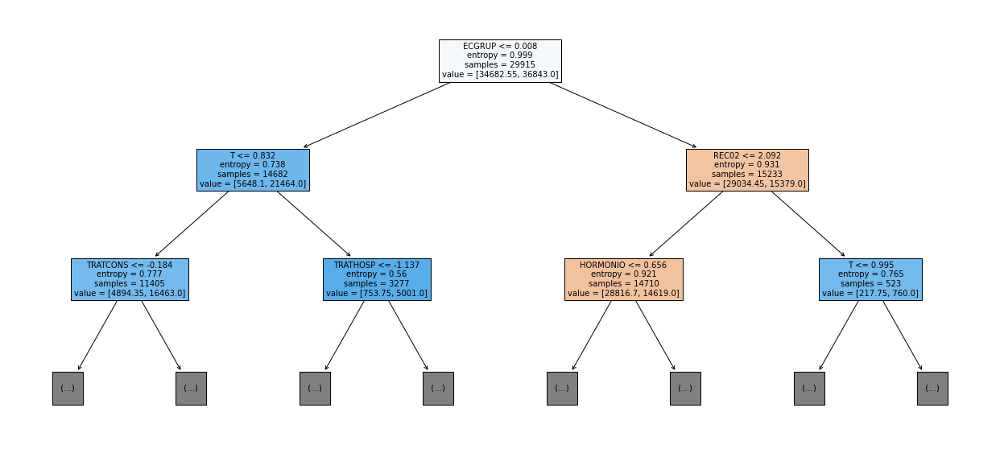

In [ ]:
show_tree(rf_sp_00_03, feat_SP_00_03, 2)

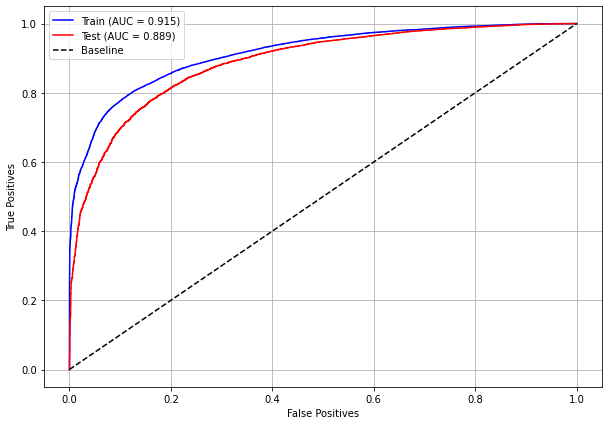

In [ ]:
plot_roc_curve(rf_sp_00_03, X_trainSP_00_03, X_testSP_00_03, y_trainSP_00_03, y_testSP_00_03)

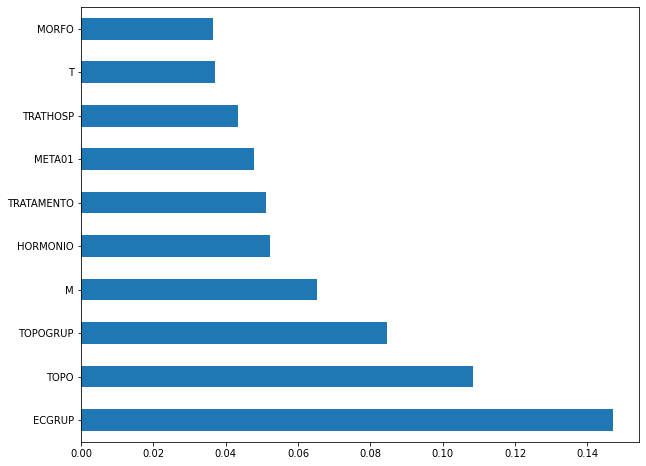

In [ ]:
plot_feat_importances(rf_sp_00_03, feat_SP_00_03)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP`, and `M`. 

In [ ]:
shap_values = shap.TreeExplainer(rf_sp_00_03).shap_values(X_testSP_00_03)

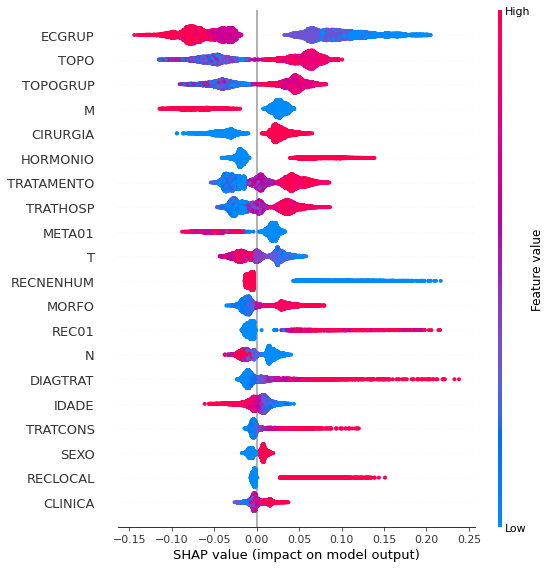

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_00_03, 
                  feature_names=feat_SP_00_03)

In [ ]:
# SP - 2004 to 2007
rf_sp_04_07 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:4.3, 1:1},
                                     criterion='entropy',
                                     max_depth=10)

rf_sp_04_07.fit(X_trainSP_04_07, y_trainSP_04_07)

RandomForestClassifier(class_weight={0: 4.3, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

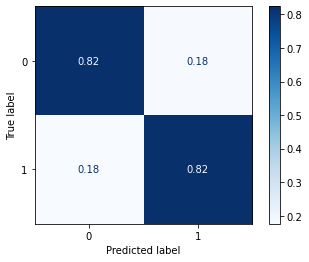

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_04_07, X_testSP_04_07, y_testSP_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2004 to 2007, shows a good performance of the model, with 82% of accuracy.

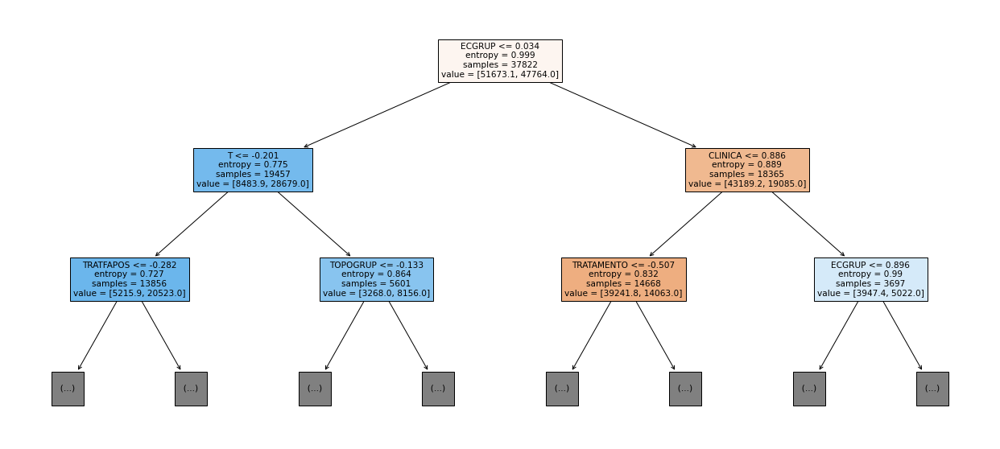

In [ ]:
show_tree(rf_sp_04_07, feat_SP_04_07, 2)

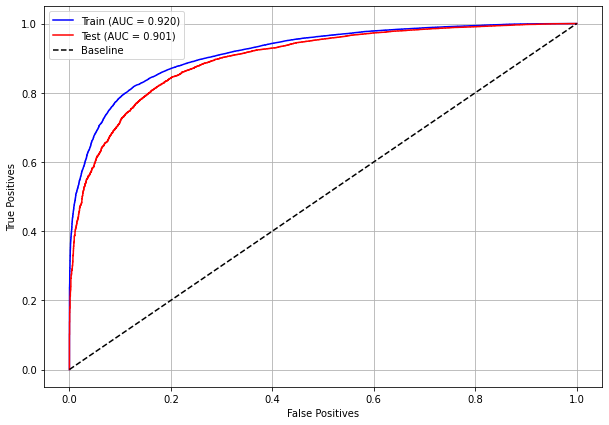

In [ ]:
plot_roc_curve(rf_sp_04_07, X_trainSP_04_07, X_testSP_04_07, y_trainSP_04_07, y_testSP_04_07)

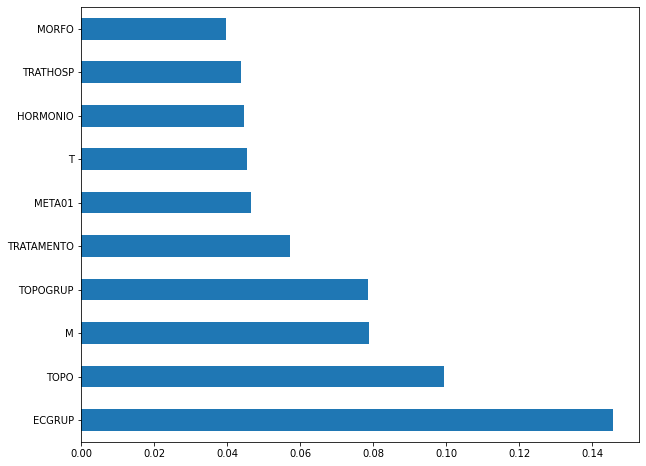

In [ ]:
plot_feat_importances(rf_sp_04_07, feat_SP_04_07)

> The four most important features in the model were `ECGRUP`, `TOPO`, `M` and `TOPOGRUP`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp_04_07).shap_values(X_testSP_04_07)

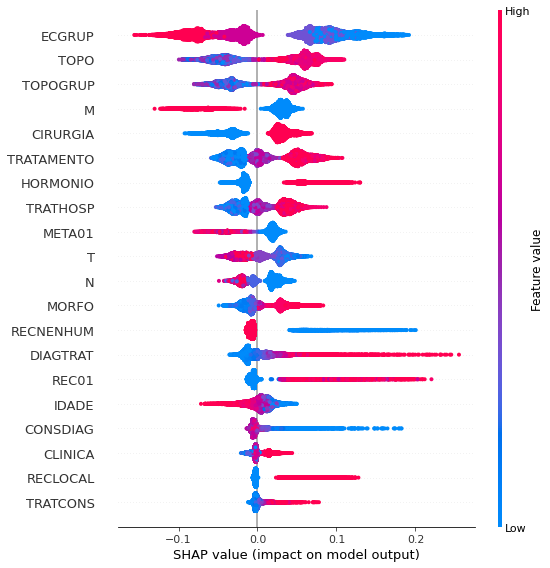

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_04_07, 
                  feature_names=feat_SP_04_07)

In [ ]:
# SP - 2008 to 2011
rf_sp_08_11 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:4.51, 1:1},
                                     criterion='entropy',
                                     max_depth=10)

rf_sp_08_11.fit(X_trainSP_08_11, y_trainSP_08_11)

RandomForestClassifier(class_weight={0: 4.51, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

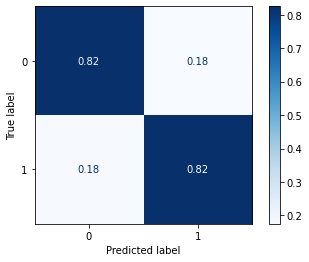

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_08_11, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2008 to 2011, shows a good performance of the model, with 82% of accuracy.

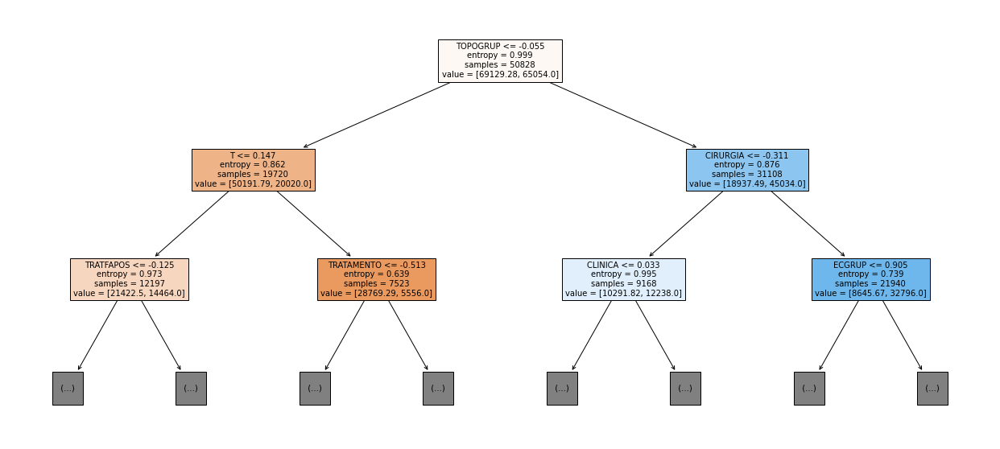

In [ ]:
show_tree(rf_sp_08_11, feat_SP_08_11, 2)

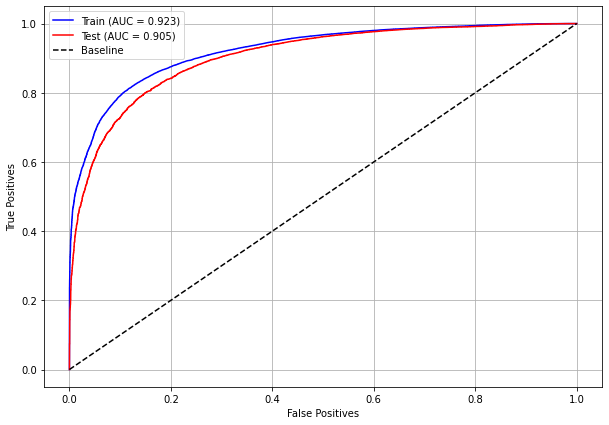

In [ ]:
plot_roc_curve(rf_sp_08_11, X_trainSP_08_11, X_testSP_08_11, y_trainSP_08_11, y_testSP_08_11)

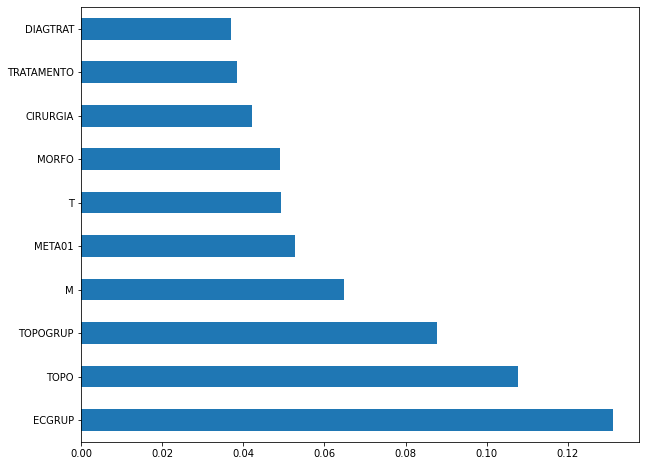

In [ ]:
plot_feat_importances(rf_sp_08_11, feat_SP_08_11)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp_08_11).shap_values(X_testSP_08_11)

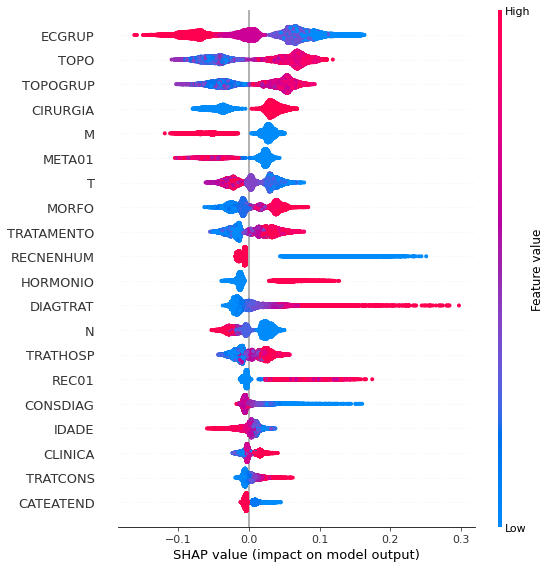

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_08_11, 
                  feature_names=feat_SP_08_11)

In [ ]:
# SP - 2012 to 2015
rf_sp_12_15 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:5.5, 1:1},
                                     criterion='entropy',
                                     max_depth=10)

rf_sp_12_15.fit(X_trainSP_12_15, y_trainSP_12_15)

RandomForestClassifier(class_weight={0: 5.5, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

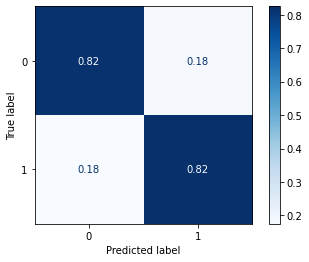

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_12_15, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2012 to 2015, shows a good performance of the model with 82% of accuracy.

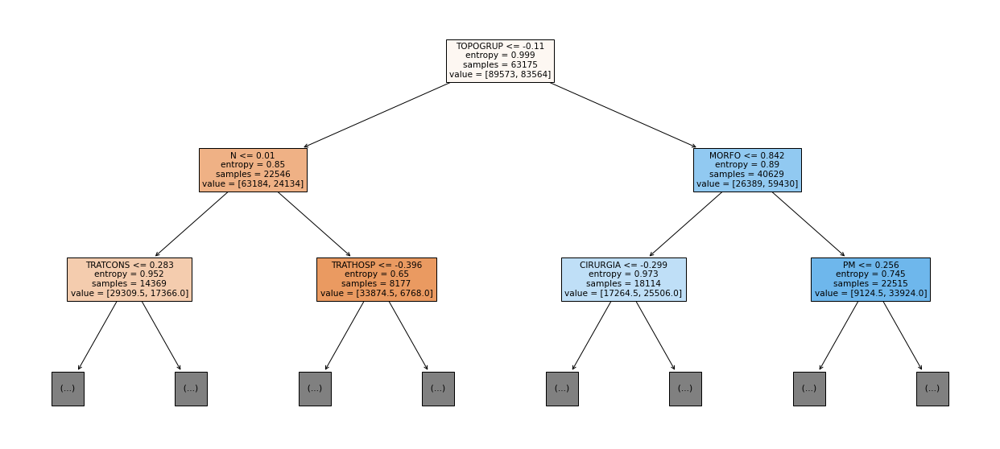

In [ ]:
show_tree(rf_sp_12_15, feat_SP_12_15, 2)

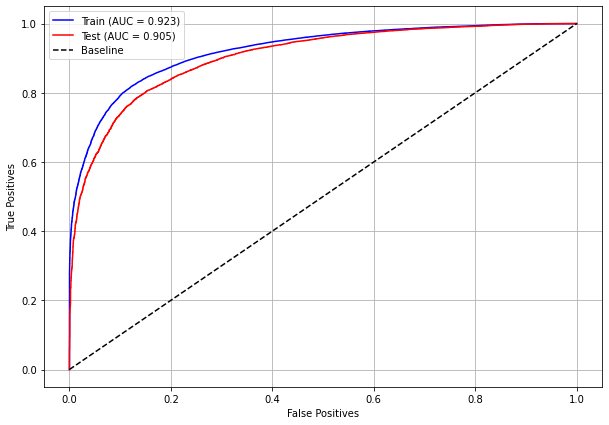

In [ ]:
plot_roc_curve(rf_sp_12_15, X_trainSP_12_15, X_testSP_12_15, y_trainSP_12_15, y_testSP_12_15)

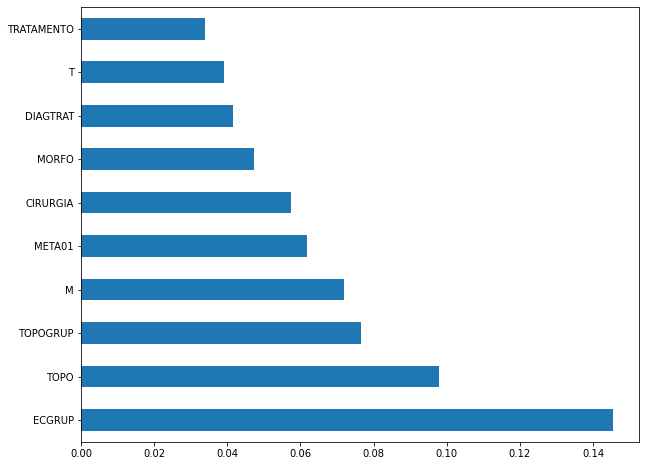

In [ ]:
plot_feat_importances(rf_sp_12_15, feat_SP_12_15)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp_12_15).shap_values(X_testSP_12_15)

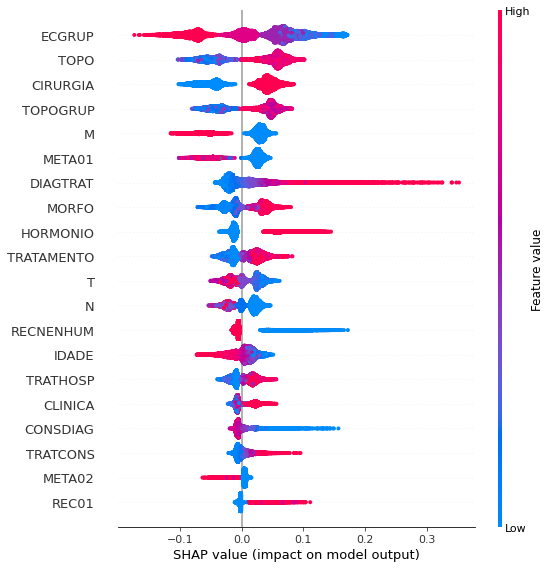

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_12_15, 
                  feature_names=feat_SP_12_15)

In [ ]:
# SP - 2016 to 2021
rf_sp_16_21 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:4.6, 1:1},
                                     criterion='entropy', 
                                     max_depth=10)

rf_sp_16_21.fit(X_trainSP_16_21, y_trainSP_16_21)

RandomForestClassifier(class_weight={0: 4.6, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

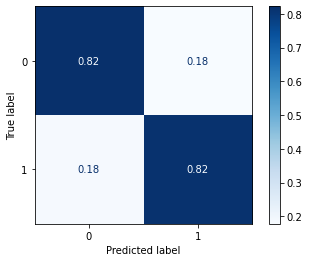

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_16_21, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2016 to 2021, shows a good performance of the model, with 82% of accuracy.

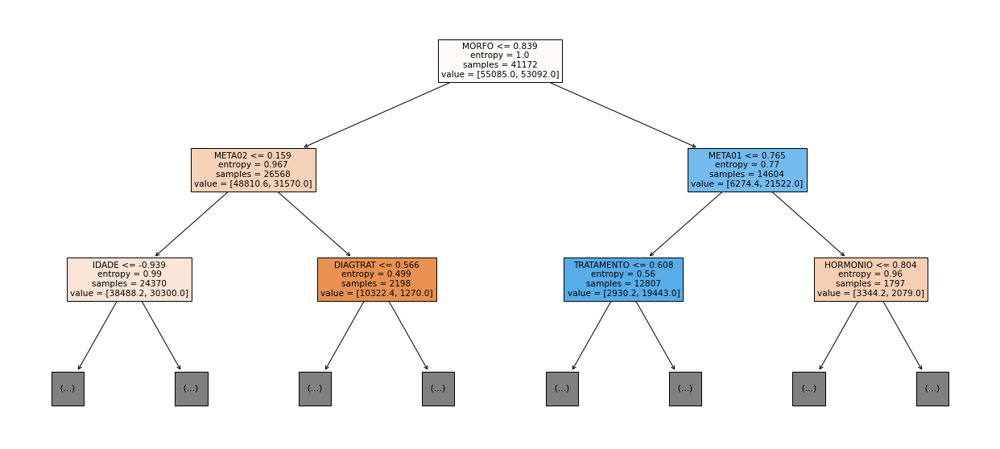

In [ ]:
show_tree(rf_sp_16_21, feat_SP_16_21, 2)

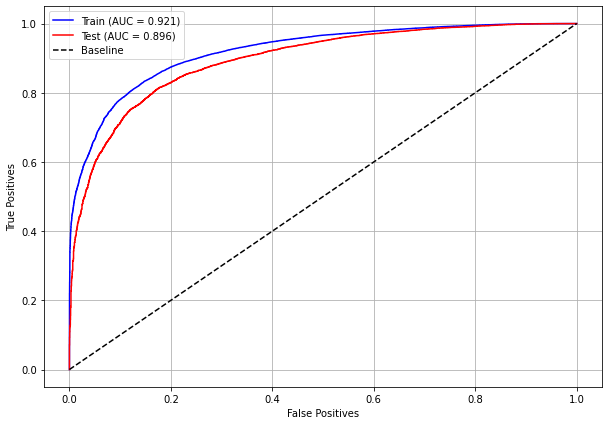

In [ ]:
plot_roc_curve(rf_sp_16_21, X_trainSP_16_21, X_testSP_16_21, y_trainSP_16_21, y_testSP_16_21)

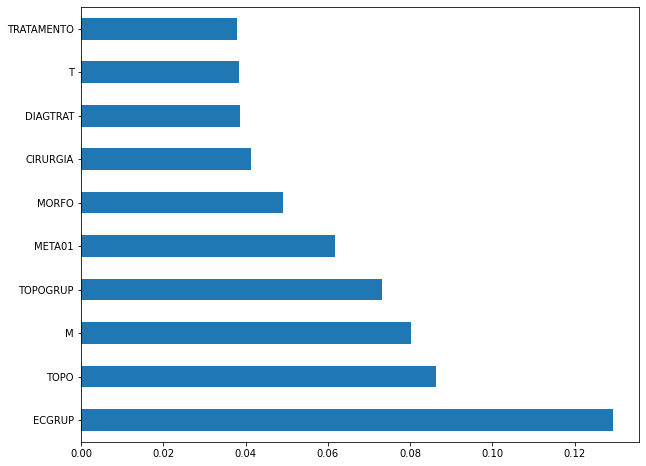

In [ ]:
plot_feat_importances(rf_sp_16_21, feat_SP_16_21)

> The four most important features in the model were `ECGRUP`, `TOPO`, `M`, and `TOPOGRUP`.



In [ ]:
shap_values = shap.TreeExplainer(rf_sp_16_21).shap_values(X_testSP_16_21)

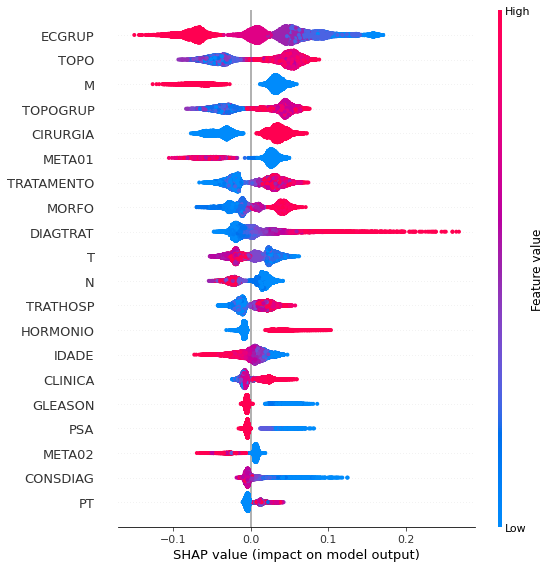

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_16_21, 
                  feature_names=feat_SP_16_21)

**Other states**

In [ ]:
# Other states - 2000 to 2003
rf_fora_00_03 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:13, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_00_03.fit(X_trainOS_00_03, y_trainOS_00_03)

RandomForestClassifier(class_weight={0: 13, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

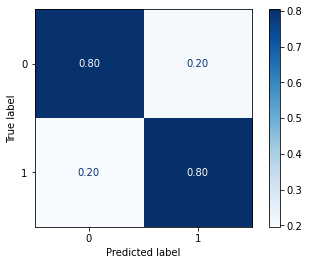

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_00_03, y_testOS_00_03, 
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2000 to 2003, also shows a good performance of the model, and we have a balanced main diagonal with 80% of accuracy.

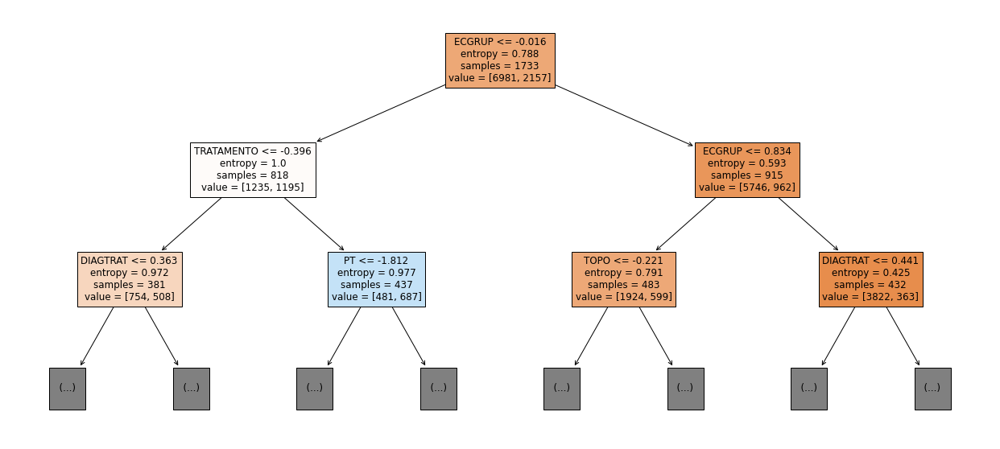

In [ ]:
show_tree(rf_fora_00_03, feat_OS_00_03, 2)

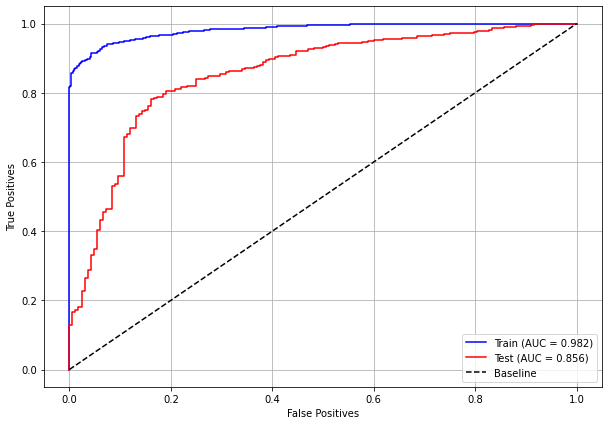

In [ ]:
plot_roc_curve(rf_fora_00_03, X_trainOS_00_03, X_testOS_00_03, y_trainOS_00_03, y_testOS_00_03)

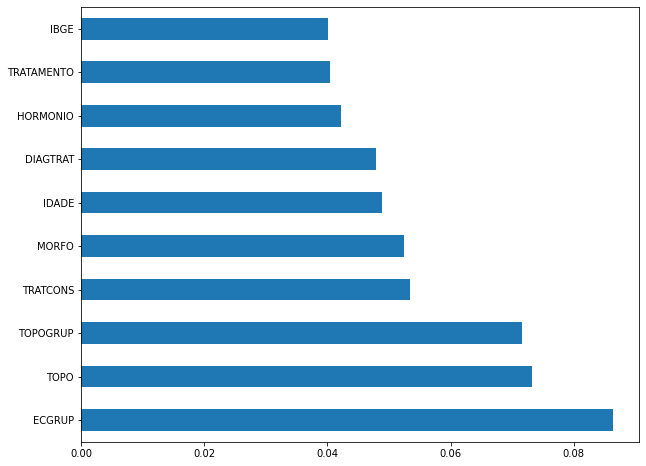

In [ ]:
plot_feat_importances(rf_fora_00_03, feat_OS_00_03)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `TRATCONS`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_00_03).shap_values(X_testOS_00_03)

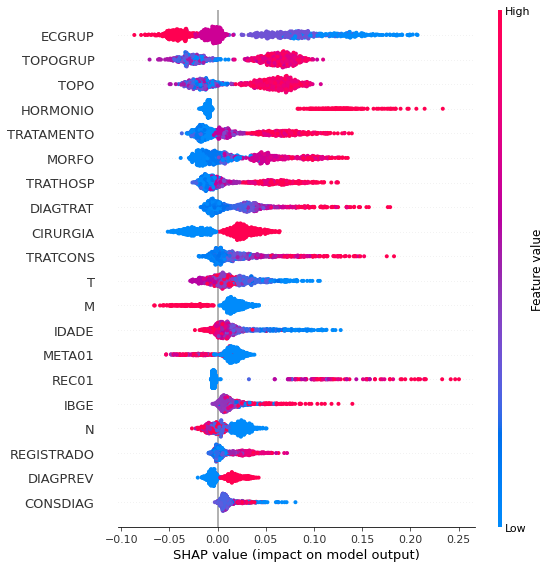

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_00_03, 
                  feature_names=feat_OS_00_03)

In [ ]:
# Other states - 2004 to 2007
rf_fora_04_07 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:18, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_04_07.fit(X_trainOS_04_07, y_trainOS_04_07)

RandomForestClassifier(class_weight={0: 18, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

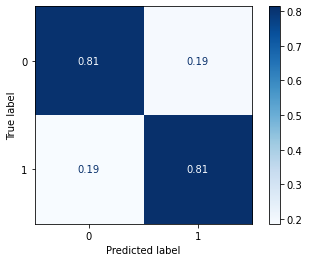

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_04_07, X_testOS_04_07, y_testOS_04_07, 
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2004 to 2007, also shows a good performance of the model, with 81% of accuracy.


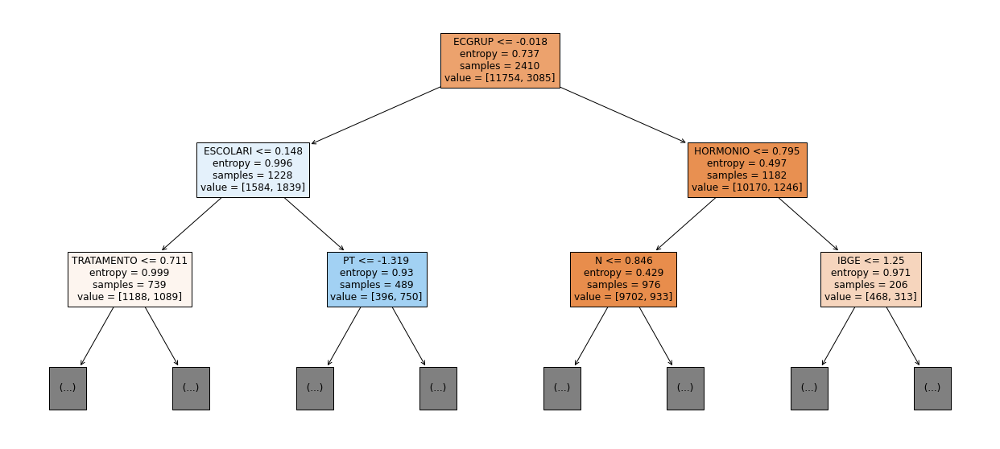

In [ ]:
show_tree(rf_fora_04_07, feat_OS_04_07, 2)

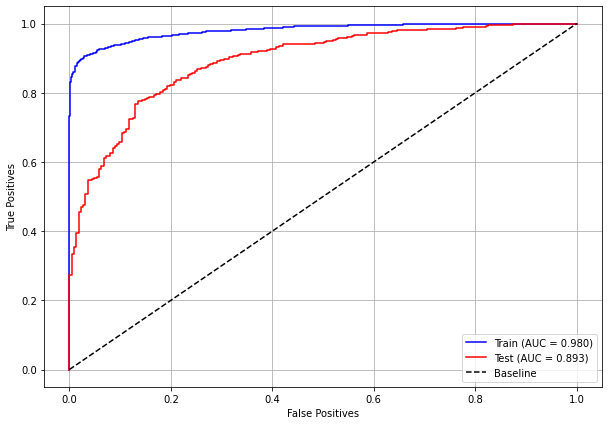

In [ ]:
plot_roc_curve(rf_fora_04_07, X_trainOS_04_07, X_testOS_04_07, y_trainOS_04_07, y_testOS_04_07)

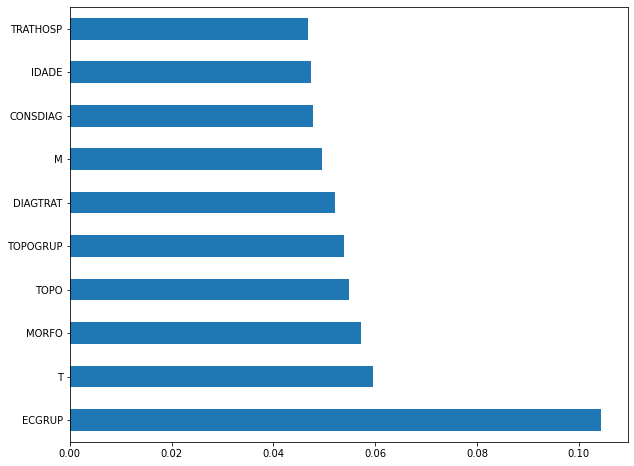

In [ ]:
plot_feat_importances(rf_fora_04_07, feat_OS_04_07)

> The four most important features in the model were `ECGRUP`, `T`, `MORFO` and `TOPO`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_04_07).shap_values(X_testOS_04_07)

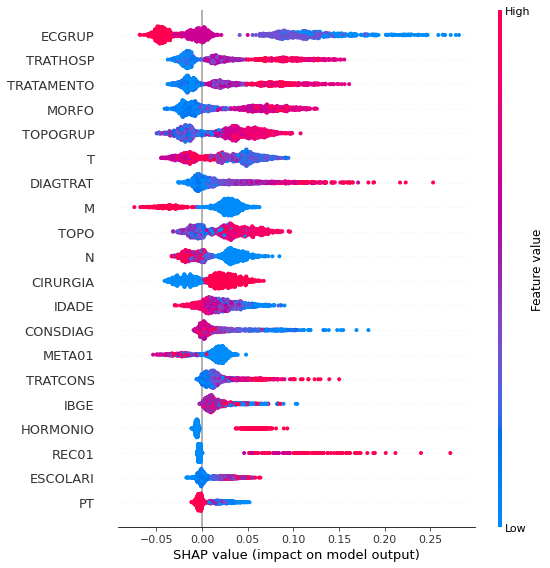

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_04_07, 
                  feature_names=feat_OS_04_07)

In [ ]:
# Other states - 2008 to 2011
rf_fora_08_11 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:20, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_08_11.fit(X_trainOS_08_11, y_trainOS_08_11)

RandomForestClassifier(class_weight={0: 20, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

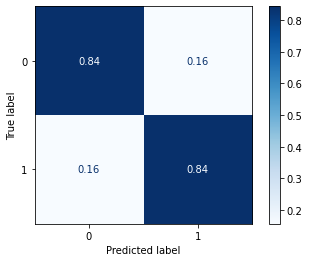

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_08_11, X_testOS_08_11, y_testOS_08_11,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2008 to 2011, also shows a good performance of the model, presenting 84% of accuracy.


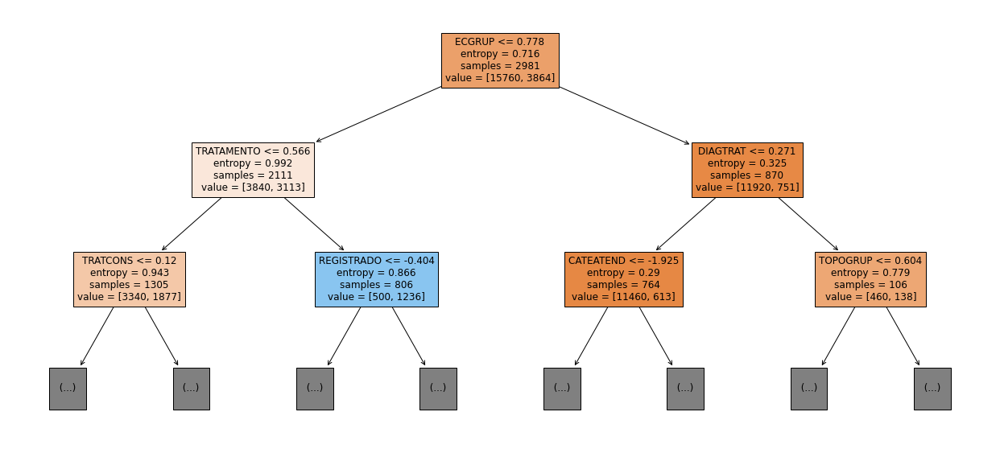

In [ ]:
show_tree(rf_fora_08_11, feat_OS_08_11, 2)

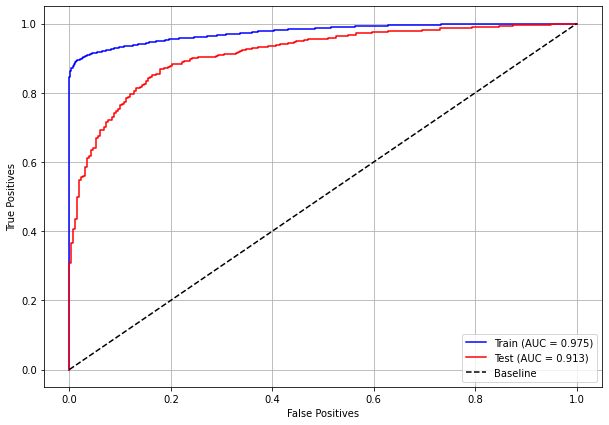

In [ ]:
plot_roc_curve(rf_fora_08_11, X_trainOS_08_11, X_testOS_08_11, y_trainOS_08_11, y_testOS_08_11)

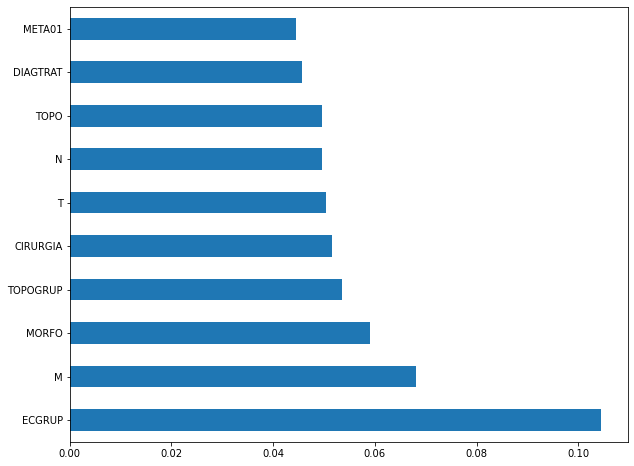

In [ ]:
plot_feat_importances(rf_fora_08_11, feat_OS_08_11)

> The four most important features in the model were `ECGRUP`, `M`, `MORFO` and `TOPOGRUP`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_08_11).shap_values(X_testOS_08_11)

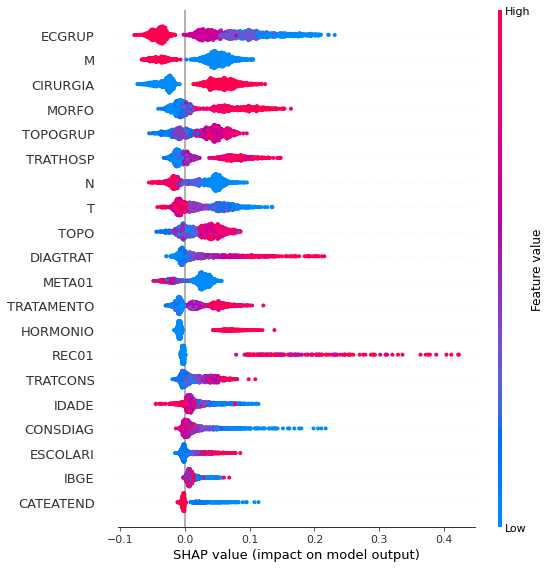

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_08_11, 
                  feature_names=feat_OS_08_11)

In [ ]:
# Other states - 2012 to 2015
rf_fora_12_15 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:14.5, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_12_15.fit(X_trainOS_12_15, y_trainOS_12_15)

RandomForestClassifier(class_weight={0: 14.5, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

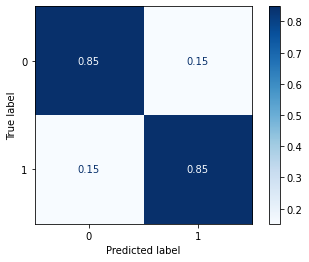

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_12_15, X_testOS_12_15, y_testOS_12_15,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2012 to 2015, also shows a good performance of the model, presenting 85% of accuracy.


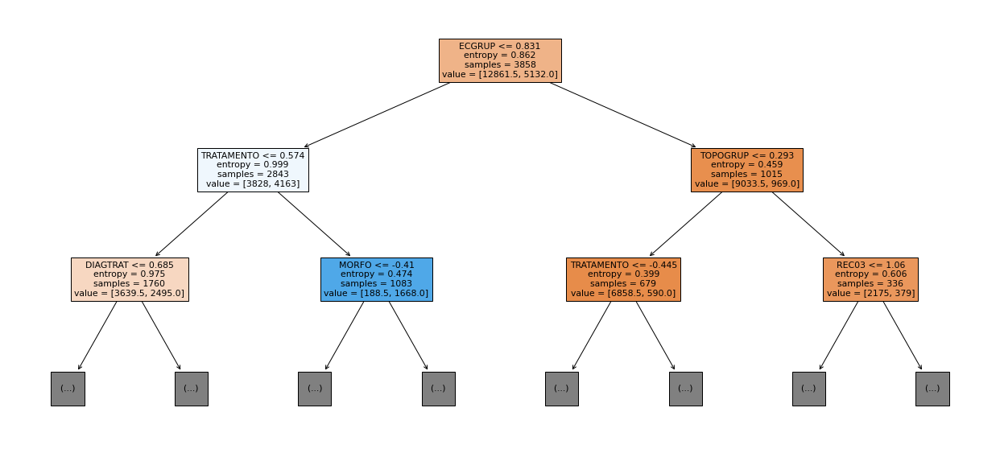

In [ ]:
show_tree(rf_fora_12_15, feat_OS_12_15, 2)

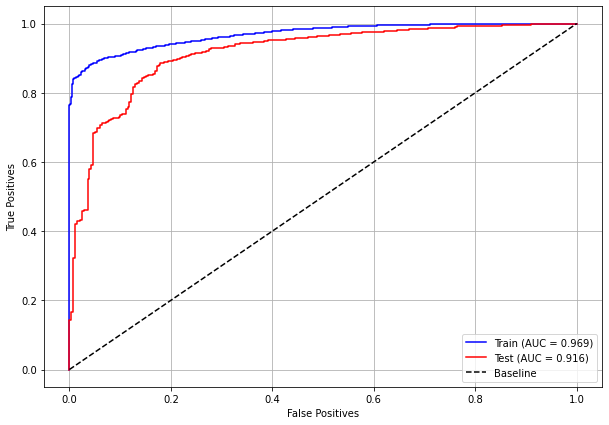

In [ ]:
plot_roc_curve(rf_fora_12_15, X_trainOS_12_15, X_testOS_12_15, y_trainOS_12_15, y_testOS_12_15)

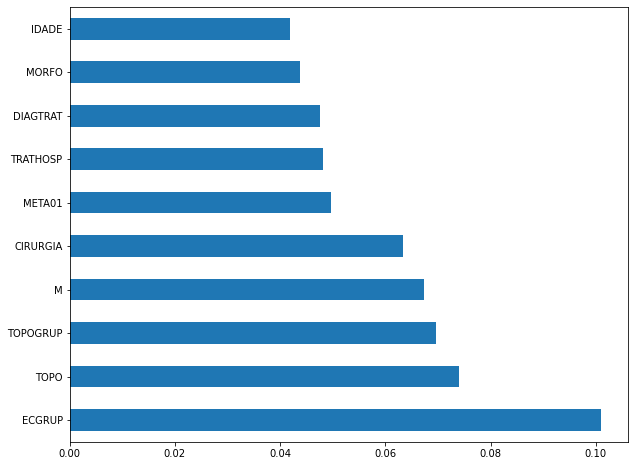

In [ ]:
plot_feat_importances(rf_fora_12_15, feat_OS_12_15)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_12_15).shap_values(X_testOS_12_15)

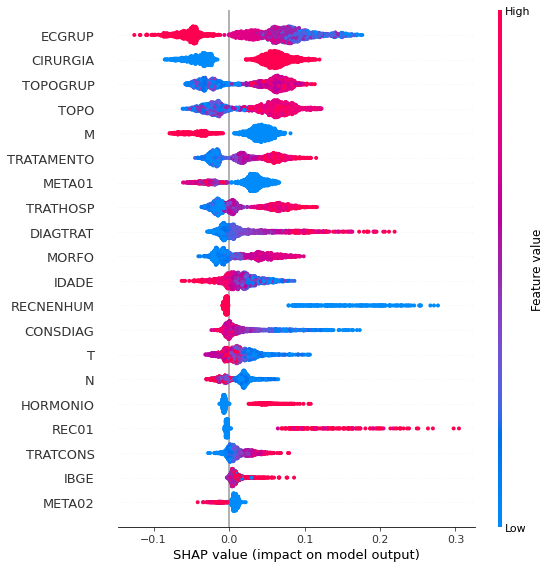

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_12_15, 
                  feature_names=feat_OS_12_15)

In [ ]:
# Other states - 2016 to 2020
rf_fora_16_20 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:18, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_16_20.fit(X_trainOS_16_20, y_trainOS_16_20)

RandomForestClassifier(class_weight={0: 18, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

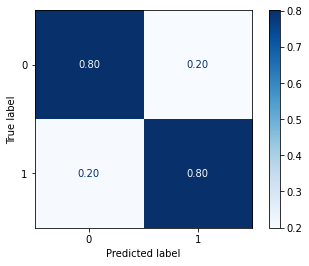

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_16_20, X_testOS_16_20, y_testOS_16_20,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2016 to 2020, also shows a good performance of the model, presenting 80% of accuracy.


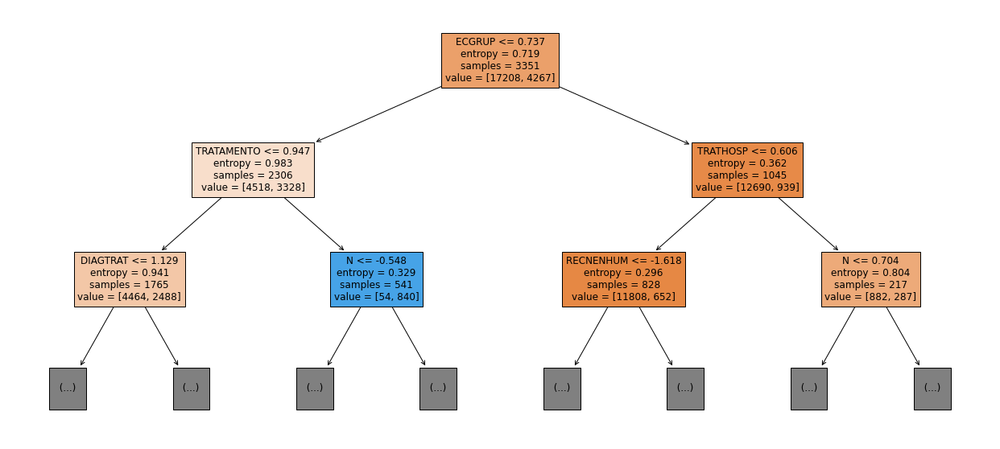

In [ ]:
show_tree(rf_fora_16_20, feat_OS_16_20, 2)

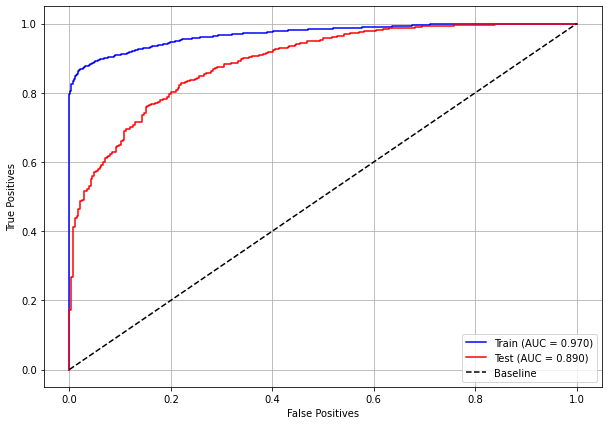

In [ ]:
plot_roc_curve(rf_fora_16_20, X_trainOS_16_20, X_testOS_16_20, y_trainOS_16_20, y_testOS_16_20)

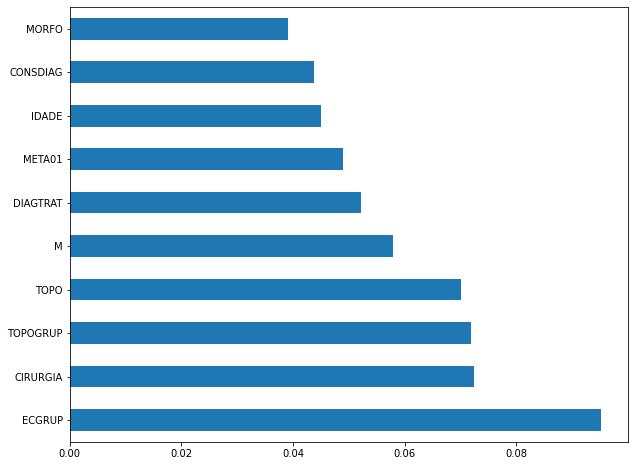

In [ ]:
plot_feat_importances(rf_fora_16_20, feat_OS_16_20)

> The four most important features in the model were `ECGRUP`, `CIRURGIA`, `TOPOGRUP` and `TOPO`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_16_20).shap_values(X_testOS_16_20)

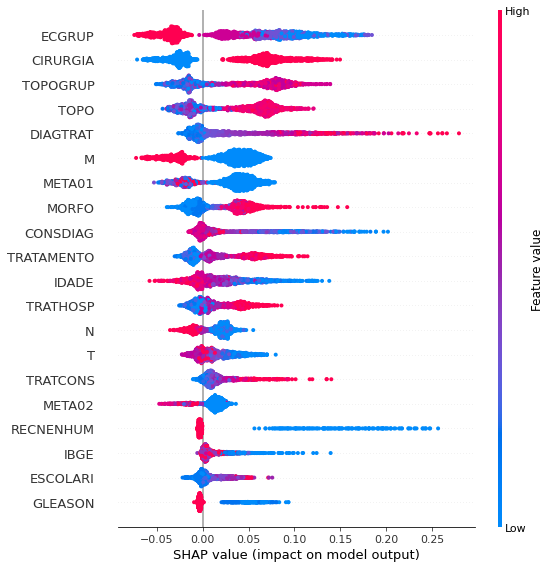

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_16_20, 
                  feature_names=feat_OS_16_20)

### **XGBoost**


The training of the XGBoost models follows the same pattern with `random_state`. The hyperparameter `scale_pos_weight` was also used in the trainings, in order to obtain a balanced main diagonal in the confusion matrix.

The hyperparameter `max_depth` was chosen as 10 because the default value for this hyperparameter is 3, a low value for the amount of data we have.

**SP**

In [ ]:
# SP - 2000 to 2003
xgb_sp_00_03 = xgb.XGBClassifier(max_depth=10, 
                                 random_state=seed, 
                                 scale_pos_weight=0.25)

xgb_sp_00_03.fit(X_trainSP_00_03, y_trainSP_00_03)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.25)

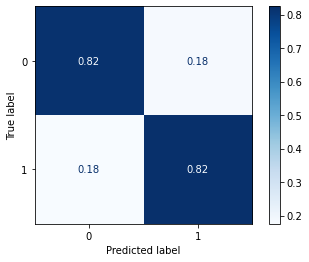

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_00_03, y_testSP_00_03,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2000 to 2003, shows a good performance of the model, here with 82% of accuracy.

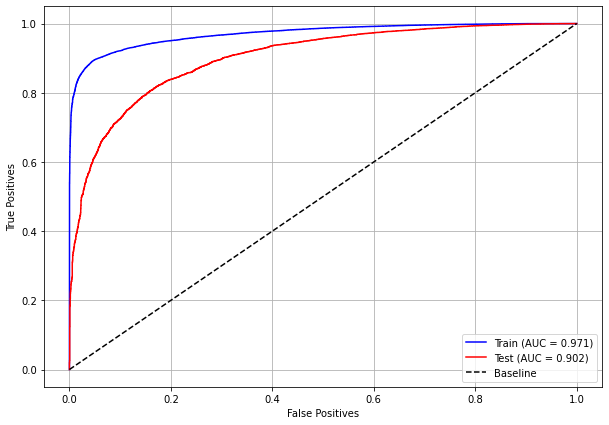

In [ ]:
plot_roc_curve(xgb_sp_00_03, X_trainSP_00_03, X_testSP_00_03, y_trainSP_00_03, y_testSP_00_03)

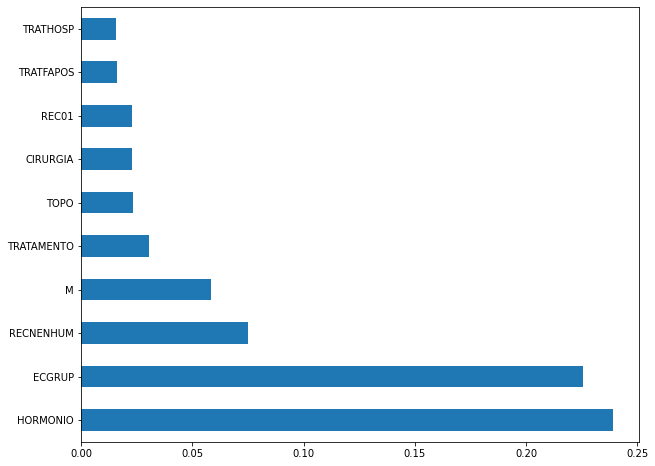

In [ ]:
plot_feat_importances(xgb_sp_00_03, feat_SP_00_03)

> The four most important features in the model were `HORMONIO`, `ECGRUP`, `RECNENHUM` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_00_03).shap_values(X_testSP_00_03)

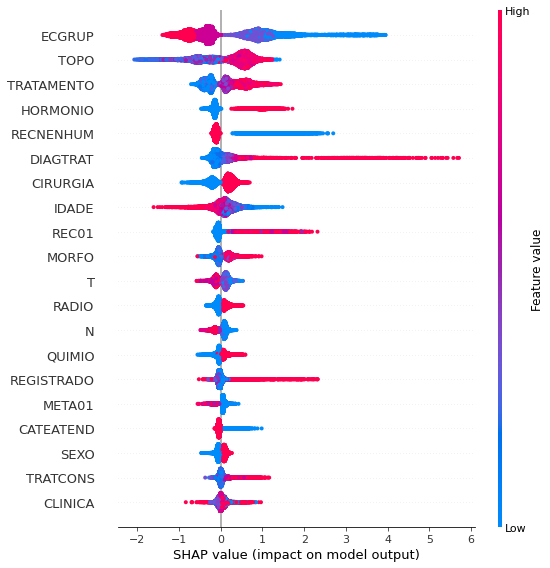

In [ ]:
shap.summary_plot(shap_values, X_testSP_00_03, 
                  feature_names=feat_SP_00_03)

In [ ]:
# SP - 2004 to 2007
xgb_sp_04_07 = xgb.XGBClassifier(max_depth=10, 
                                 random_state=seed, 
                                 scale_pos_weight=0.18)

xgb_sp_04_07.fit(X_trainSP_04_07, y_trainSP_04_07)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.18)

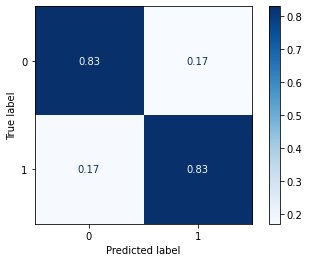

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_04_07, X_testSP_04_07, y_testSP_04_07,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2004 to 2007, shows a good performance of the model, with 83% of accuracy.


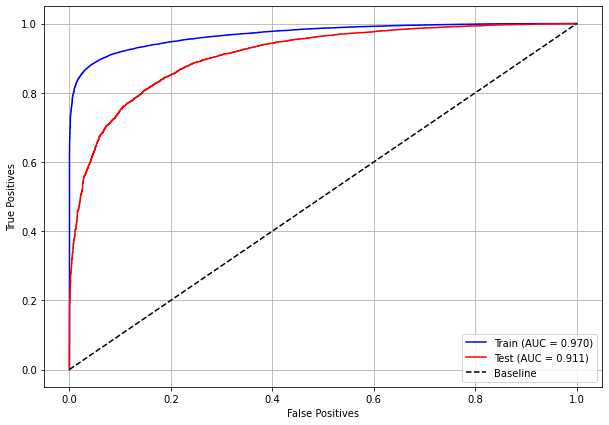

In [ ]:
plot_roc_curve(xgb_sp_04_07, X_trainSP_04_07, X_testSP_04_07, y_trainSP_04_07, y_testSP_04_07)

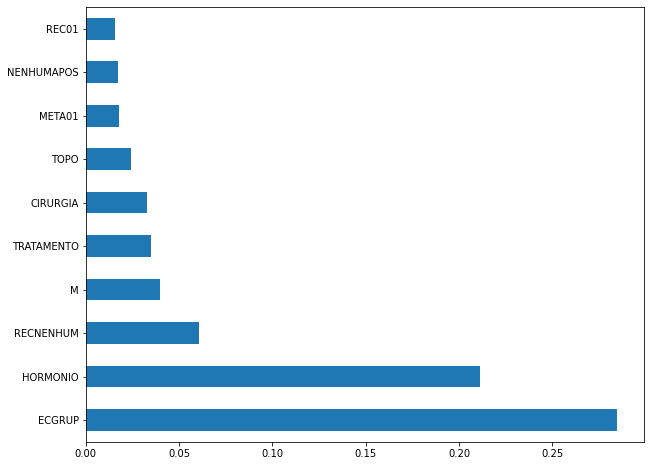

In [ ]:
plot_feat_importances(xgb_sp_04_07, feat_SP_04_07)

> Here we noticed that the most used feature was `ECGRUP`, with some advantage over the others. Following we have `HORMONIO`, `RECNENHUM` and `M`. 

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_04_07).shap_values(X_testSP_04_07)

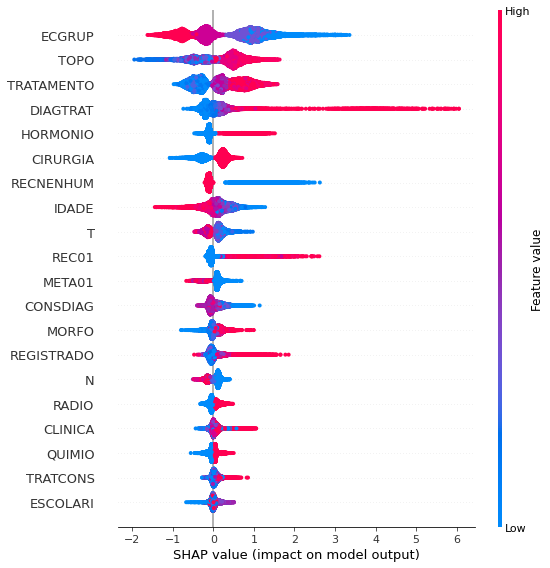

In [ ]:
shap.summary_plot(shap_values, X_testSP_04_07, 
                  feature_names=feat_SP_04_07)

In [ ]:
# SP - 2008 to 2011
xgb_sp_08_11 = xgb.XGBClassifier(max_depth=10, 
                                 scale_pos_weight=0.18,
                                 random_state=seed)

xgb_sp_08_11.fit(X_trainSP_08_11, y_trainSP_08_11)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.18)

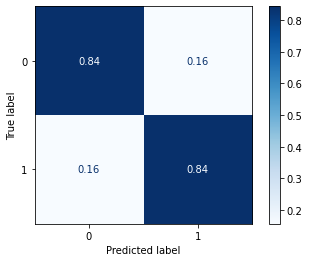

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_08_11, X_testSP_08_11, y_testSP_08_11,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2008 to 2011, shows a good performance of the model, with 84% of accuracy.

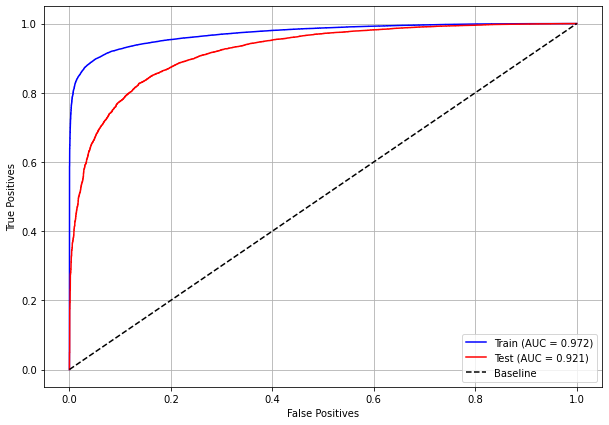

In [ ]:
plot_roc_curve(xgb_sp_08_11, X_trainSP_08_11, X_testSP_08_11, y_trainSP_08_11, y_testSP_08_11)

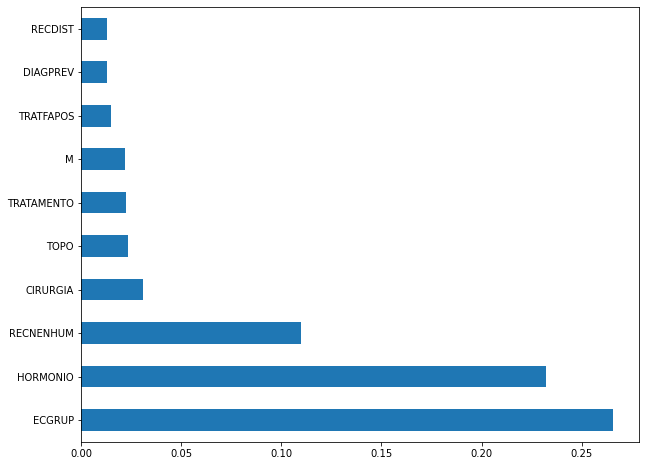

In [ ]:
plot_feat_importances(xgb_sp_08_11, feat_SP_08_11)

> The four most important features in the model were `ECGRUP`, `HORMONIO`, `RECNENHUM` and `CIRURGIA`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_08_11).shap_values(X_testSP_08_11)

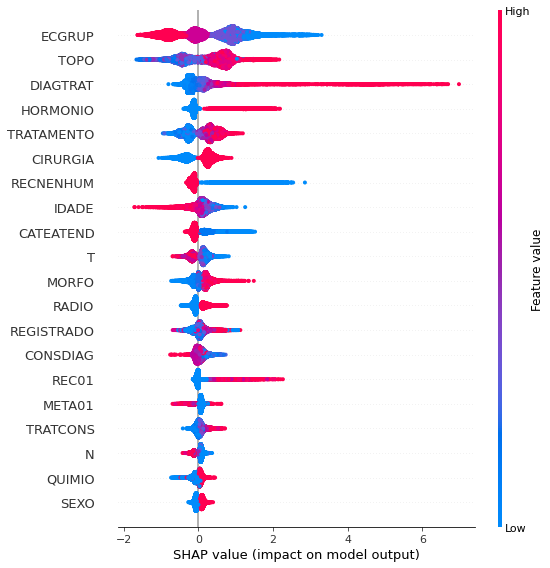

In [ ]:
shap.summary_plot(shap_values, X_testSP_08_11, 
                  feature_names=feat_SP_08_11)

In [ ]:
# SP - 2012 to 2015
xgb_sp_12_15 = xgb.XGBClassifier(max_depth=10, 
                                 random_state=seed,
                                 scale_pos_weight=0.145)

xgb_sp_12_15.fit(X_trainSP_12_15, y_trainSP_12_15)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.145)

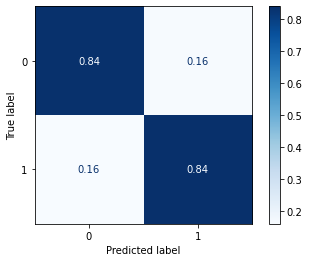

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_12_15, X_testSP_12_15, y_testSP_12_15,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2012 to 2015, shows a good performance of the model, with 84% of accuracy.

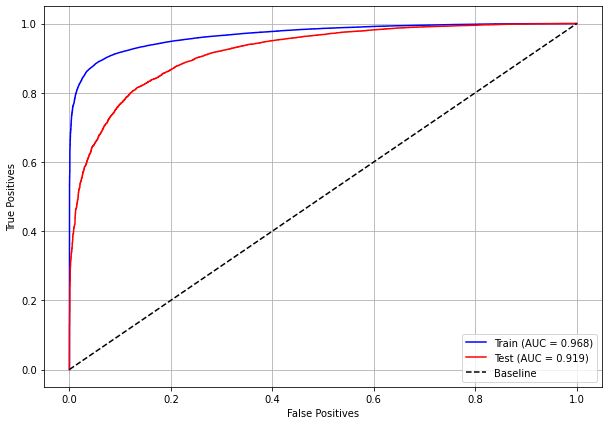

In [ ]:
plot_roc_curve(xgb_sp_12_15, X_trainSP_12_15, X_testSP_12_15, y_trainSP_12_15, y_testSP_12_15)

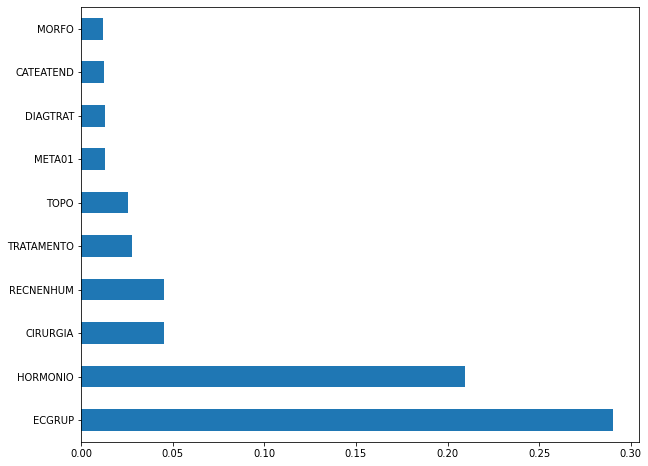

In [ ]:
plot_feat_importances(xgb_sp_12_15, feat_SP_12_15)

> Here we noticed that the most used feature was `ECGRUP`, with some advantage. Following we have `HORMONIO`, `CIRURGIA` and `RECNENHUM`. 

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_12_15).shap_values(X_testSP_12_15)

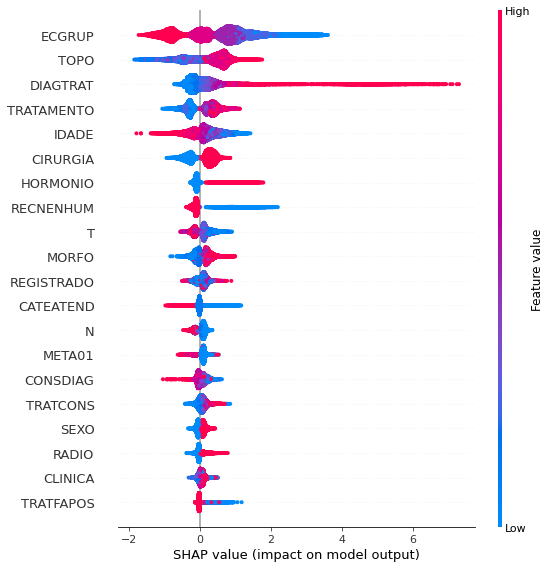

In [ ]:
shap.summary_plot(shap_values, X_testSP_12_15, 
                  feature_names=feat_SP_12_15)

In [ ]:
# SP - 2016 to 2021
xgb_sp_16_21 = xgb.XGBClassifier(max_depth=10, 
                                 random_state=seed, 
                                 scale_pos_weight=0.165)

xgb_sp_16_21.fit(X_trainSP_16_21, y_trainSP_16_21)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.165)

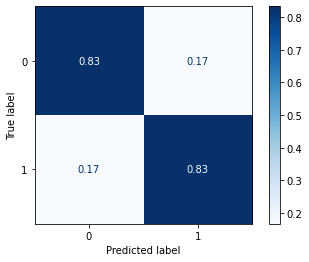

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_16_21, X_testSP_16_21, y_testSP_16_21,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2016 to 2021, shows a good performance of the model, with 83% of accuracy.


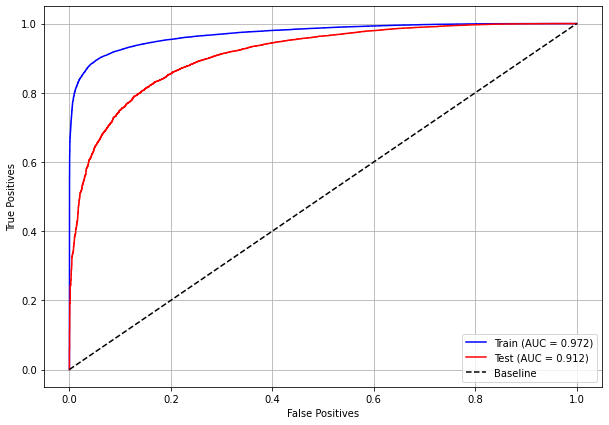

In [ ]:
plot_roc_curve(xgb_sp_16_21, X_trainSP_16_21, X_testSP_16_21, y_trainSP_16_21, y_testSP_16_21)

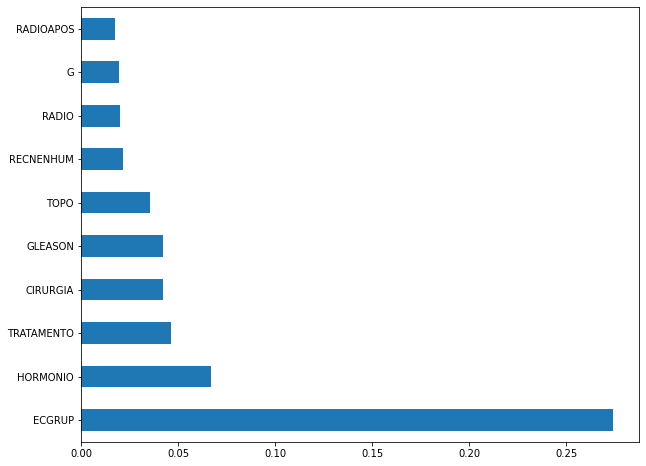

In [ ]:
plot_feat_importances(xgb_sp_16_21, feat_SP_16_21)

> The four most important features were `ECGRUP`, `HORMONIO`, `TRATAMENTO` and `CIRURGIA`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_16_21).shap_values(X_testSP_16_21)

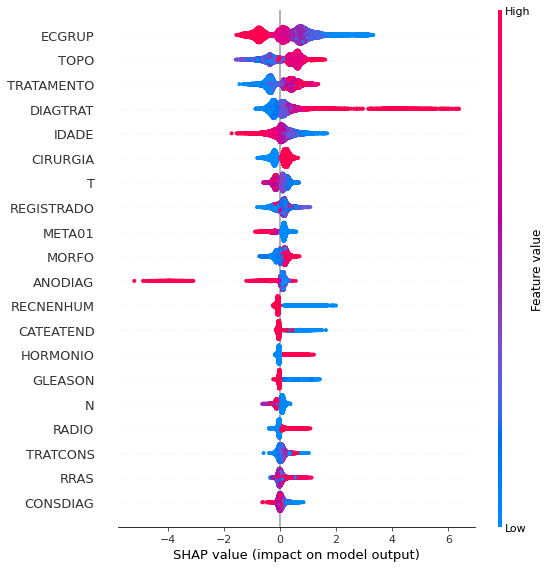

In [ ]:
shap.summary_plot(shap_values, X_testSP_16_21, 
                  feature_names=feat_SP_16_21)

**Other states**

In [ ]:
# Other states - 2000 to 2003
xgb_fora_00_03 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.079,
                                   random_state=seed)

xgb_fora_00_03.fit(X_trainOS_00_03, y_trainOS_00_03)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.079)

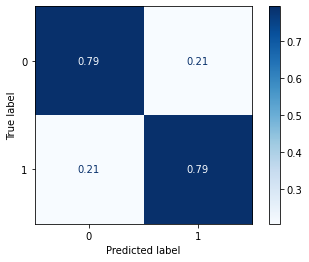

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_00_03, y_testOS_00_03,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2000 to 2003, also shows a good performance of the model, with 79% of accuracy.

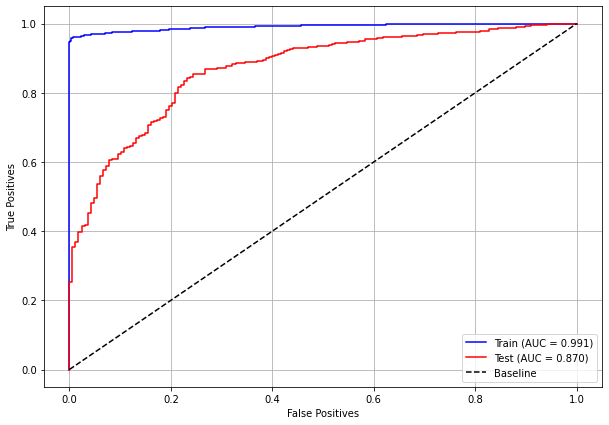

In [ ]:
plot_roc_curve(xgb_fora_00_03, X_trainOS_00_03, X_testOS_00_03, y_trainOS_00_03, y_testOS_00_03)

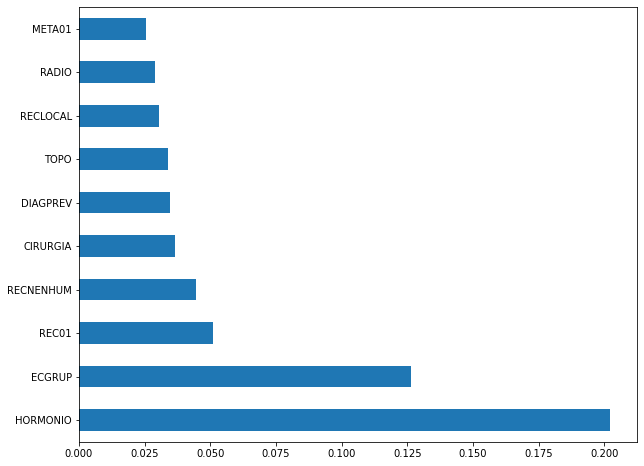

In [ ]:
plot_feat_importances(xgb_fora_00_03, feat_OS_00_03)

> Again we noticed that the most used feature was `HORMONIO`, with some advantage. The following most important features were `ECGRUP`, `REC01` and `RECNENHUM`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_00_03).shap_values(X_testOS_00_03)

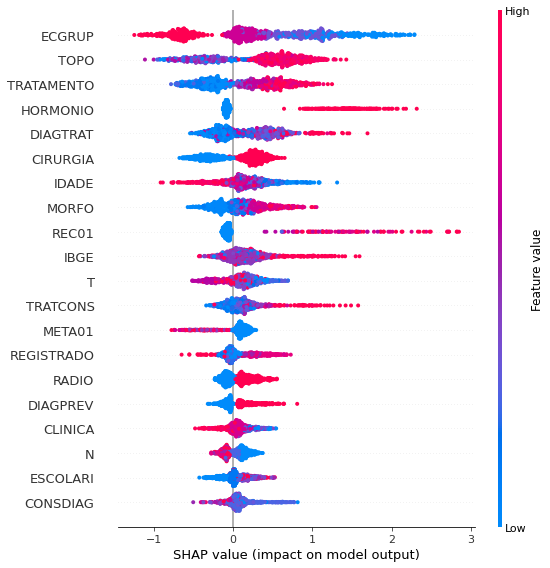

In [ ]:
shap.summary_plot(shap_values, X_testOS_00_03, 
                  feature_names=feat_OS_00_03)

In [ ]:
# Other states - 2004 to 2007
xgb_fora_04_07 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.067,
                                   random_state=seed)

xgb_fora_04_07.fit(X_trainOS_04_07, y_trainOS_04_07)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.067)

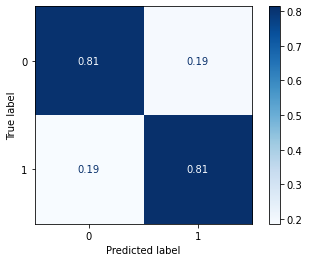

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_04_07, X_testOS_04_07, y_testOS_04_07,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2004 to 2007, also shows a good performance of the model with 81% of accuracy.

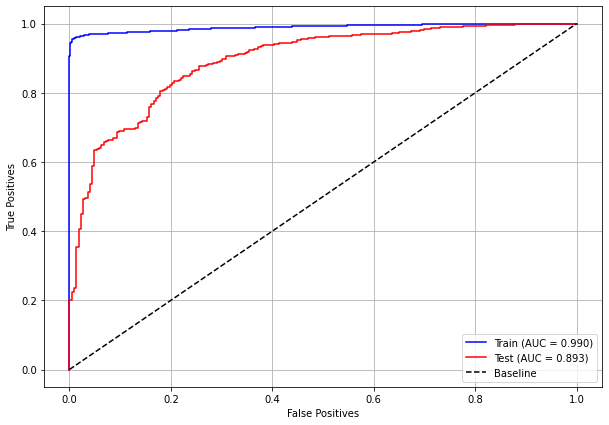

In [ ]:
plot_roc_curve(xgb_fora_04_07, X_trainOS_04_07, X_testOS_04_07, y_trainOS_04_07, y_testOS_04_07)

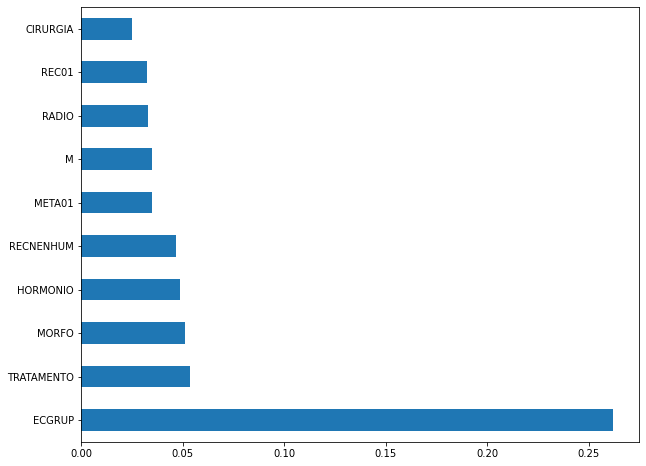

In [ ]:
plot_feat_importances(xgb_fora_04_07, feat_OS_04_07)

> Again we noticed that the most used feature was `ECGRUP`, with a good advantage. The following most important features were `TRATAMENTO`, `MORFO` and `HORMONIO`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_04_07).shap_values(X_testOS_04_07)

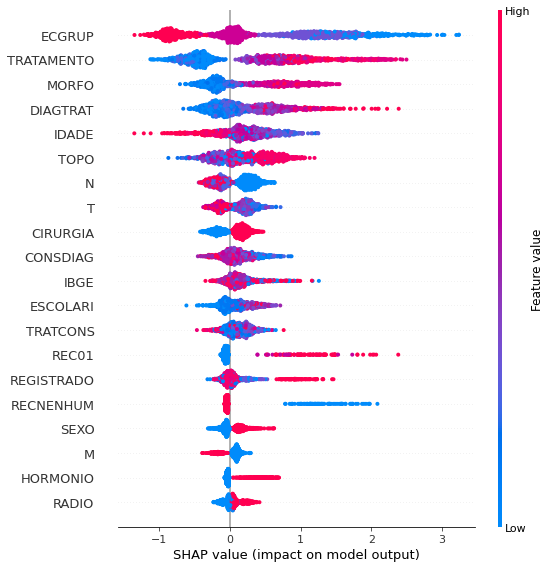

In [ ]:
shap.summary_plot(shap_values, X_testOS_04_07, 
                  feature_names=feat_OS_04_07)

In [ ]:
# Other states - 2008 to 2011
xgb_fora_08_11 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.0667,
                                   random_state=seed)

xgb_fora_08_11.fit(X_trainOS_08_11, y_trainOS_08_11)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.0667)

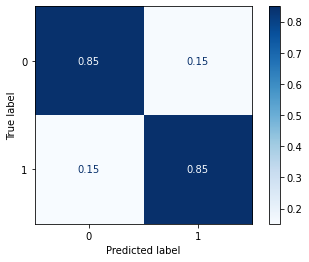

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_08_11, X_testOS_08_11, y_testOS_08_11,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2008 to 2011, also shows a good performance of the model with 85% of accuracy.

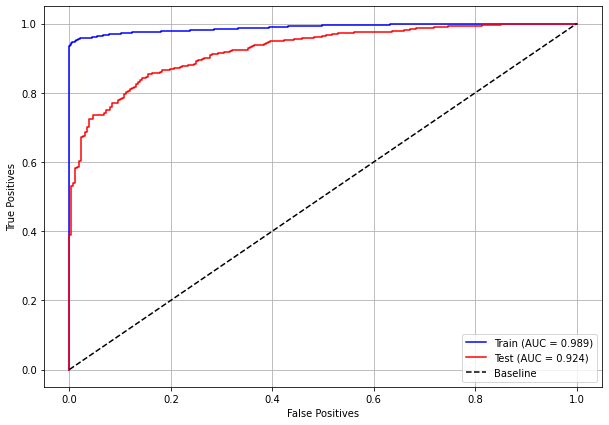

In [ ]:
plot_roc_curve(xgb_fora_08_11, X_trainOS_08_11, X_testOS_08_11, y_trainOS_08_11, y_testOS_08_11)

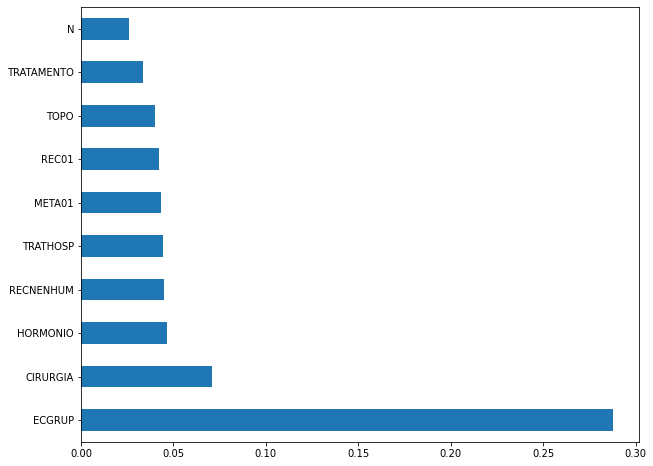

In [ ]:
plot_feat_importances(xgb_fora_08_11, feat_OS_08_11)

> Again we noticed that the most used feature was `ECGRUP`, but not with a lot of advantage. The following most important features were `CIRURGIA`, `HORMONIO` and `RECNENHUM`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_08_11).shap_values(X_testOS_08_11)

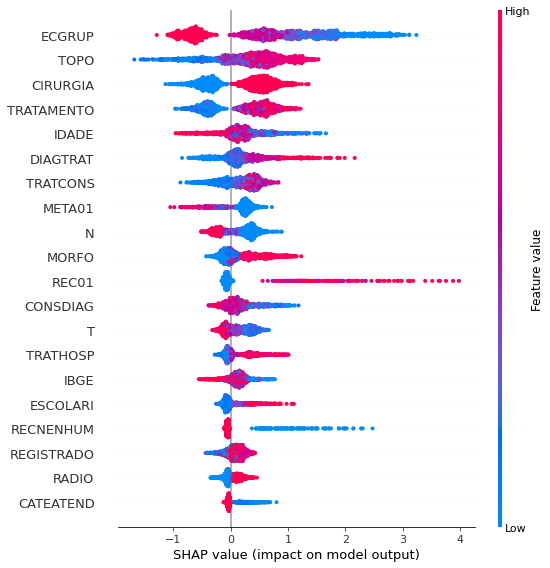

In [ ]:
shap.summary_plot(shap_values, X_testOS_08_11, 
                  feature_names=feat_OS_08_11)

In [ ]:
# Other states - 2012 to 2015
xgb_fora_12_15 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.06,
                                   random_state=seed)

xgb_fora_12_15.fit(X_trainOS_12_15, y_trainOS_12_15)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.06)

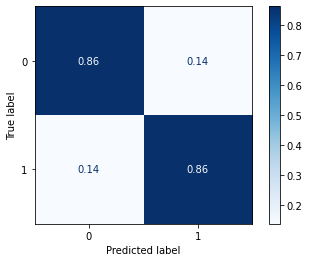

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_12_15, X_testOS_12_15, y_testOS_12_15,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2012 to 2015, also shows a good performance of the model with 86% of accuracy.

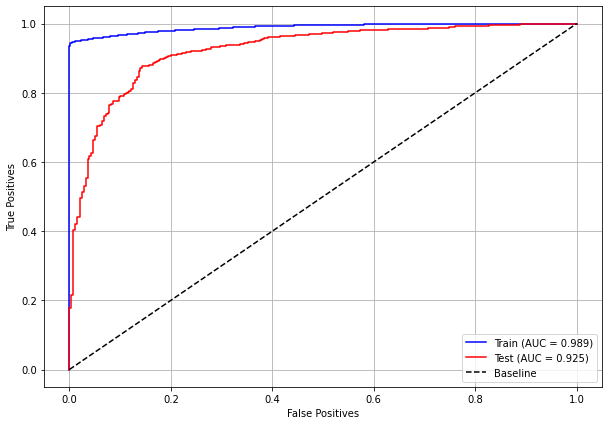

In [ ]:
plot_roc_curve(xgb_fora_12_15, X_trainOS_12_15, X_testOS_12_15, y_trainOS_12_15, y_testOS_12_15)

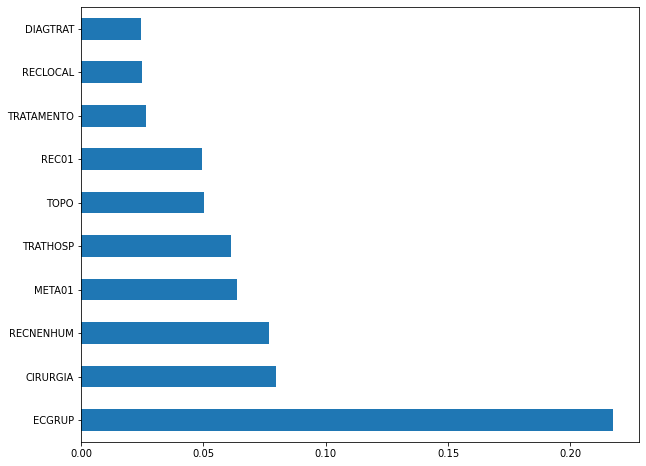

In [ ]:
plot_feat_importances(xgb_fora_12_15, feat_OS_12_15)

> The four most important features were `ECGRUP`, `CIRURGIA`, `RECNENHUM` and `META01`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_12_15).shap_values(X_testOS_12_15)

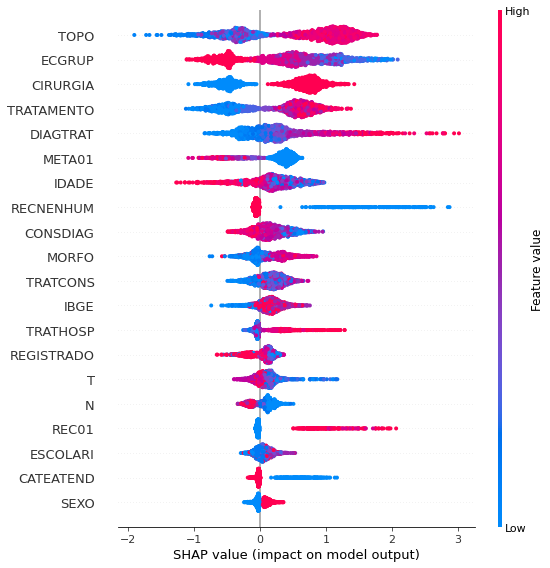

In [ ]:
shap.summary_plot(shap_values, X_testOS_12_15, 
                  feature_names=feat_OS_12_15)

In [ ]:
# Other states - 2016 to 2020
xgb_fora_16_20 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.0621,
                                   random_state=seed)

xgb_fora_16_20.fit(X_trainOS_16_20, y_trainOS_16_20)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.0621)

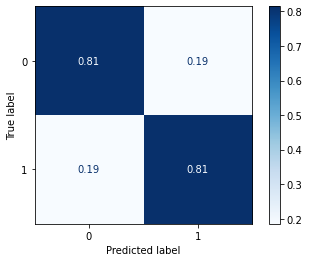

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_16_20, X_testOS_16_20, y_testOS_16_20,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2016 to 2020, shows the best performance comparing with the other models, with 81% of accuracy.

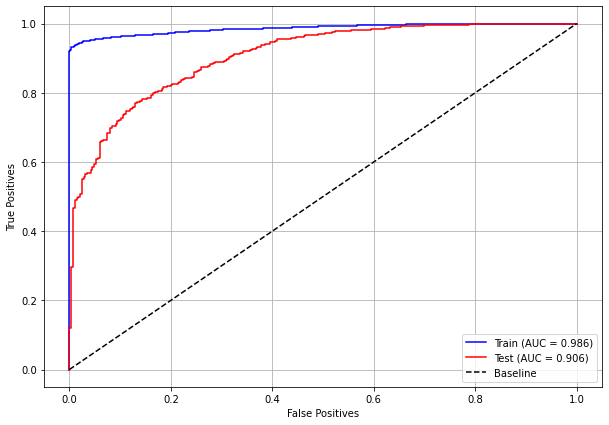

In [ ]:
plot_roc_curve(xgb_fora_16_20, X_trainOS_16_20, X_testOS_16_20, y_trainOS_16_20, y_testOS_16_20)

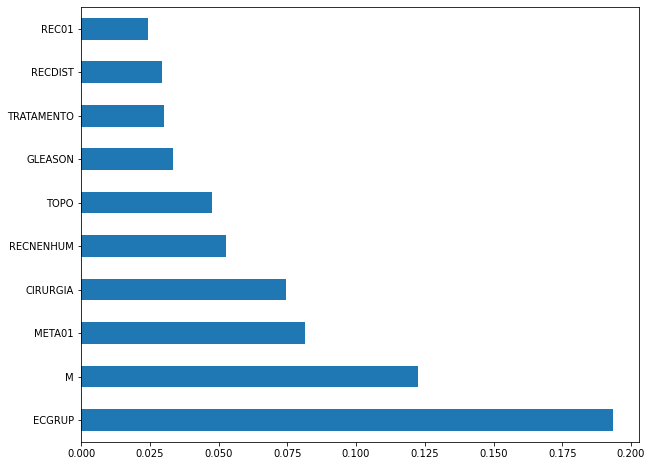

In [ ]:
plot_feat_importances(xgb_fora_16_20, feat_OS_16_20)

> The four most important features were `ECGRUP`, `M`, `META01` and `CIRURGIA`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_16_20).shap_values(X_testOS_16_20)

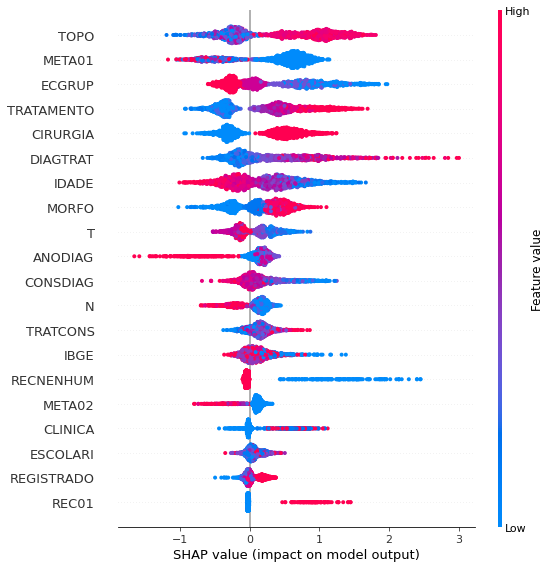

In [ ]:
shap.summary_plot(shap_values, X_testOS_16_20, 
                  feature_names=feat_OS_16_20)

## **Testing models with data from other years**

We will use test data from the following years in the trained models for each set of years grouped together.

### **Random Forest SP for years 2000 to 2003**

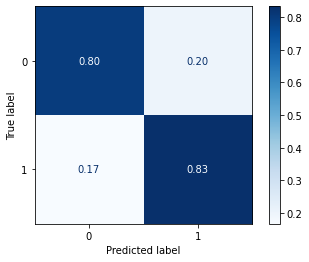

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_04_07, y_testSP_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

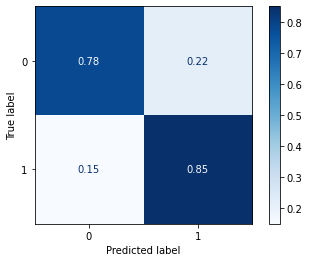

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

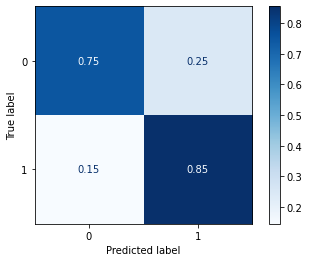

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

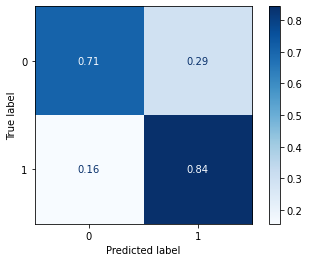

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost SP for years 2000 to 2003**

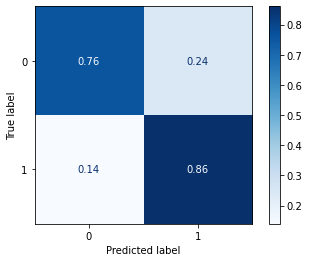

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_04_07, y_testSP_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

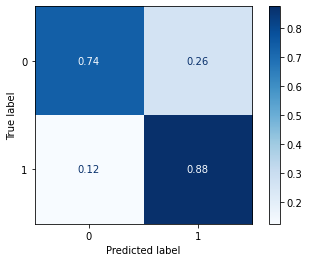

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

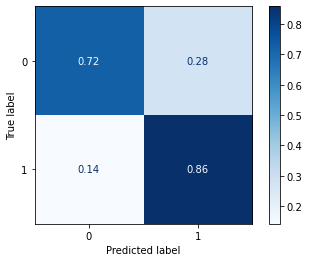

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

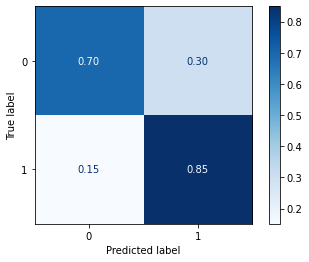

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest SP for years 2004 to 2007**

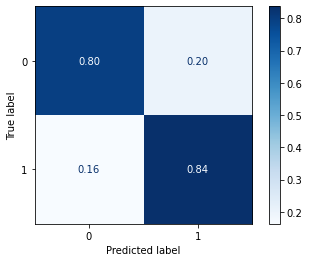

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_04_07, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

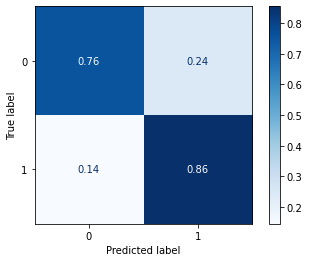

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_04_07, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

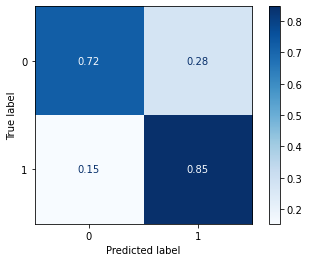

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_04_07, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost SP for years 2004 to 2007**

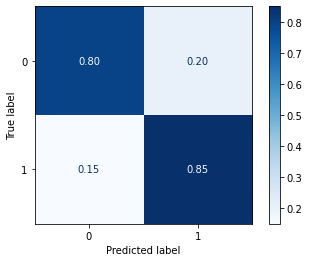

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_04_07, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

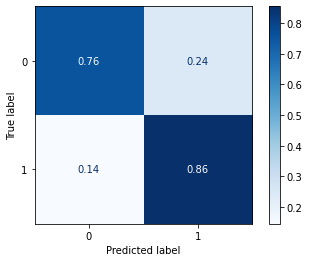

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_04_07, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

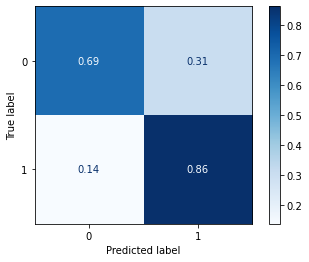

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_04_07, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest SP for years 2008 to 2011**

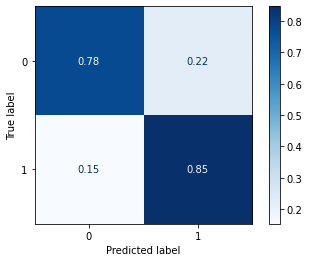

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_08_11, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

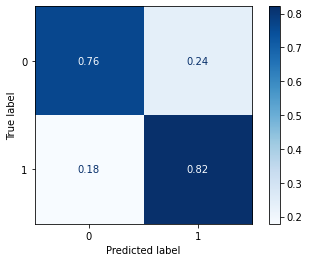

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_08_11, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost SP for years 2008 to 2011**

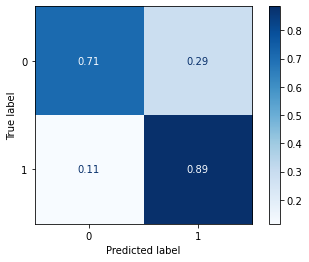

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_08_11, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

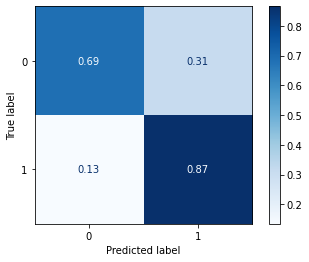

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_08_11, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest SP for years 2012 to 2015**

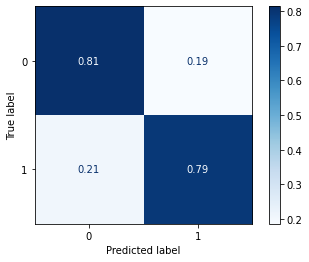

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_12_15, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost SP for years 2012 to 2015**

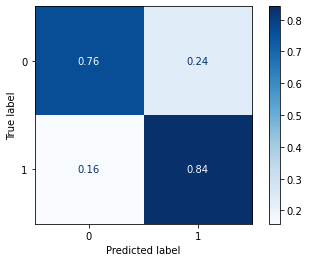

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_12_15, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest Other states for years 2000 to 2003**

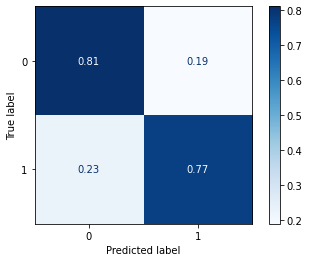

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_04_07, y_testOS_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

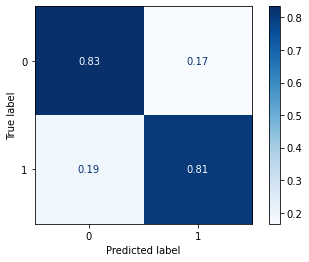

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_08_11, y_testOS_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

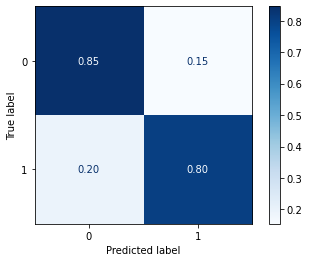

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

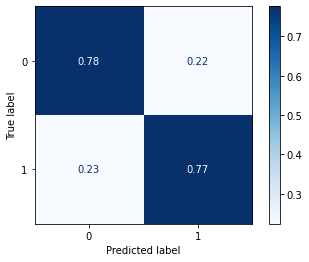

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost Other states for years 2000 to 2003**

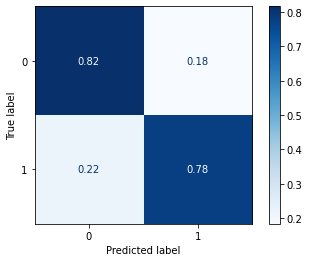

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_04_07, y_testOS_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

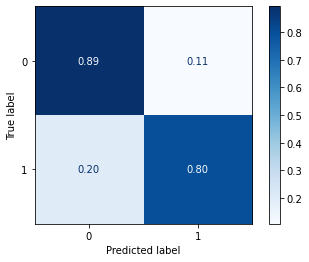

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_08_11, y_testOS_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

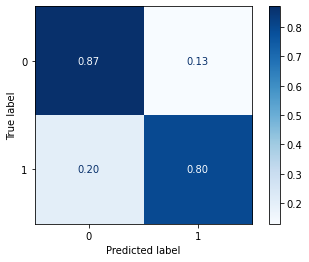

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

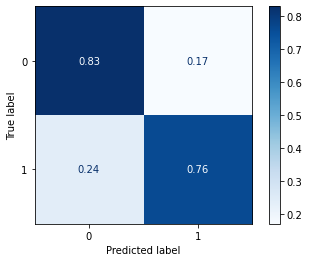

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest Other states for years 2004 to 2007**

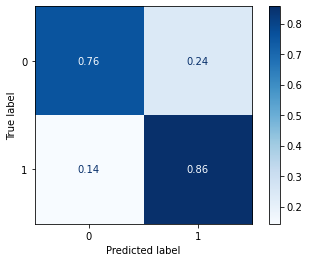

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_04_07, X_testOS_08_11, y_testOS_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

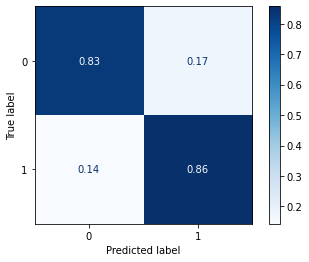

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_04_07, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

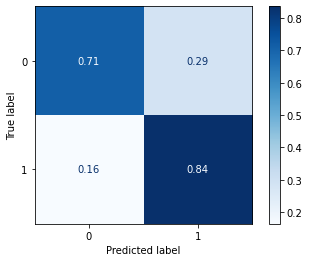

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_04_07, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost Other states for years 2004 to 2007**

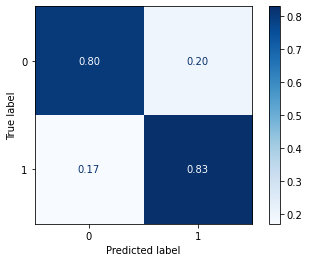

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_04_07, X_testOS_08_11, y_testOS_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

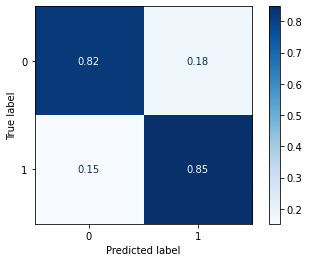

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_04_07, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

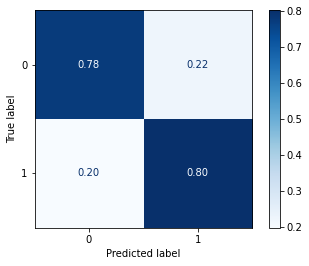

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_04_07, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest Other states for years 2008 to 2011**

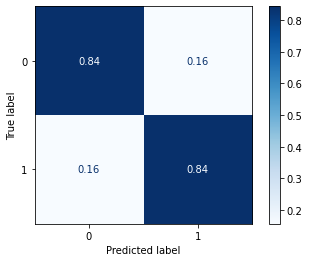

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_08_11, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

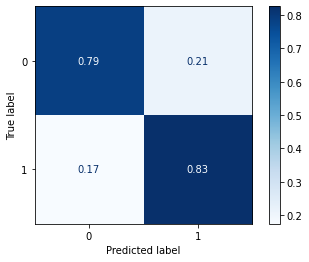

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_08_11, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost Other states for years 2008 to 2011**

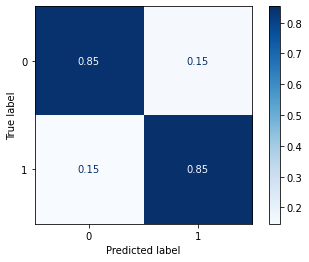

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_08_11, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

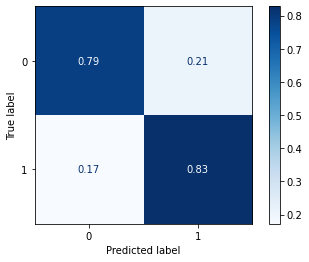

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_08_11, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest Other states for years 2012 to 2015**

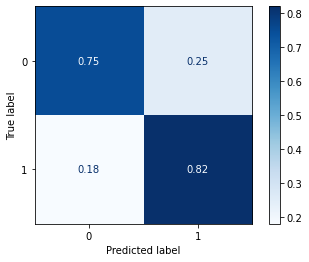

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_12_15, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost Other states for years 2012 to 2015**

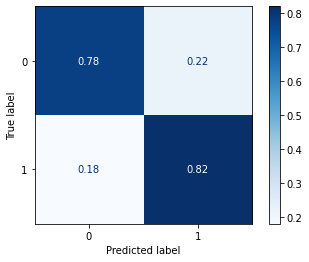

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_12_15, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

# **Fifth approach**

Approach with grouped years and without the columns `EC` and `HORMONIO`.

## **Preprocessing**

Now we are going to divide the data into training and testing, and then do the preprocessing in both datasets to perform the training of the models and their evaluation. We will use the years grouped too, resulting in 5 datasets for SP and more 5 for other states.

First, it is necessary to define the columns that will be used as features and the label. We will not use some columns of the datasets: `UFRESID`, because we already have the division between SP and other states in the two datasets. 

It was chosen to keep the column `IDADE`, so we will not use the `FAIXAETAR`, as well as the column `ECGRUP` and not the column `EC`. Finally, the other columns contained in the list `list_drop` are possible labels, so they will not be used as features for machine learning models.

In [ ]:
list_drop = ['UFRESID', 'FAIXAETAR', 'ULTICONS', 'ULTIDIAG', 'ULTITRAT', 
             'obito_geral', 'obito_cancer', 'vivo_ano3', 'vivo_ano5',
             'ULTINFO', 'EC', 'HORMONIO']

# 'RECNENHUM', 'RECLOCAL', 'RECREGIO', 'REC01', 'REC02', 'REC03', 'RECDIST'

lb = 'vivo_ano1'

A function was created to perform the preprocessing, `preprocessing`, that uses the other functions created, `get_train_test` (divides the dataset into train and test sets), `train_preprocessing` (do the preprocessing of the train set) and `test_preprocessing` (do the preprocessing of the test set). 

The process will be done 5 times for SP and other states, using the datasets with grouped years.

> To see the complete function go to the [functions section](https://cancer-project.readthedocs.io/en/latest/Cancer%20Libraries%20and%20functions.html#Models).

### **SP**

In [ ]:
X_trainSP_00_03, X_testSP_00_03, y_trainSP_00_03, y_testSP_00_03, feat_SP_00_03 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2000, 
                                                                                                last_year=2003, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (47196, 64), X_test = (15732, 64)
y_train = (47196,), y_test = (15732,)


In [ ]:
X_trainSP_04_07, X_testSP_04_07, y_trainSP_04_07, y_testSP_04_07, feat_SP_04_07 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2004, 
                                                                                                last_year=2007,
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')                                                            

X_train = (59781, 64), X_test = (19928, 64)
y_train = (59781,), y_test = (19928,)


In [ ]:
X_trainSP_08_11, X_testSP_08_11, y_trainSP_08_11, y_testSP_08_11, feat_SP_08_11 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2008, 
                                                                                                last_year=2011, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (80382, 64), X_test = (26795, 64)
y_train = (80382,), y_test = (26795,)


In [ ]:
X_trainSP_12_15, X_testSP_12_15, y_trainSP_12_15, y_testSP_12_15, feat_SP_12_15 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2012, 
                                                                                                last_year=2015, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (99850, 64), X_test = (33284, 64)
y_train = (99850,), y_test = (33284,)


In [ ]:
X_trainSP_16_21, X_testSP_16_21, y_trainSP_16_21, y_testSP_16_21, feat_SP_16_21 = preprocessing(df_SP_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2016, 
                                                                                                last_year=2021, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (65067, 64), X_test = (21689, 64)
y_train = (65067,), y_test = (21689,)


### **Other states**

In [ ]:
X_trainOS_00_03, X_testOS_00_03, y_trainOS_00_03, y_testOS_00_03, feat_OS_00_03 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2000, 
                                                                                                last_year=2003, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (2694, 64), X_test = (899, 64)
y_train = (2694,), y_test = (899,)


In [ ]:
X_trainOS_04_07, X_testOS_04_07, y_trainOS_04_07, y_testOS_04_07, feat_OS_04_07 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2004, 
                                                                                                last_year=2007, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (3738, 64), X_test = (1246, 64)
y_train = (3738,), y_test = (1246,)


In [ ]:
X_trainOS_08_11, X_testOS_08_11, y_trainOS_08_11, y_testOS_08_11, feat_OS_08_11 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2008, 
                                                                                                last_year=2011, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (4652, 64), X_test = (1551, 64)
y_train = (4652,), y_test = (1551,)


In [ ]:
X_trainOS_12_15, X_testOS_12_15, y_trainOS_12_15, y_testOS_12_15, feat_OS_12_15 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2012, 
                                                                                                last_year=2015, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (6019, 64), X_test = (2007, 64)
y_train = (6019,), y_test = (2007,)


In [ ]:
X_trainOS_16_20, X_testOS_16_20, y_trainOS_16_20, y_testOS_16_20, feat_OS_16_20 = preprocessing(df_fora_ano1, list_drop, lb, 
                                                                                                group_years=True, 
                                                                                                first_year=2016, 
                                                                                                last_year=2020, 
                                                                                                random_state=seed,
                                                                                                balance_data=False,
                                                                                                encoder_type='LabelEncoder', 
                                                                                                norm_name='StandardScaler')

X_train = (5223, 64), X_test = (1742, 64)
y_train = (5223,), y_test = (1742,)


## **Training and evaluation of the models**

After dividing the data into training and testing, using the encoder and normalizing, the data is ready to be used by the machine learning models.

### **Random Forest**


The first model is the Random Forest, the `random_state` will be used as a parameter, to obtain the same training values of the model every time it is runned.

The hyperparameter `class_weight` was used because the models have difficulty to learn the class with fewer examples.

**SP**

In [ ]:
# SP - 2000 to 2003
rf_sp_00_03 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:3.47, 1:1},
                                     criterion='entropy',
                                     max_depth=10)

rf_sp_00_03.fit(X_trainSP_00_03, y_trainSP_00_03)

RandomForestClassifier(class_weight={0: 3.47, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

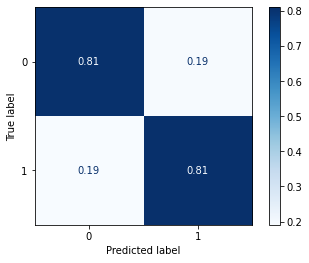

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_00_03, y_testSP_00_03, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2000 to 2003, shows a good performance of the model, with 81% of accuracy.


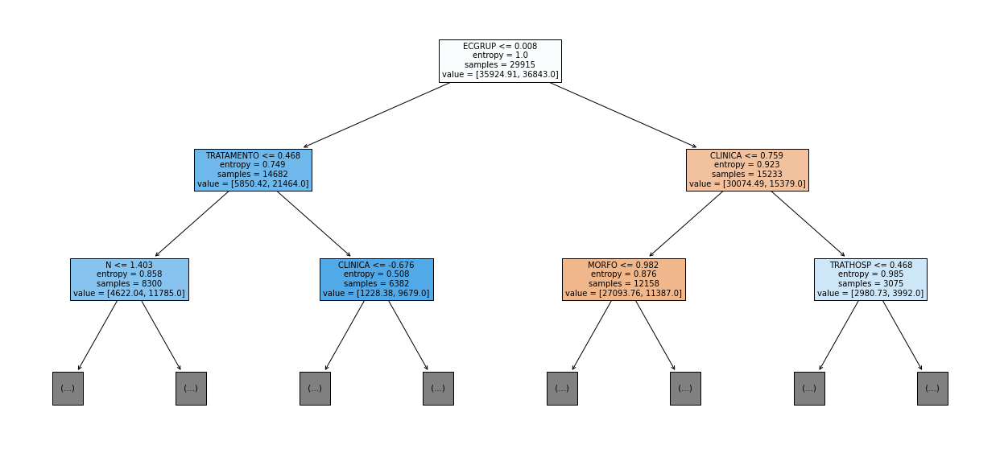

In [ ]:
show_tree(rf_sp_00_03, feat_SP_00_03, 2)

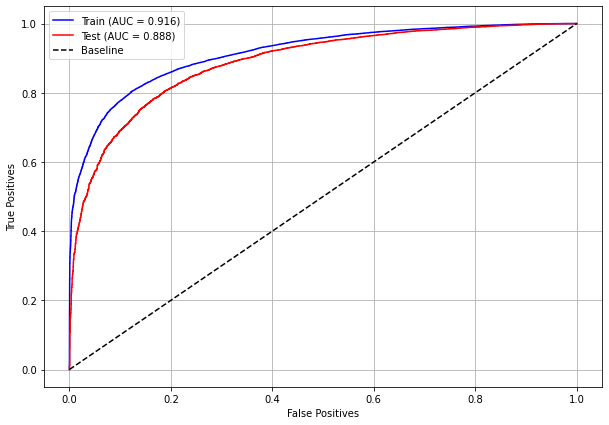

In [ ]:
plot_roc_curve(rf_sp_00_03, X_trainSP_00_03, X_testSP_00_03, y_trainSP_00_03, y_testSP_00_03)

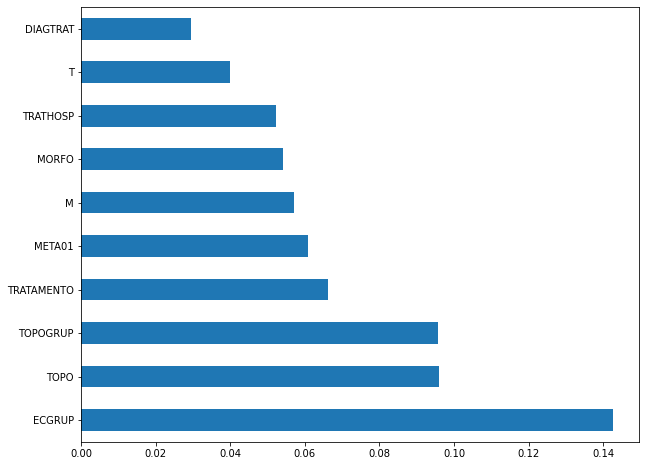

In [ ]:
plot_feat_importances(rf_sp_00_03, feat_SP_00_03)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP`, and `TRATAMENTO`. 

In [ ]:
shap_values = shap.TreeExplainer(rf_sp_00_03).shap_values(X_testSP_00_03)

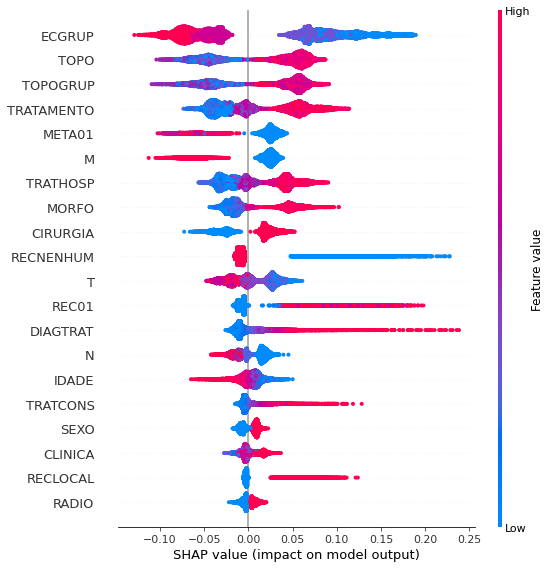

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_00_03, 
                  feature_names=feat_SP_00_03)

In [ ]:
# SP - 2004 to 2007
rf_sp_04_07 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:4.3, 1:1},
                                     criterion='entropy',
                                     max_depth=10)

rf_sp_04_07.fit(X_trainSP_04_07, y_trainSP_04_07)

RandomForestClassifier(class_weight={0: 4.3, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

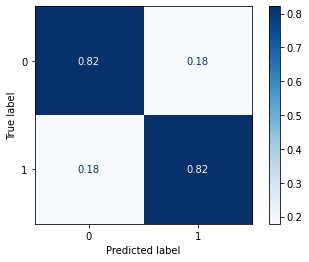

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_04_07, X_testSP_04_07, y_testSP_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2004 to 2007, shows a good performance of the model, with 82% of accuracy.

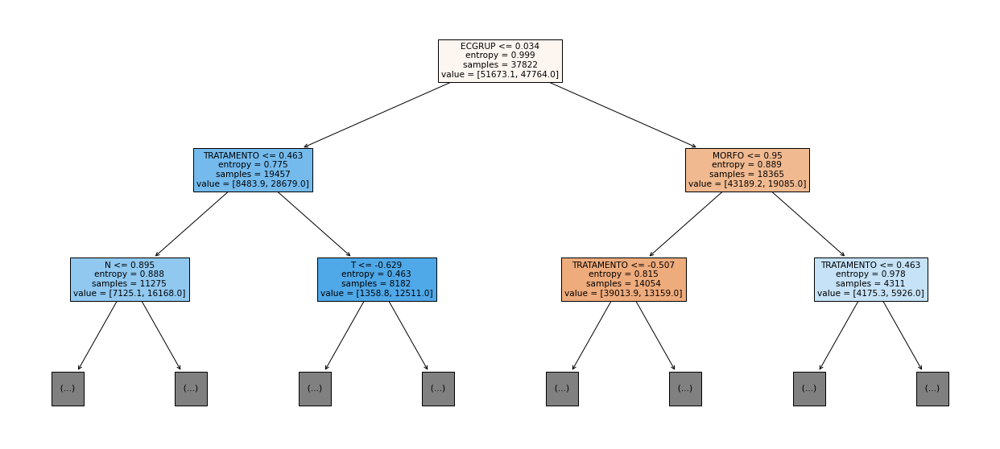

In [ ]:
show_tree(rf_sp_04_07, feat_SP_04_07, 2)

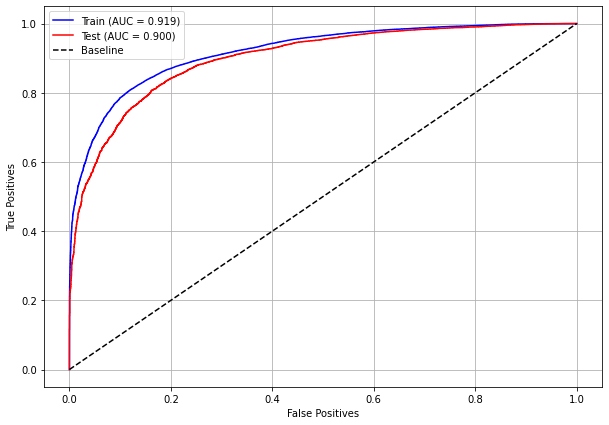

In [ ]:
plot_roc_curve(rf_sp_04_07, X_trainSP_04_07, X_testSP_04_07, y_trainSP_04_07, y_testSP_04_07)

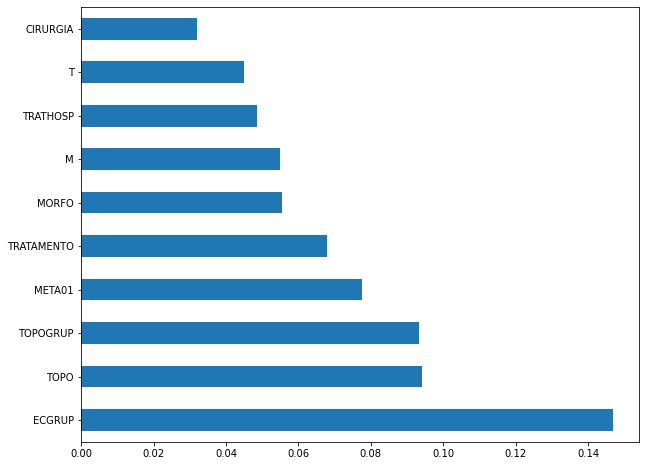

In [ ]:
plot_feat_importances(rf_sp_04_07, feat_SP_04_07)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `META01`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp_04_07).shap_values(X_testSP_04_07)

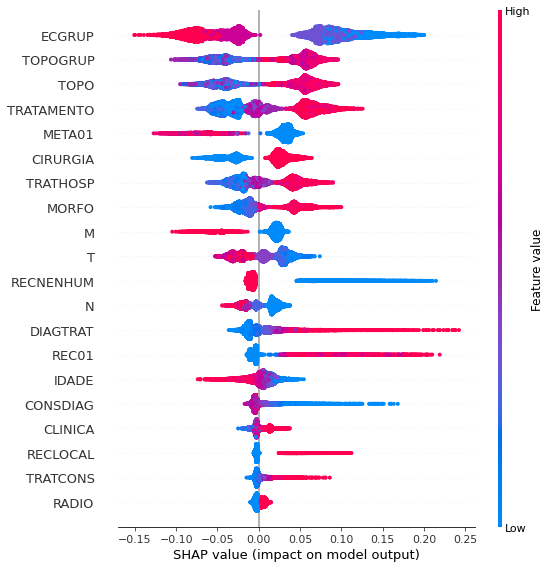

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_04_07, 
                  feature_names=feat_SP_04_07)

In [ ]:
# SP - 2008 to 2011
rf_sp_08_11 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:4.5, 1:1},
                                     criterion='entropy',
                                     max_depth=10)

rf_sp_08_11.fit(X_trainSP_08_11, y_trainSP_08_11)

RandomForestClassifier(class_weight={0: 4.5, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

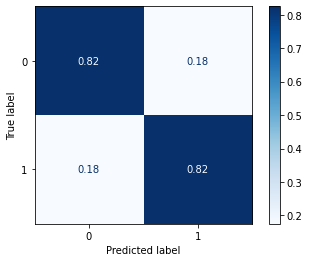

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_08_11, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2008 to 2011, shows a good performance of the model, with 82% of accuracy.

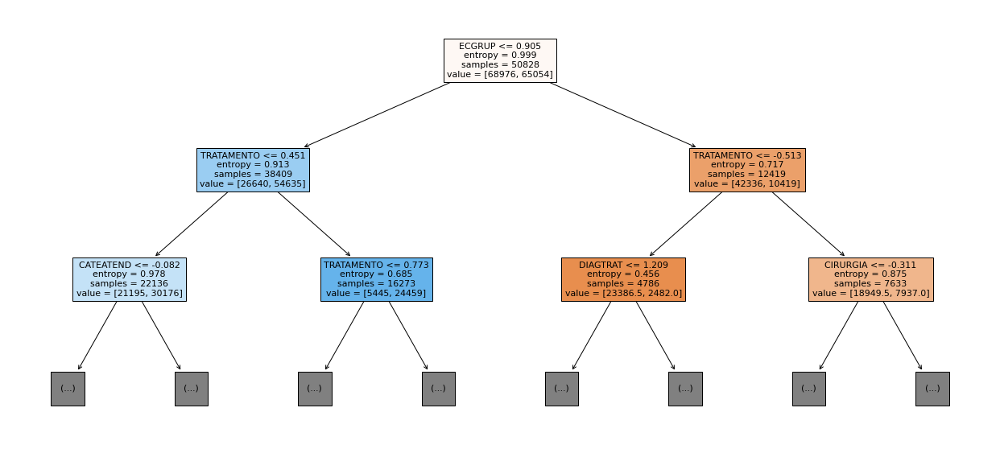

In [ ]:
show_tree(rf_sp_08_11, feat_SP_08_11, 2)

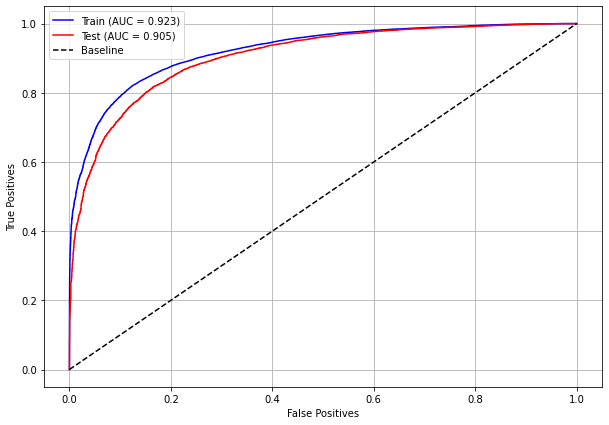

In [ ]:
plot_roc_curve(rf_sp_08_11, X_trainSP_08_11, X_testSP_08_11, y_trainSP_08_11, y_testSP_08_11)

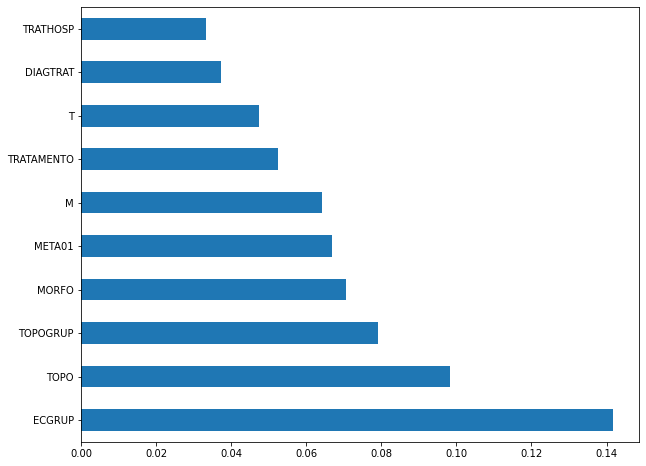

In [ ]:
plot_feat_importances(rf_sp_08_11, feat_SP_08_11)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `MORFO`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp_08_11).shap_values(X_testSP_08_11)

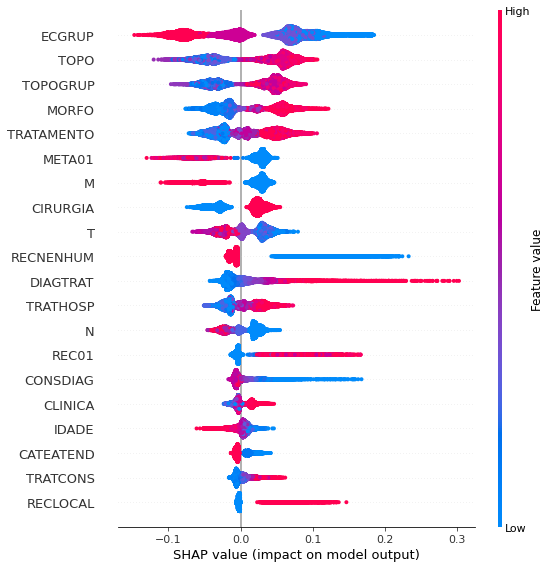

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_08_11, 
                  feature_names=feat_SP_08_11)

In [ ]:
# SP - 2012 to 2015
rf_sp_12_15 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:5.5, 1:1},
                                     criterion='entropy',
                                     max_depth=10)

rf_sp_12_15.fit(X_trainSP_12_15, y_trainSP_12_15)

RandomForestClassifier(class_weight={0: 5.5, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

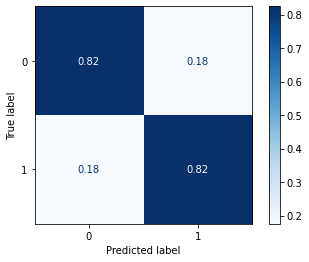

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_12_15, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2012 to 2015, shows a good performance of the model with 82% of accuracy.

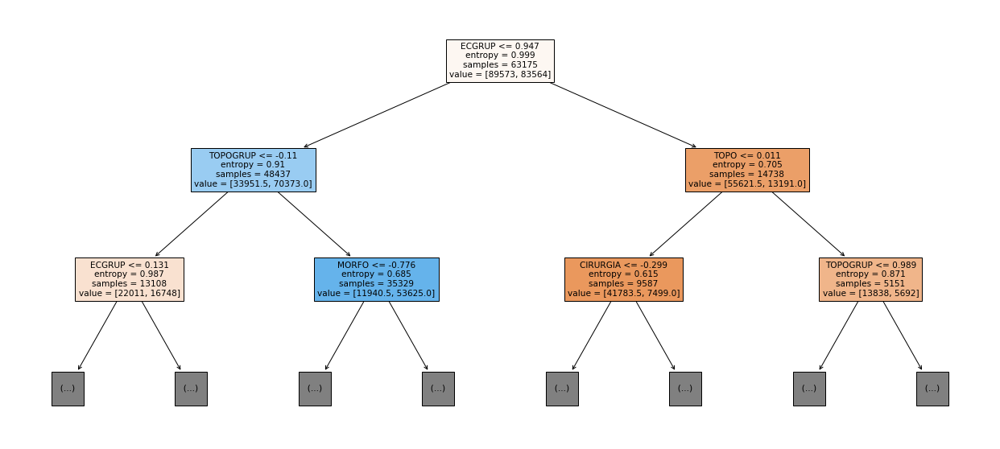

In [ ]:
show_tree(rf_sp_12_15, feat_SP_12_15, 2)

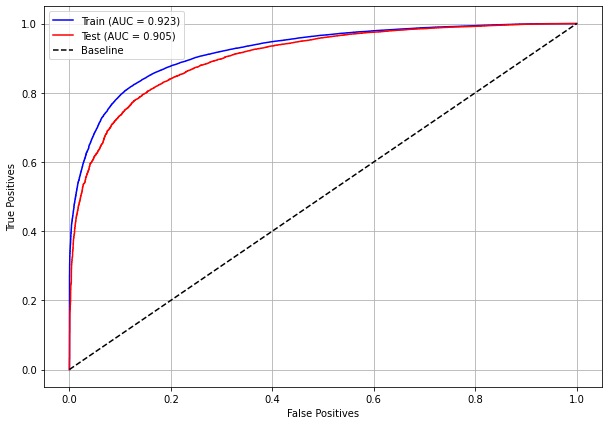

In [ ]:
plot_roc_curve(rf_sp_12_15, X_trainSP_12_15, X_testSP_12_15, y_trainSP_12_15, y_testSP_12_15)

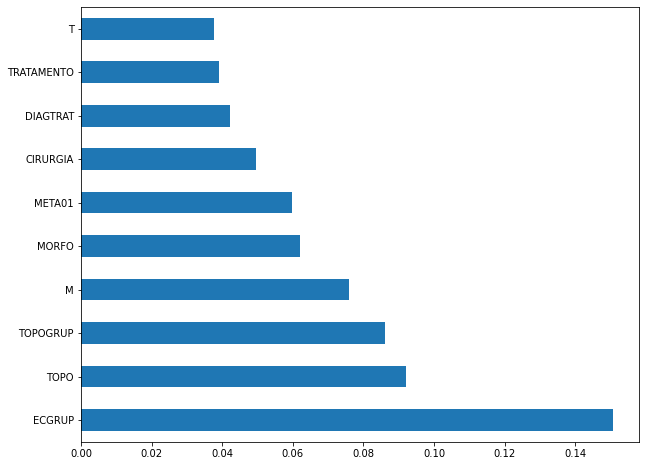

In [ ]:
plot_feat_importances(rf_sp_12_15, feat_SP_12_15)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPGRUP` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(rf_sp_12_15).shap_values(X_testSP_12_15)

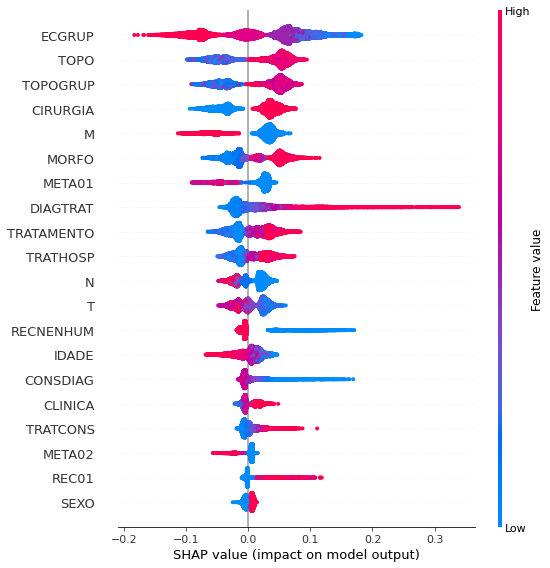

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_12_15, 
                  feature_names=feat_SP_12_15)

In [ ]:
# SP - 2016 to 2021
rf_sp_16_21 = RandomForestClassifier(random_state=seed, 
                                     class_weight={0:4.55, 1:1},
                                     criterion='entropy', 
                                     max_depth=10)

rf_sp_16_21.fit(X_trainSP_16_21, y_trainSP_16_21)

RandomForestClassifier(class_weight={0: 4.55, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

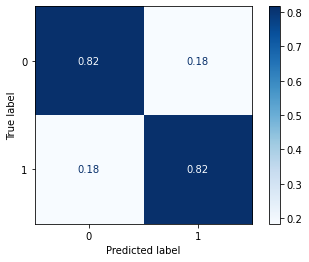

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_16_21, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with SP data from 2016 to 2021, shows a good performance of the model, with 82% of accuracy.

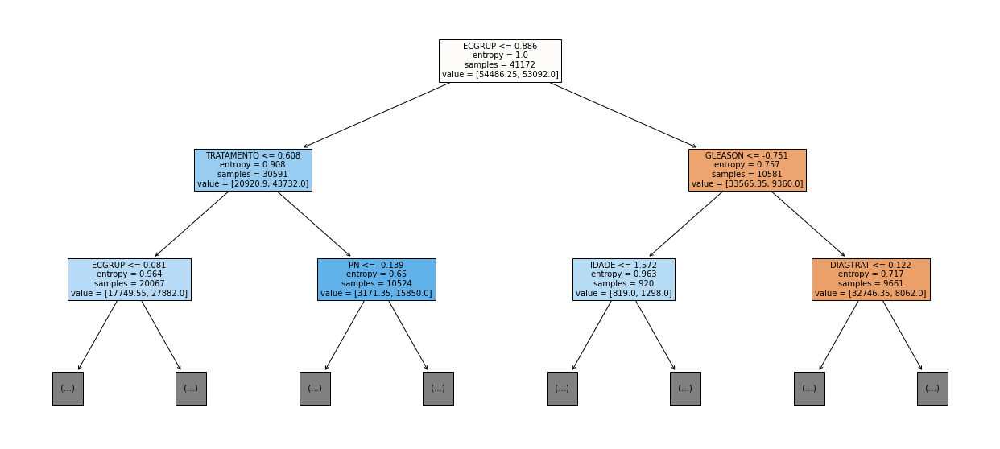

In [ ]:
show_tree(rf_sp_16_21, feat_SP_16_21, 2)

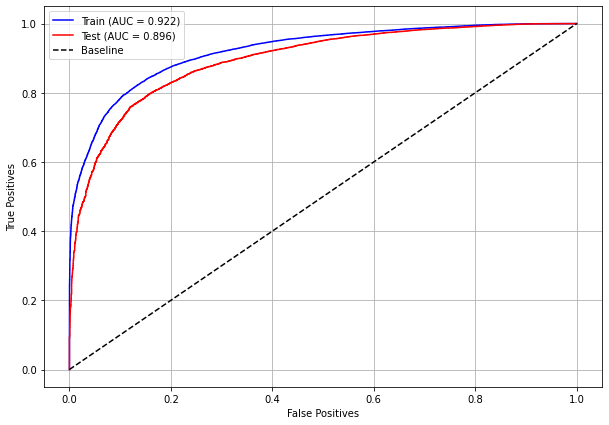

In [ ]:
plot_roc_curve(rf_sp_16_21, X_trainSP_16_21, X_testSP_16_21, y_trainSP_16_21, y_testSP_16_21)

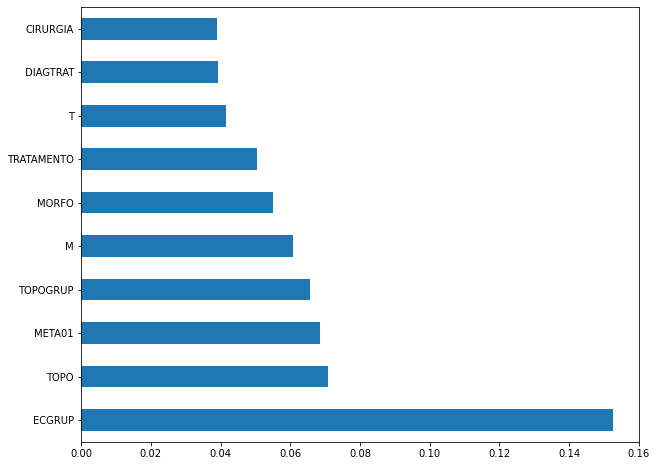

In [ ]:
plot_feat_importances(rf_sp_16_21, feat_SP_16_21)

> The four most important features in the model were `ECGRUP`, `TOPO`, `META01`, and `TOPOGRUP`.



In [ ]:
shap_values = shap.TreeExplainer(rf_sp_16_21).shap_values(X_testSP_16_21)

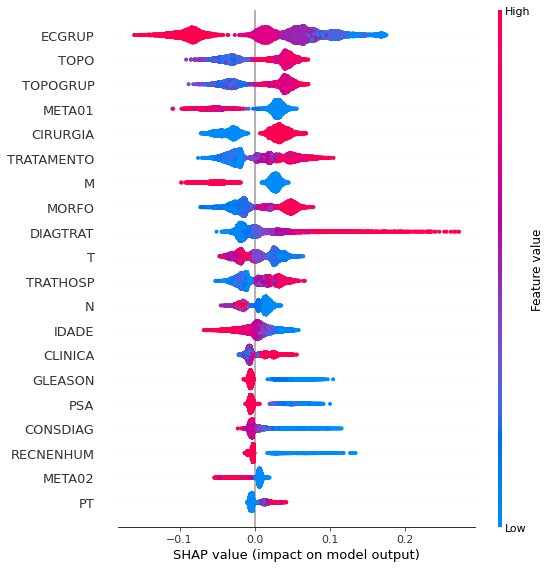

In [ ]:
shap.summary_plot(shap_values[1], X_testSP_16_21, 
                  feature_names=feat_SP_16_21)

**Other states**

In [ ]:
# Other states - 2000 to 2003
rf_fora_00_03 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:17, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_00_03.fit(X_trainOS_00_03, y_trainOS_00_03)

RandomForestClassifier(class_weight={0: 17, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

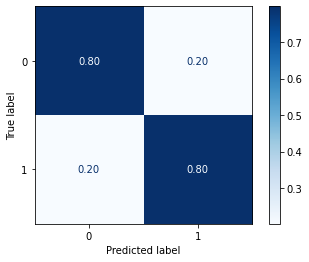

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_00_03, y_testOS_00_03, 
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2000 to 2003, also shows a good performance of the model, and we have a balanced main diagonal with 80% of accuracy.

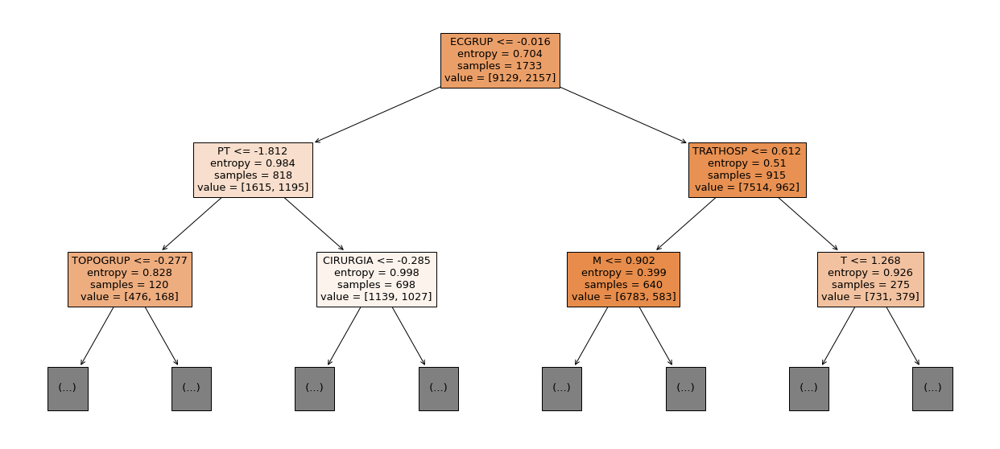

In [ ]:
show_tree(rf_fora_00_03, feat_OS_00_03, 2)

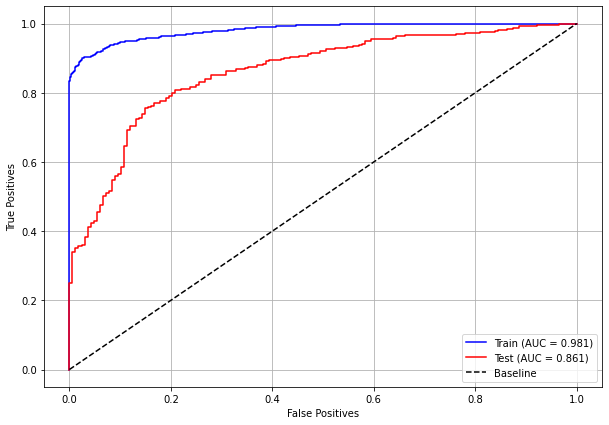

In [ ]:
plot_roc_curve(rf_fora_00_03, X_trainOS_00_03, X_testOS_00_03, y_trainOS_00_03, y_testOS_00_03)

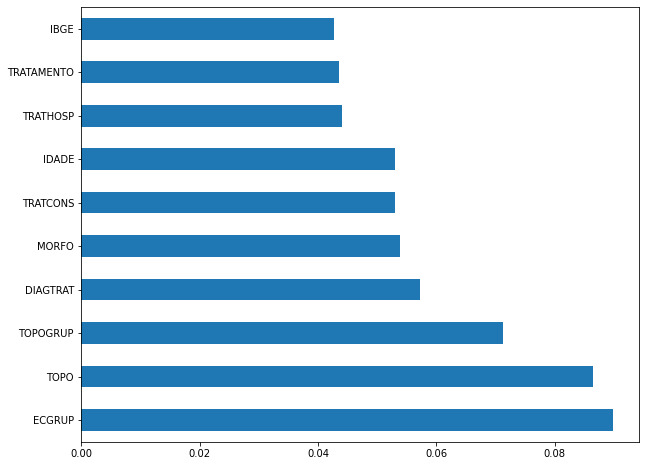

In [ ]:
plot_feat_importances(rf_fora_00_03, feat_OS_00_03)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `DIAGTRAT`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_00_03).shap_values(X_testOS_00_03)

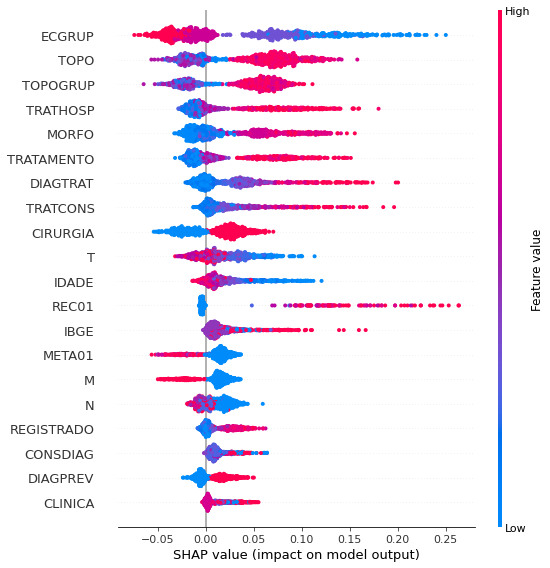

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_00_03, 
                  feature_names=feat_OS_00_03)

In [ ]:
# Other states - 2004 to 2007
rf_fora_04_07 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:20, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_04_07.fit(X_trainOS_04_07, y_trainOS_04_07)

RandomForestClassifier(class_weight={0: 20, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

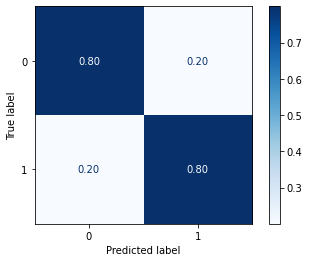

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_04_07, X_testOS_04_07, y_testOS_04_07, 
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2004 to 2007, also shows a good performance of the model, with 80% of accuracy.


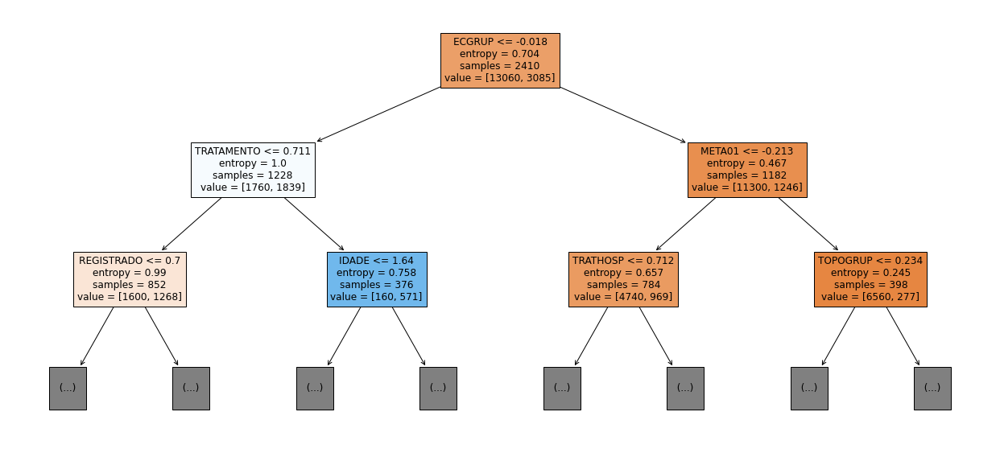

In [ ]:
show_tree(rf_fora_04_07, feat_OS_04_07, 2)

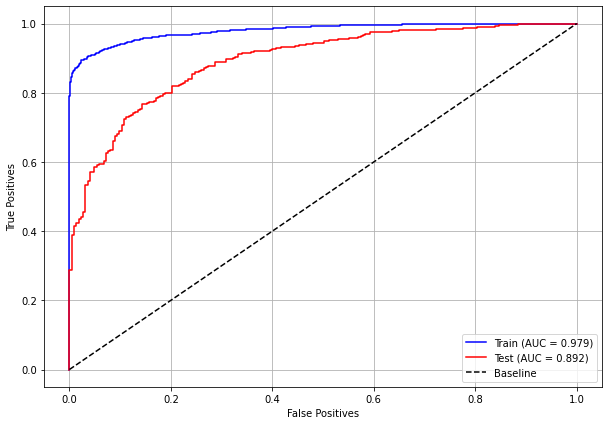

In [ ]:
plot_roc_curve(rf_fora_04_07, X_trainOS_04_07, X_testOS_04_07, y_trainOS_04_07, y_testOS_04_07)

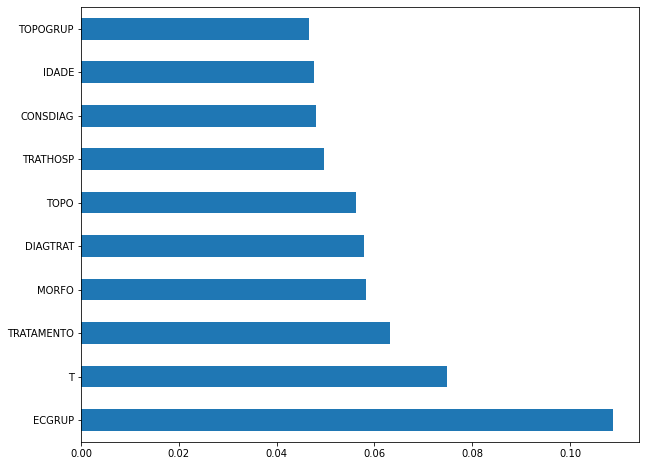

In [ ]:
plot_feat_importances(rf_fora_04_07, feat_OS_04_07)

> The four most important features in the model were `ECGRUP`, `T`, `TRATAMENTO` and `MORFO`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_04_07).shap_values(X_testOS_04_07)

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_04_07, 
                  feature_names=feat_OS_04_07)

In [ ]:
# Other states - 2008 to 2011
rf_fora_08_11 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:21, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_08_11.fit(X_trainOS_08_11, y_trainOS_08_11)

RandomForestClassifier(class_weight={0: 21, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

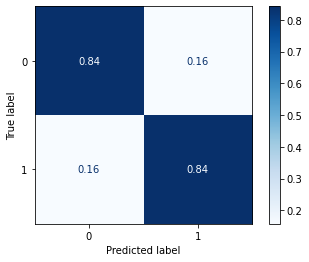

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_08_11, X_testOS_08_11, y_testOS_08_11,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2008 to 2011, also shows a good performance of the model, presenting 84% of accuracy.


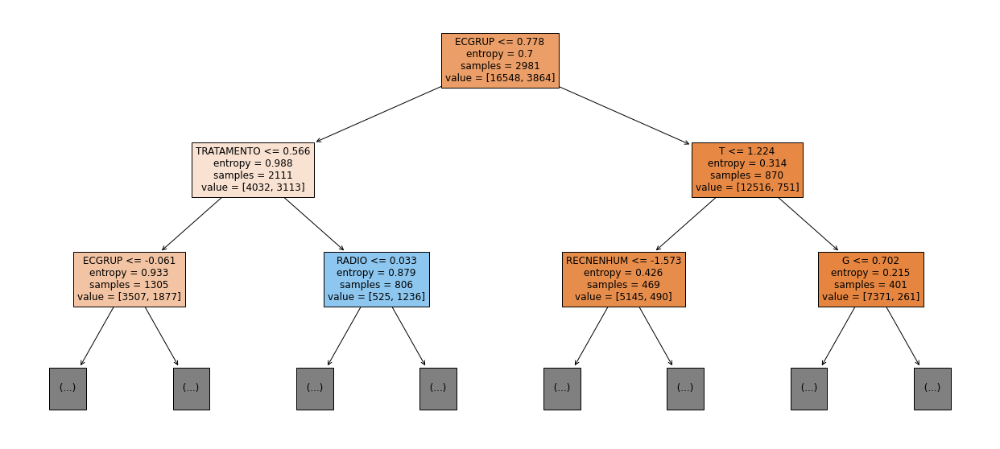

In [ ]:
show_tree(rf_fora_08_11, feat_OS_08_11, 2)

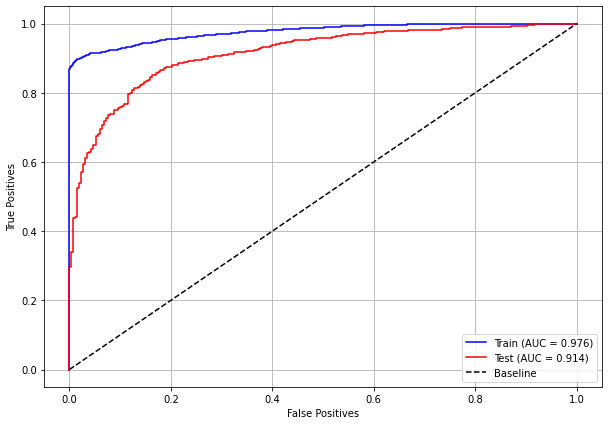

In [ ]:
plot_roc_curve(rf_fora_08_11, X_trainOS_08_11, X_testOS_08_11, y_trainOS_08_11, y_testOS_08_11)

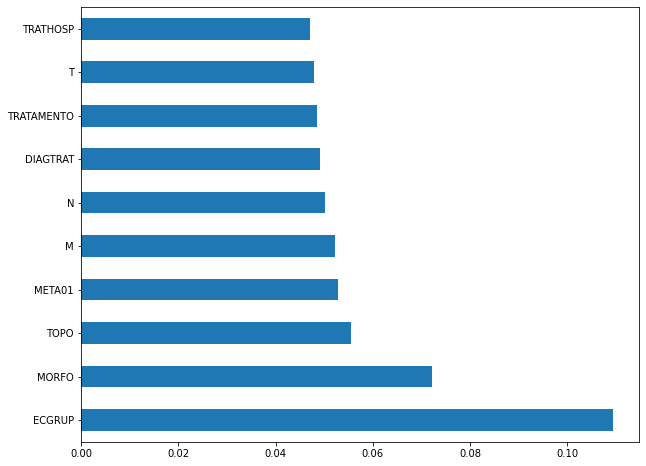

In [ ]:
plot_feat_importances(rf_fora_08_11, feat_OS_08_11)

> The four most important features in the model were `ECGRUP`, `MORFO`, `TOPO` and `META01`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_08_11).shap_values(X_testOS_08_11)

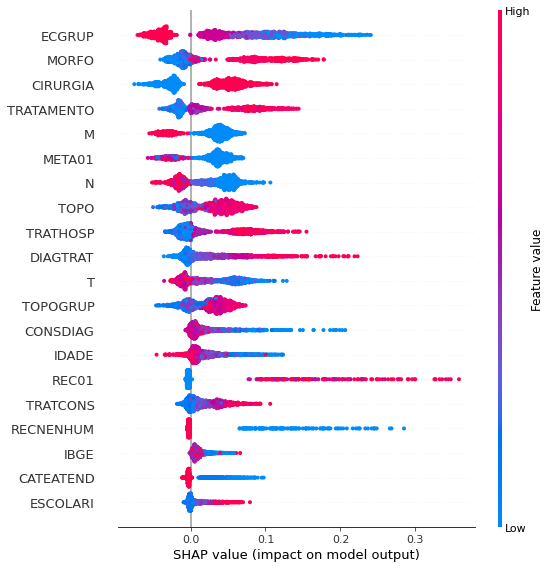

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_08_11, 
                  feature_names=feat_OS_08_11)

In [ ]:
# Other states - 2012 to 2015
rf_fora_12_15 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:14, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_12_15.fit(X_trainOS_12_15, y_trainOS_12_15)

RandomForestClassifier(class_weight={0: 14, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

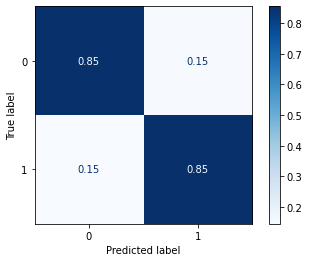

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_12_15, X_testOS_12_15, y_testOS_12_15,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2012 to 2015, also shows a good performance of the model, presenting 85% of accuracy.


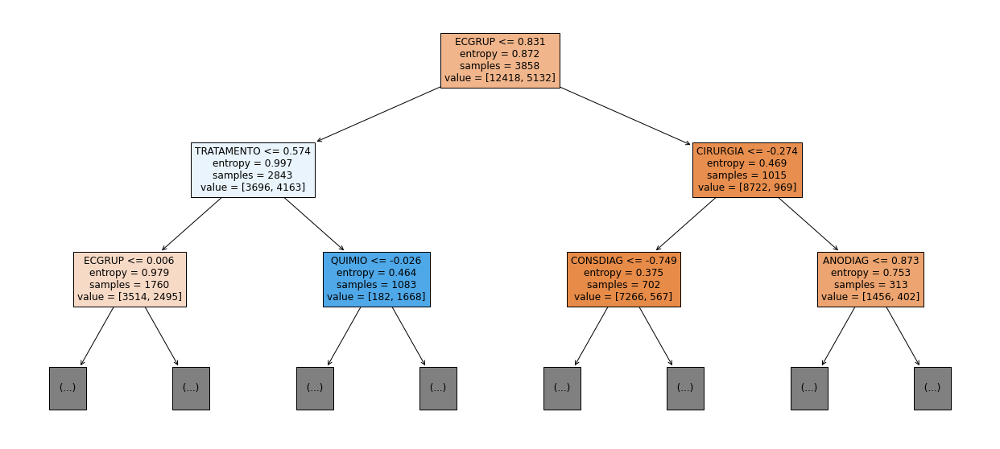

In [ ]:
show_tree(rf_fora_12_15, feat_OS_12_15, 2)

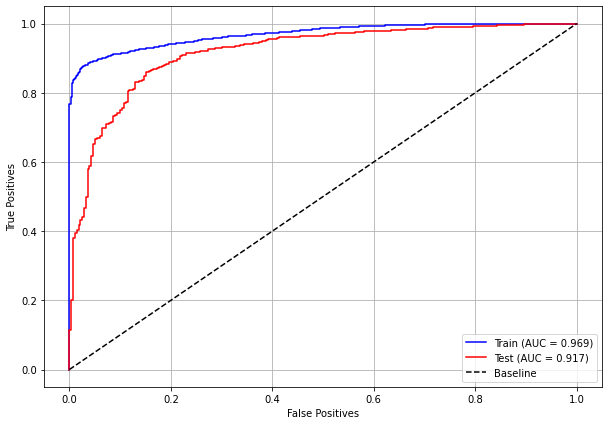

In [ ]:
plot_roc_curve(rf_fora_12_15, X_trainOS_12_15, X_testOS_12_15, y_trainOS_12_15, y_testOS_12_15)

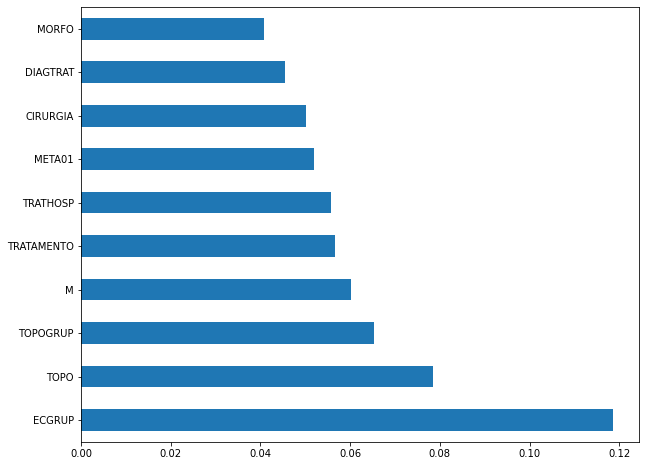

In [ ]:
plot_feat_importances(rf_fora_12_15, feat_OS_12_15)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_12_15).shap_values(X_testOS_12_15)

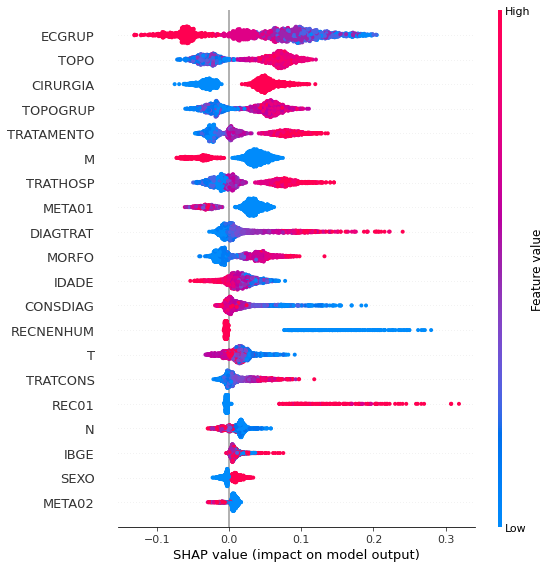

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_12_15, 
                  feature_names=feat_OS_12_15)

In [ ]:
# Other states - 2016 to 2020
rf_fora_16_20 = RandomForestClassifier(random_state=seed, 
                                       class_weight={0:16.25, 1:1},
                                       criterion='entropy',
                                       max_depth=10)

rf_fora_16_20.fit(X_trainOS_16_20, y_trainOS_16_20)

RandomForestClassifier(class_weight={0: 16.25, 1: 1}, criterion='entropy',
                       max_depth=10, random_state=10)

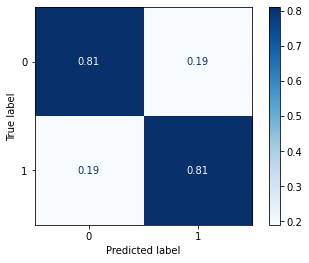

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_16_20, X_testOS_16_20, y_testOS_16_20,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the Random Forest, with other states data from 2016 to 2020, also shows a good performance of the model, presenting 84% of accuracy.


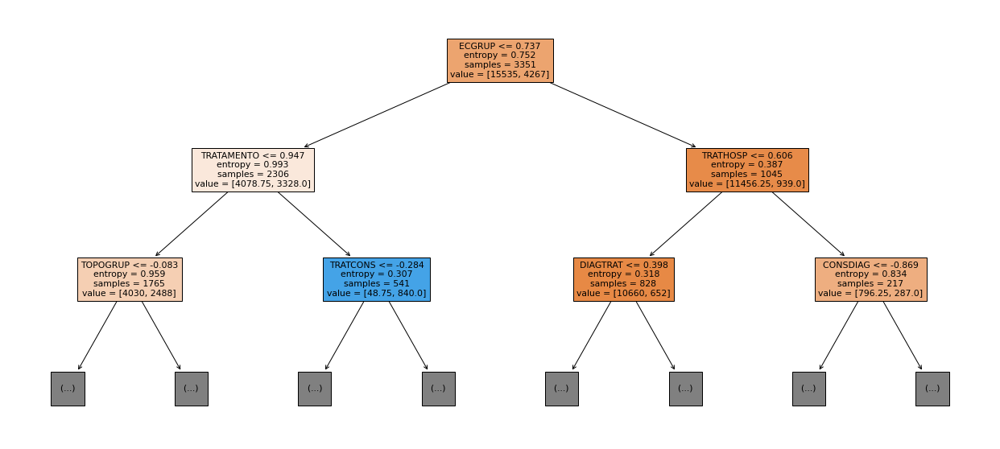

In [ ]:
show_tree(rf_fora_16_20, feat_OS_16_20, 2)

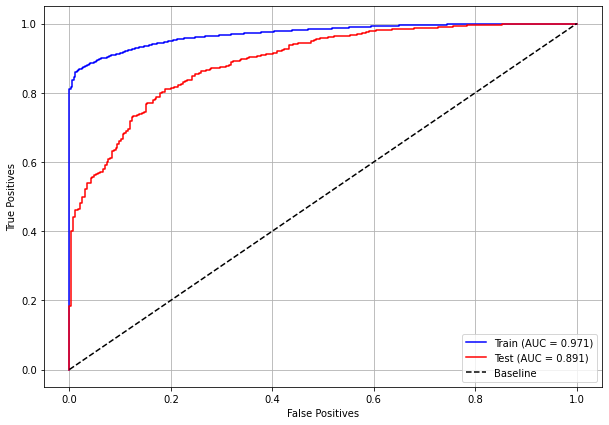

In [ ]:
plot_roc_curve(rf_fora_16_20, X_trainOS_16_20, X_testOS_16_20, y_trainOS_16_20, y_testOS_16_20)

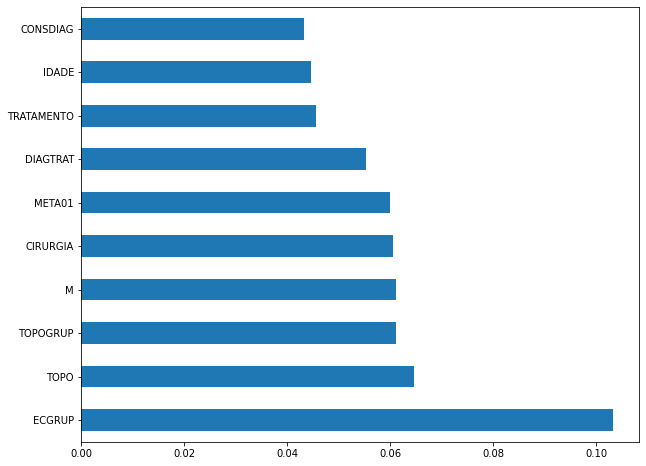

In [ ]:
plot_feat_importances(rf_fora_16_20, feat_OS_16_20)

> The four most important features in the model were `ECGRUP`, `TOPO`, `TOPOGRUP` and `M`.

In [ ]:
shap_values = shap.TreeExplainer(rf_fora_16_20).shap_values(X_testOS_16_20)

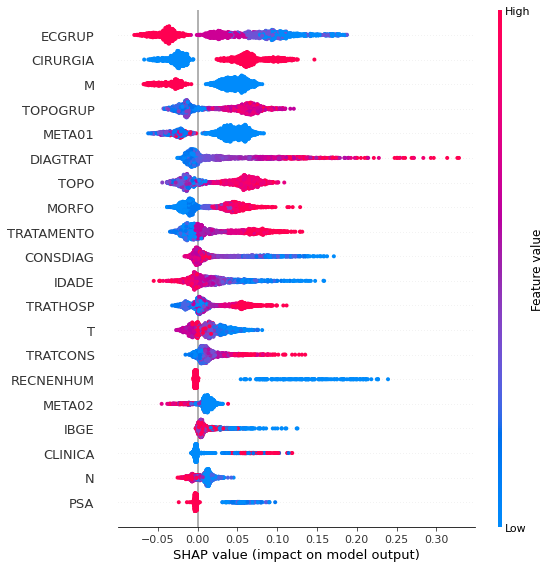

In [ ]:
shap.summary_plot(shap_values[1], X_testOS_16_20, 
                  feature_names=feat_OS_16_20)

### **XGBoost**


The training of the XGBoost models follows the same pattern with `random_state`. The hyperparameter `scale_pos_weight` was also used in the trainings, in order to obtain a balanced main diagonal in the confusion matrix.

The hyperparameter `max_depth` was chosen as 10 because the default value for this hyperparameter is 3, a low value for the amount of data we have.

**SP**

In [ ]:
# SP - 2000 to 2003
xgb_sp_00_03 = xgb.XGBClassifier(max_depth=10, 
                                 random_state=seed, 
                                 scale_pos_weight=0.237)

xgb_sp_00_03.fit(X_trainSP_00_03, y_trainSP_00_03)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.237)

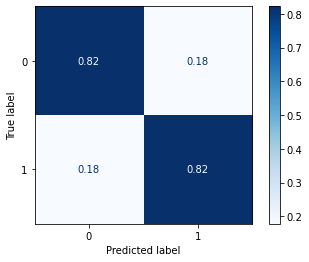

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_00_03, y_testSP_00_03,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2000 to 2003, shows a good performance of the model, here with 82% of accuracy.

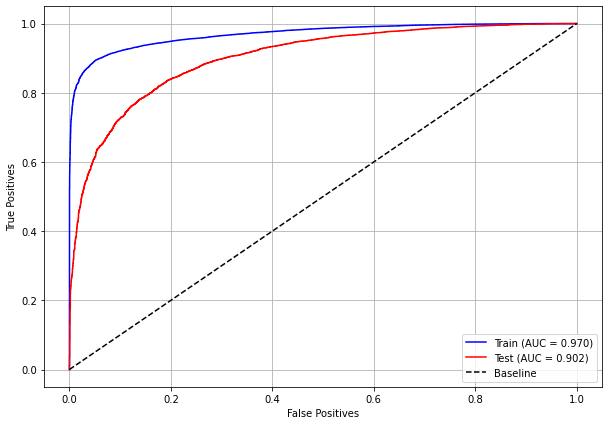

In [ ]:
plot_roc_curve(xgb_sp_00_03, X_trainSP_00_03, X_testSP_00_03, y_trainSP_00_03, y_testSP_00_03)

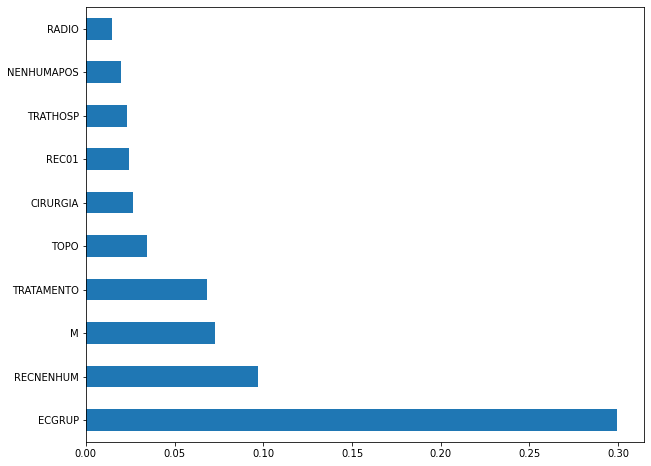

In [ ]:
plot_feat_importances(xgb_sp_00_03, feat_SP_00_03)

> Here we noticed that the most used feature was `ECGRUP`, with a lot advantage over the others. Following we have `RECNENHUM`, `M` and `TRATAMENTO`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_00_03).shap_values(X_testSP_00_03)

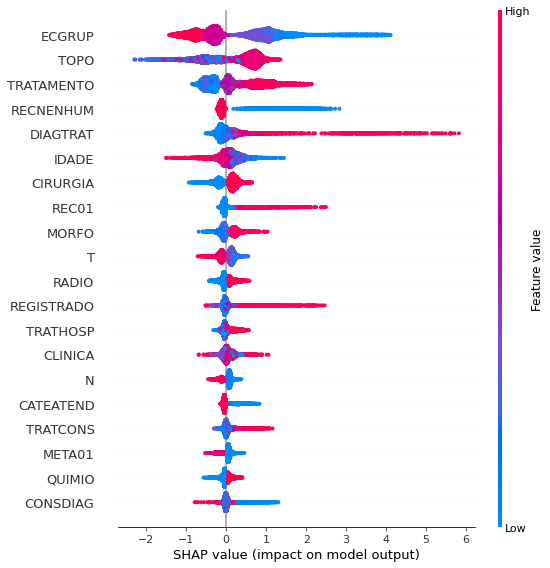

In [ ]:
shap.summary_plot(shap_values, X_testSP_00_03, 
                  feature_names=feat_SP_00_03)

In [ ]:
# SP - 2004 to 2007
xgb_sp_04_07 = xgb.XGBClassifier(max_depth=10, 
                                 random_state=seed, 
                                 scale_pos_weight=0.18)

xgb_sp_04_07.fit(X_trainSP_04_07, y_trainSP_04_07)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.18)

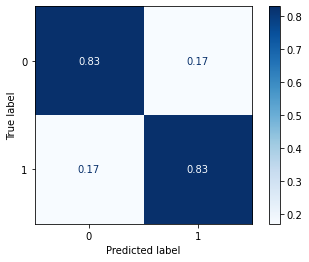

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_04_07, X_testSP_04_07, y_testSP_04_07,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2004 to 2007, shows a good performance of the model, with 83% of accuracy.


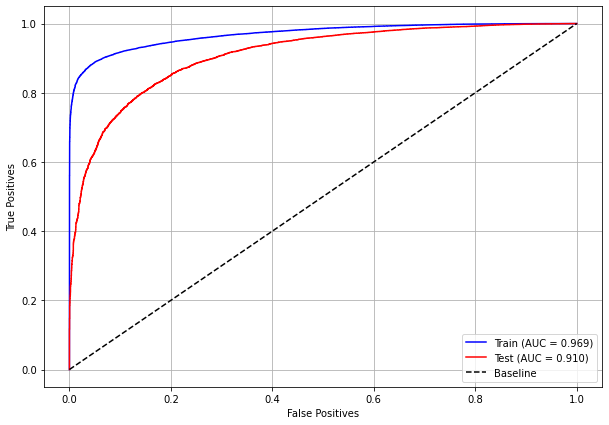

In [ ]:
plot_roc_curve(xgb_sp_04_07, X_trainSP_04_07, X_testSP_04_07, y_trainSP_04_07, y_testSP_04_07)

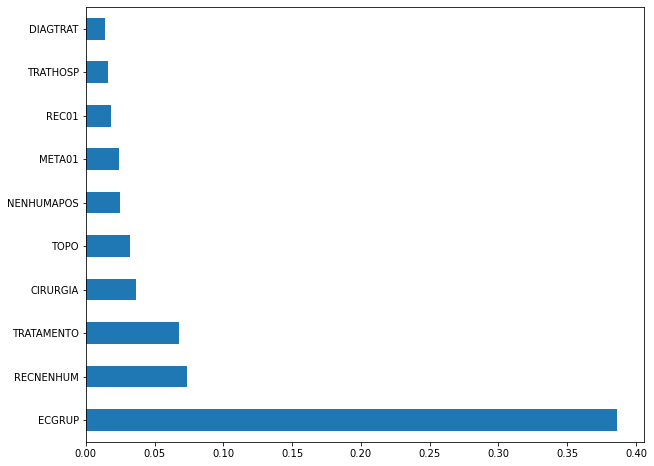

In [ ]:
plot_feat_importances(xgb_sp_04_07, feat_SP_04_07)

> Here we noticed that the most used feature was `ECGRUP`, with a good advantage over the others. Following we have `RENENHUM`, `TRATAMENTO` and `CIRURGIA`. 

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_04_07).shap_values(X_testSP_04_07)

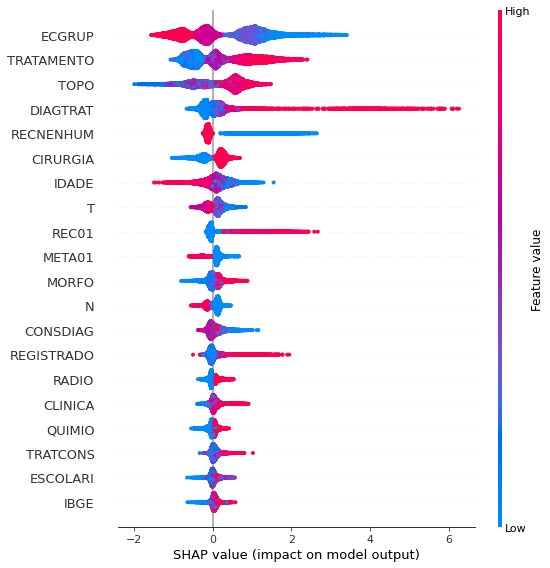

In [ ]:
shap.summary_plot(shap_values, X_testSP_04_07, 
                  feature_names=feat_SP_04_07)

In [ ]:
# SP - 2008 to 2011
xgb_sp_08_11 = xgb.XGBClassifier(max_depth=10, 
                                 scale_pos_weight=0.18,
                                 random_state=seed)

xgb_sp_08_11.fit(X_trainSP_08_11, y_trainSP_08_11)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.18)

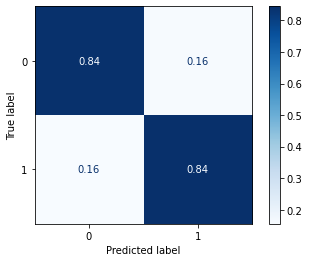

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_08_11, X_testSP_08_11, y_testSP_08_11,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2008 to 2011, shows a good performance of the model, with 84% of accuracy.

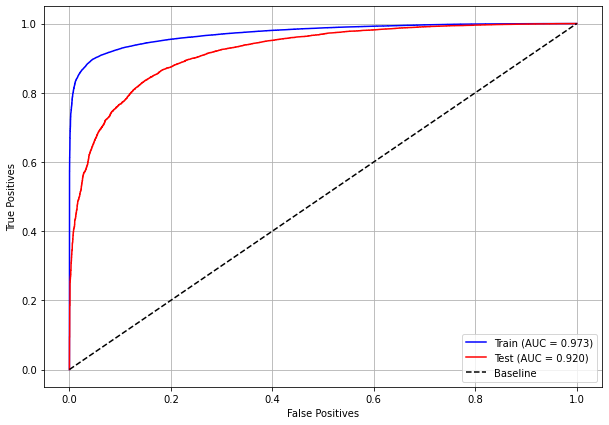

In [ ]:
plot_roc_curve(xgb_sp_08_11, X_trainSP_08_11, X_testSP_08_11, y_trainSP_08_11, y_testSP_08_11)

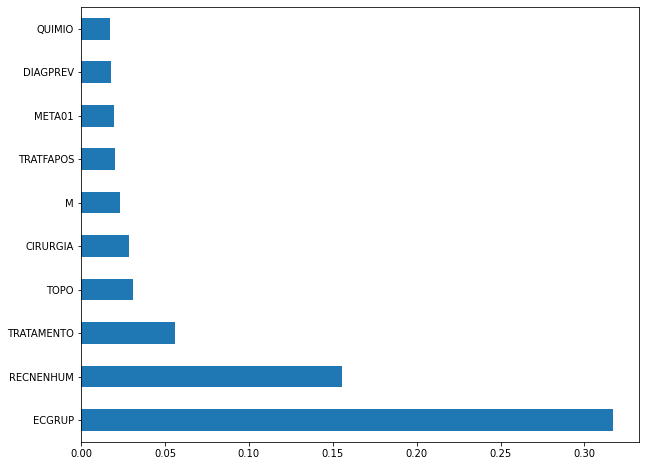

In [ ]:
plot_feat_importances(xgb_sp_08_11, feat_SP_08_11)

> Here we noticed that the most used feature was `ECGRUP`, with a good advantage over the others. Following we have `RECNENHUM`, `TRATAMENTO` and `TOPO`. 

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_08_11).shap_values(X_testSP_08_11)

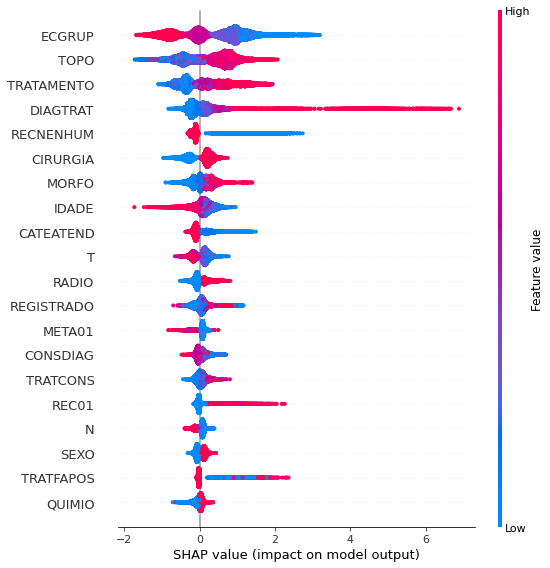

In [ ]:
shap.summary_plot(shap_values, X_testSP_08_11, 
                  feature_names=feat_SP_08_11)

In [ ]:
# SP - 2012 to 2015
xgb_sp_12_15 = xgb.XGBClassifier(max_depth=10, 
                                 random_state=seed,
                                 scale_pos_weight=0.15)

xgb_sp_12_15.fit(X_trainSP_12_15, y_trainSP_12_15)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.15)

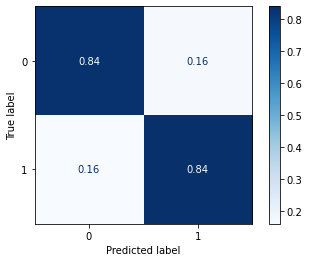

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_12_15, X_testSP_12_15, y_testSP_12_15,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2012 to 2015, shows a good performance of the model, with 84% of accuracy.

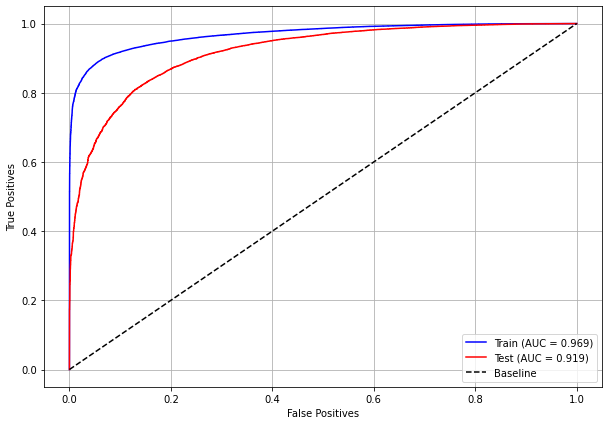

In [ ]:
plot_roc_curve(xgb_sp_12_15, X_trainSP_12_15, X_testSP_12_15, y_trainSP_12_15, y_testSP_12_15)

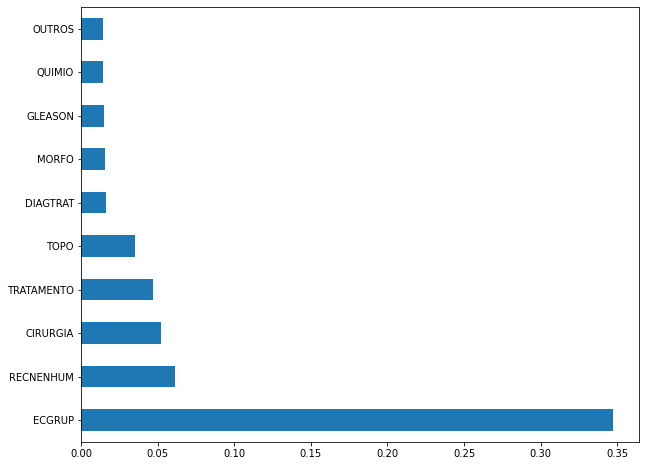

In [ ]:
plot_feat_importances(xgb_sp_12_15, feat_SP_12_15)

> Here we noticed that the most used feature was `ECGRUP`, with a good advantage. Following we have `RECNENHUM`, `CIRURGIA` and `TRATAMENTO`. 

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_12_15).shap_values(X_testSP_12_15)

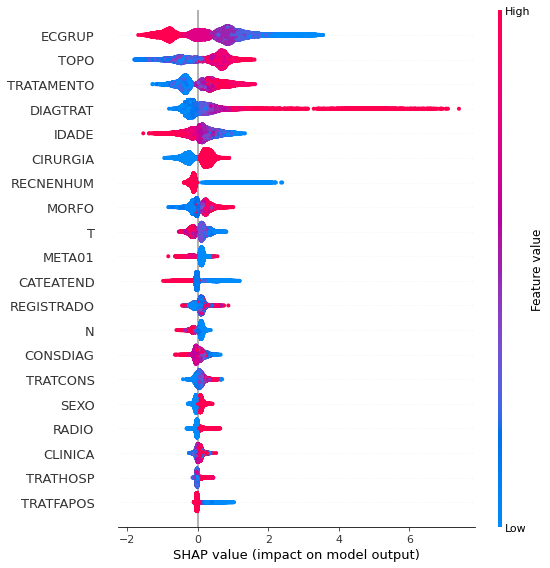

In [ ]:
shap.summary_plot(shap_values, X_testSP_12_15, 
                  feature_names=feat_SP_12_15)

In [ ]:
# SP - 2016 to 2021
xgb_sp_16_21 = xgb.XGBClassifier(max_depth=10, 
                                 random_state=seed, 
                                 scale_pos_weight=0.17)

xgb_sp_16_21.fit(X_trainSP_16_21, y_trainSP_16_21)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.17)

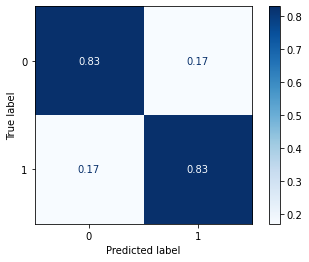

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_16_21, X_testSP_16_21, y_testSP_16_21,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with SP data from 2016 to 2021, shows a good performance of the model, with 83% of accuracy.


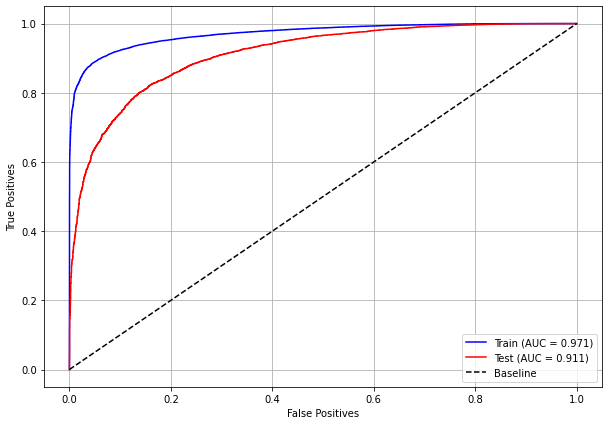

In [ ]:
plot_roc_curve(xgb_sp_16_21, X_trainSP_16_21, X_testSP_16_21, y_trainSP_16_21, y_testSP_16_21)

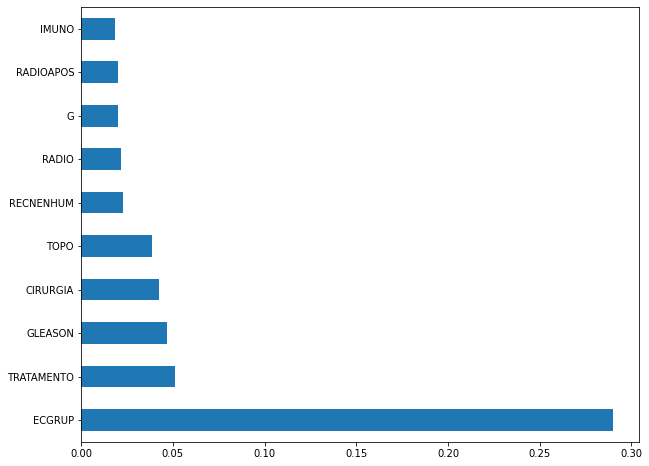

In [ ]:
plot_feat_importances(xgb_sp_16_21, feat_SP_16_21)

> The four most important features were `ECGRUP`, `TRATAMENTO`, `GLEASON` and `CIRURGIA`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_sp_16_21).shap_values(X_testSP_16_21)

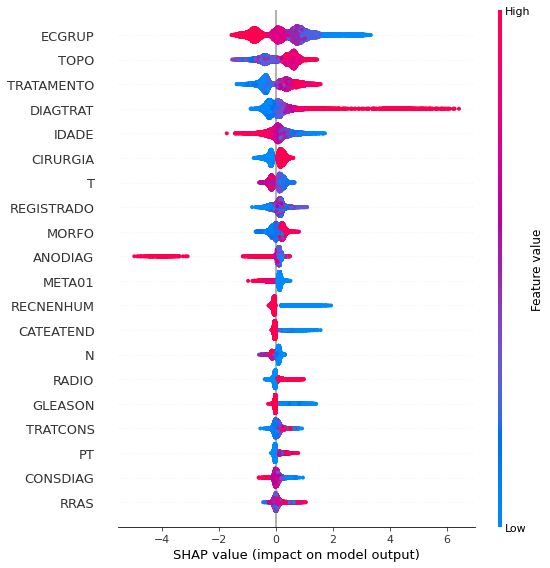

In [ ]:
shap.summary_plot(shap_values, X_testSP_16_21, 
                  feature_names=feat_SP_16_21)

**Other states**

In [ ]:
# Other states - 2000 to 2003
xgb_fora_00_03 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.078,
                                   random_state=seed)

xgb_fora_00_03.fit(X_trainOS_00_03, y_trainOS_00_03)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.078)

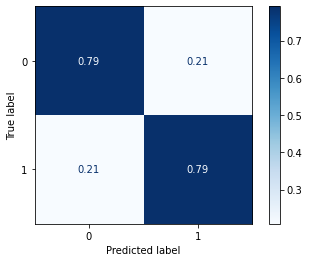

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_00_03, y_testOS_00_03,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2000 to 2003, also shows a good performance of the model, with 79% of accuracy.

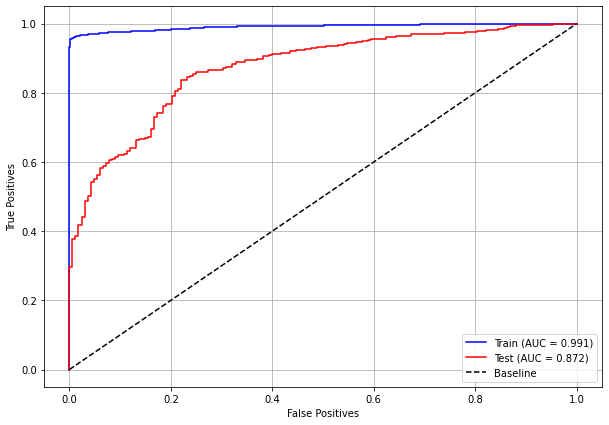

In [ ]:
plot_roc_curve(xgb_fora_00_03, X_trainOS_00_03, X_testOS_00_03, y_trainOS_00_03, y_testOS_00_03)

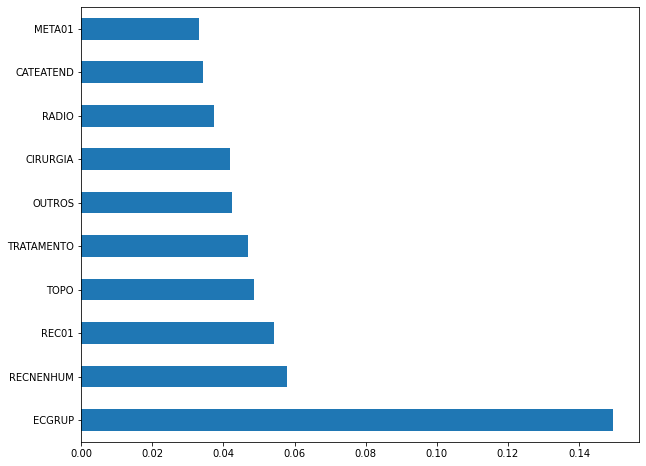

In [ ]:
plot_feat_importances(xgb_fora_00_03, feat_OS_00_03)

> Again we noticed that the most used feature was `ECGRUP`, with a good advantage. The following most important features were `RECNENHUM`, `REC01` and `TOPO`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_00_03).shap_values(X_testOS_00_03)

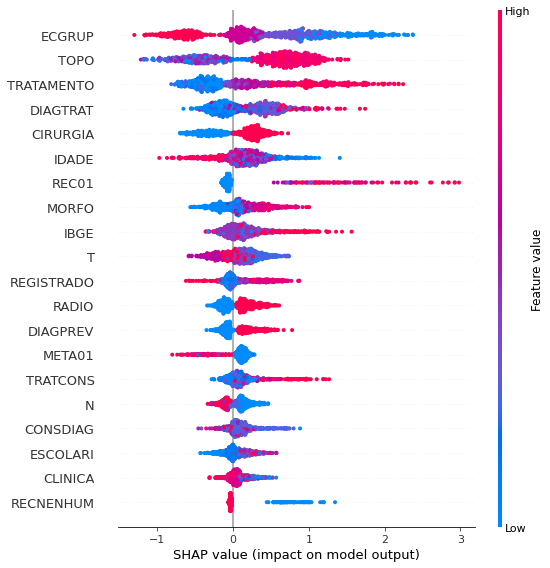

In [ ]:
shap.summary_plot(shap_values, X_testOS_00_03, 
                  feature_names=feat_OS_00_03)

In [ ]:
# Other states - 2004 to 2007
xgb_fora_04_07 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.065,
                                   random_state=seed)

xgb_fora_04_07.fit(X_trainOS_04_07, y_trainOS_04_07)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.065)

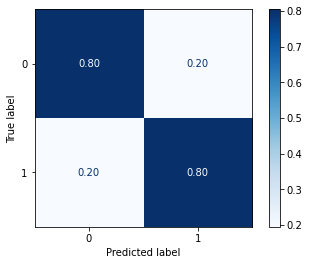

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_04_07, X_testOS_04_07, y_testOS_04_07,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2004 to 2007, also shows a good performance of the model with 80% of accuracy.

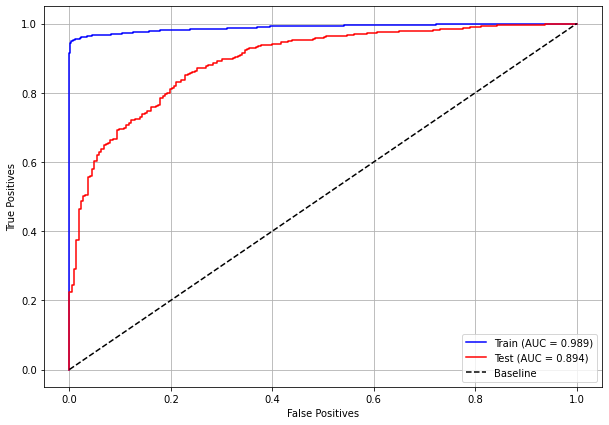

In [ ]:
plot_roc_curve(xgb_fora_04_07, X_trainOS_04_07, X_testOS_04_07, y_trainOS_04_07, y_testOS_04_07)

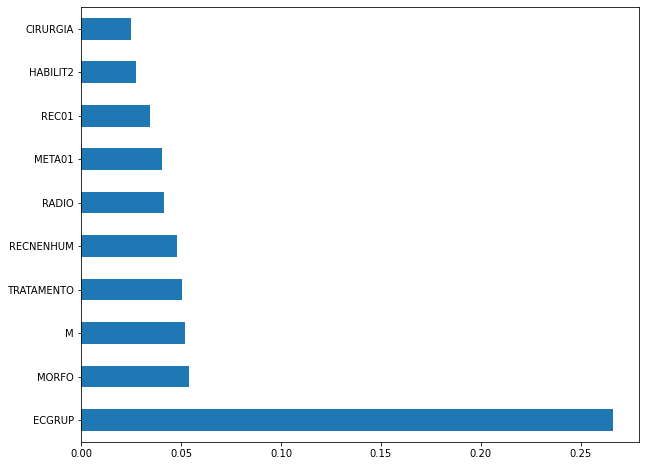

In [ ]:
plot_feat_importances(xgb_fora_04_07, feat_OS_04_07)

> Again we noticed that the most used feature was `ECGRUP`, with a good advantage. The following most important features were `MORFO`, `M` and `TRATAMENTO`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_04_07).shap_values(X_testOS_04_07)

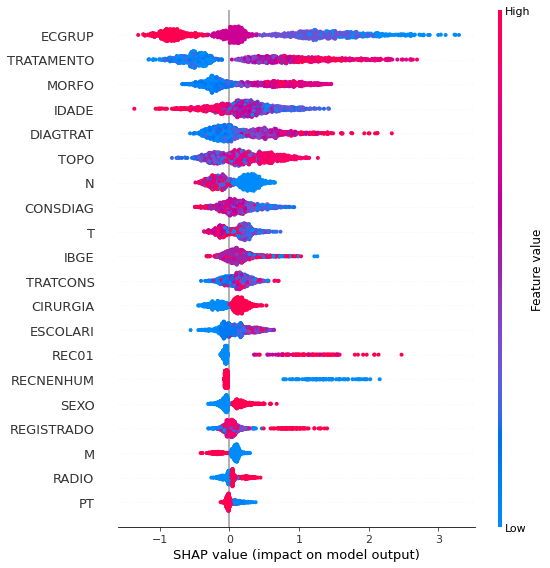

In [ ]:
shap.summary_plot(shap_values, X_testOS_04_07, 
                  feature_names=feat_OS_04_07)

In [ ]:
# Other states - 2008 to 2011
xgb_fora_08_11 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.066,
                                   random_state=seed)

xgb_fora_08_11.fit(X_trainOS_08_11, y_trainOS_08_11)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.066)

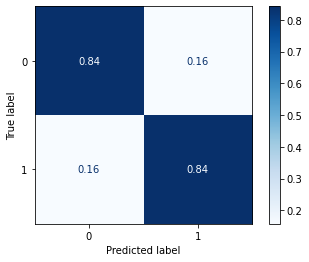

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_08_11, X_testOS_08_11, y_testOS_08_11,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2008 to 2011, also shows a good performance of the model with 84% of accuracy.

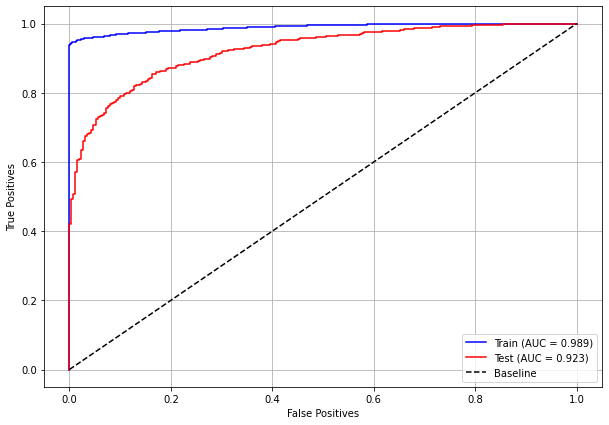

In [ ]:
plot_roc_curve(xgb_fora_08_11, X_trainOS_08_11, X_testOS_08_11, y_trainOS_08_11, y_testOS_08_11)

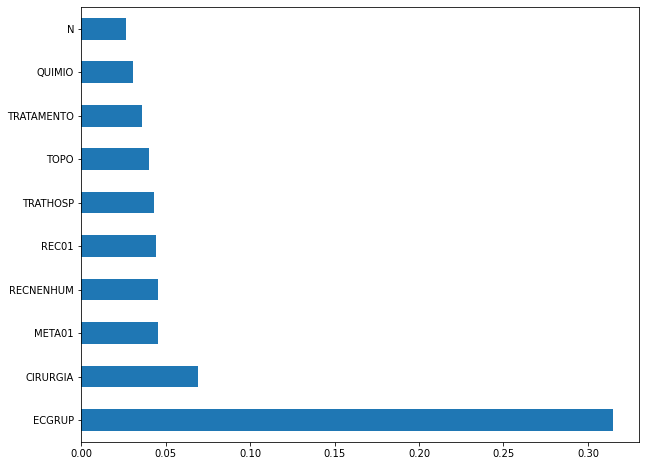

In [ ]:
plot_feat_importances(xgb_fora_08_11, feat_OS_08_11)

> Again we noticed that the most used feature was `ECGRUP`, but not with a lot of advantage. The following most important features were `CIRURGIA`, `META01` and `RECNENHUM`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_08_11).shap_values(X_testOS_08_11)

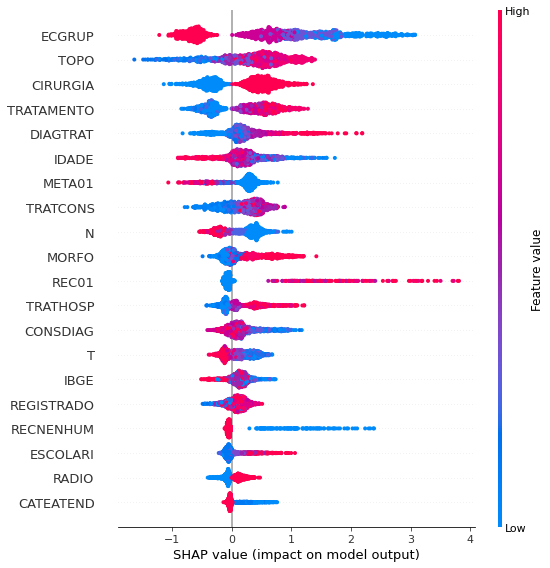

In [ ]:
shap.summary_plot(shap_values, X_testOS_08_11, 
                  feature_names=feat_OS_08_11)

In [ ]:
# Other states - 2012 to 2015
xgb_fora_12_15 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.065,
                                   random_state=seed)

xgb_fora_12_15.fit(X_trainOS_12_15, y_trainOS_12_15)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.065)

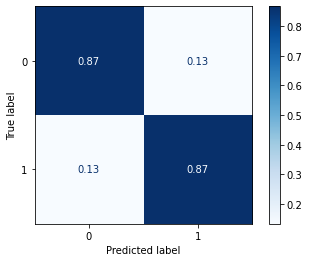

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_12_15, X_testOS_12_15, y_testOS_12_15,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2012 to 2015, also shows a good performance of the model with 87% of accuracy.

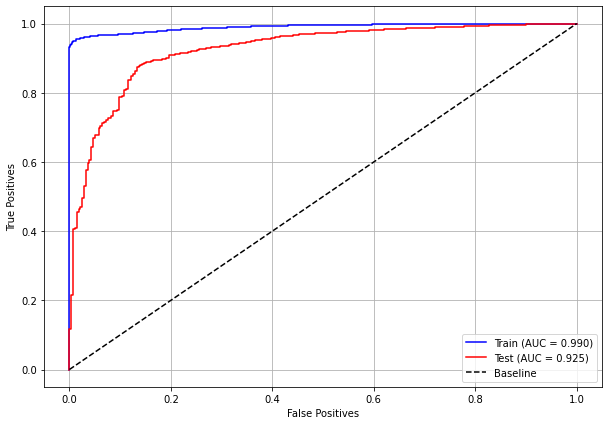

In [ ]:
plot_roc_curve(xgb_fora_12_15, X_trainOS_12_15, X_testOS_12_15, y_trainOS_12_15, y_testOS_12_15)

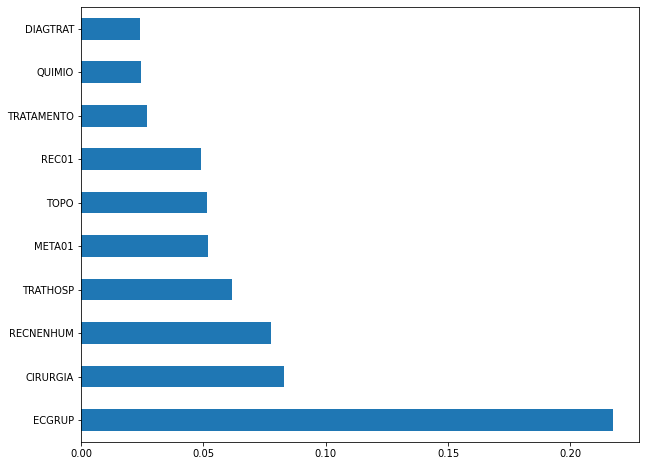

In [ ]:
plot_feat_importances(xgb_fora_12_15, feat_OS_12_15)

> The four most important features were `ECGRUP`, `CIRURGIA`, `RECNENHUM` and `TRATHOSP`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_12_15).shap_values(X_testOS_12_15)

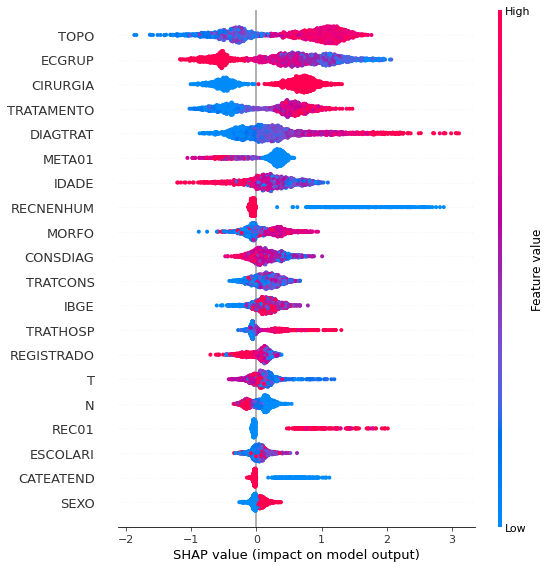

In [ ]:
shap.summary_plot(shap_values, X_testOS_12_15, 
                  feature_names=feat_OS_12_15)

In [ ]:
# Other states - 2016 to 2020
xgb_fora_16_20 = xgb.XGBClassifier(max_depth=10, 
                                   scale_pos_weight=0.063,
                                   random_state=seed)

xgb_fora_16_20.fit(X_trainOS_16_20, y_trainOS_16_20)

XGBClassifier(max_depth=10, random_state=10, scale_pos_weight=0.063)

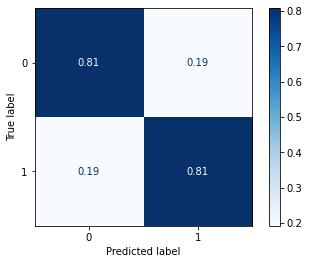

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_16_20, X_testOS_16_20, y_testOS_16_20,
                                      cmap='Blues', normalize='true', values_format='.2f')
plt.show()

> The confusion matrix obtained for the XGBoost, with other states data from 2016 to 2020, shows the best performance comparing with the other models, with 81% of accuracy.

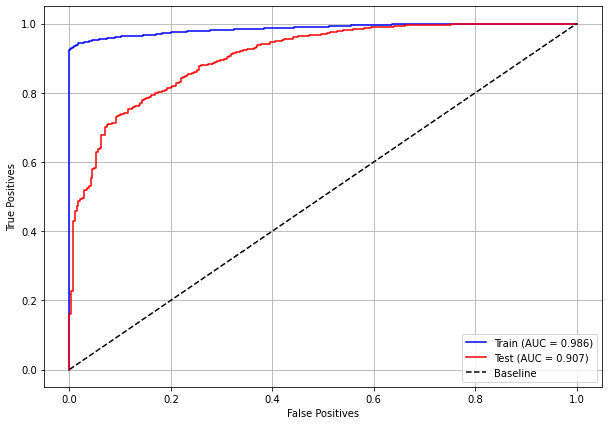

In [ ]:
plot_roc_curve(xgb_fora_16_20, X_trainOS_16_20, X_testOS_16_20, y_trainOS_16_20, y_testOS_16_20)

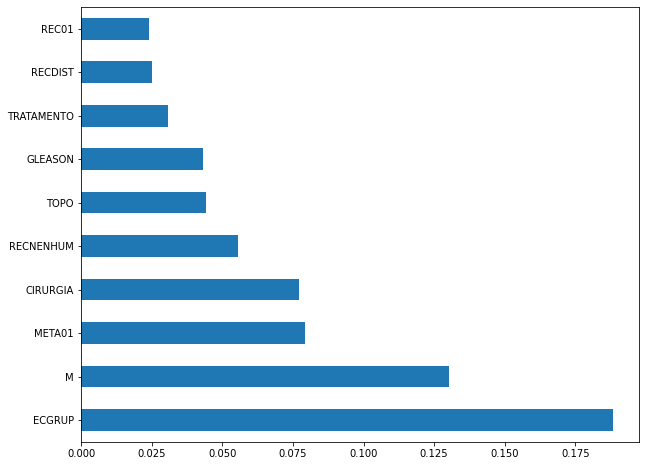

In [ ]:
plot_feat_importances(xgb_fora_16_20, feat_OS_16_20)

> The four most important features were `ECGRUP`, `M`, `META01` and `CIRURGIA`.

In [ ]:
shap_values = shap.TreeExplainer(xgb_fora_16_20).shap_values(X_testOS_16_20)

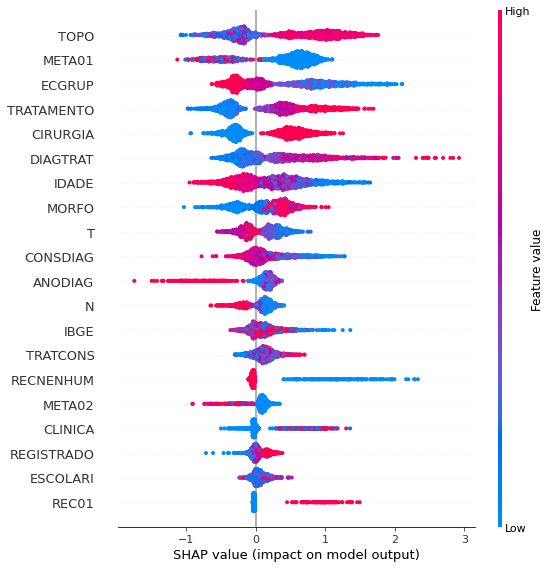

In [ ]:
shap.summary_plot(shap_values, X_testOS_16_20, 
                  feature_names=feat_OS_16_20)

## **Testing models with data from other years**

We will use test data from the following years in the trained models for each set of years grouped together.

### **Random Forest SP for years 2000 to 2003**

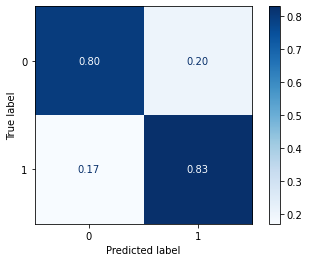

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_04_07, y_testSP_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

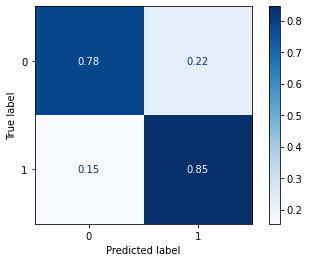

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

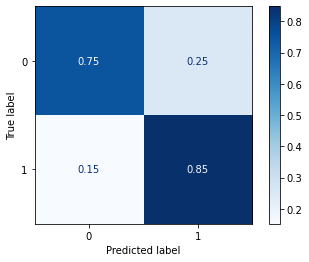

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

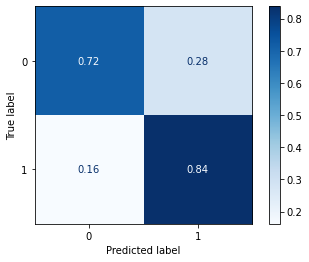

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_00_03, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost SP for years 2000 to 2003**

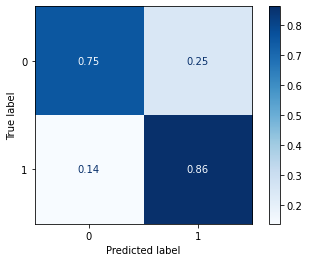

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_04_07, y_testSP_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

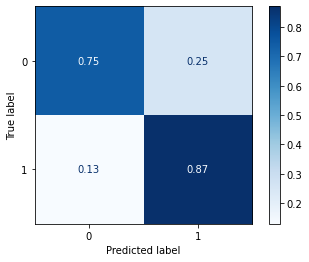

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

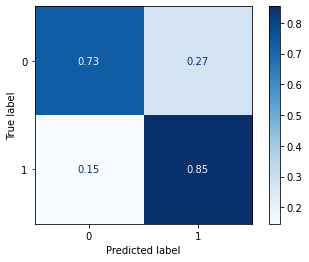

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

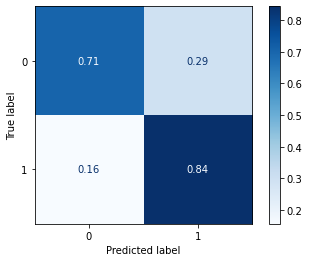

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_00_03, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest SP for years 2004 to 2007**

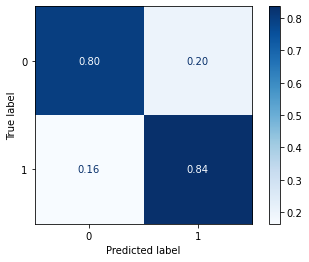

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_04_07, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

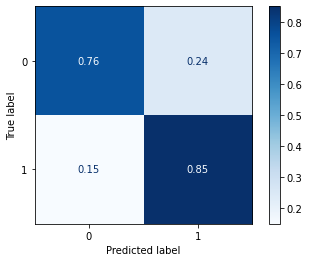

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_04_07, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

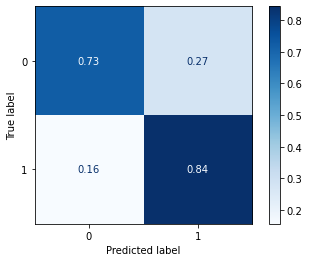

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_04_07, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost SP for years 2004 to 2007**

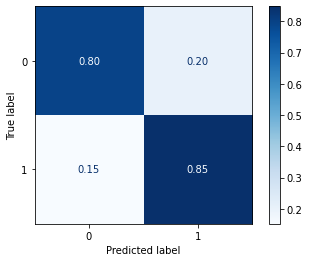

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_04_07, X_testSP_08_11, y_testSP_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

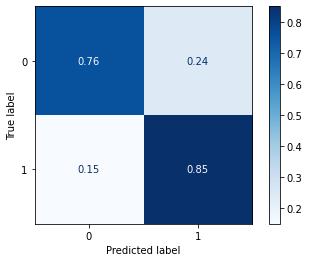

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_04_07, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

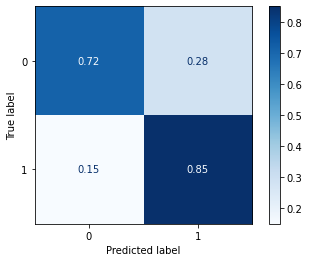

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_04_07, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest SP for years 2008 to 2011**

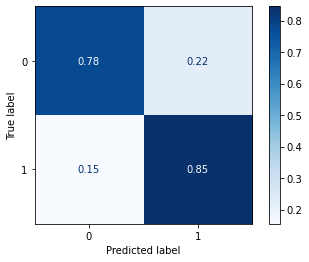

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_08_11, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

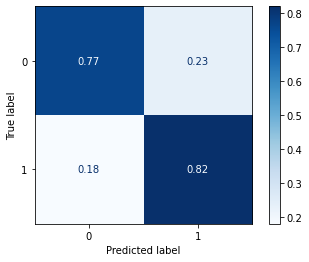

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_08_11, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost SP for years 2008 to 2011**

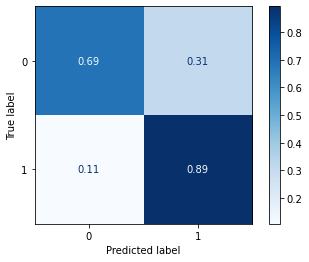

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_08_11, X_testSP_12_15, y_testSP_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

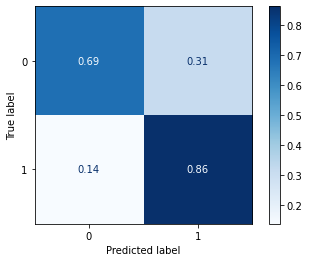

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_08_11, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest SP for years 2012 to 2015**

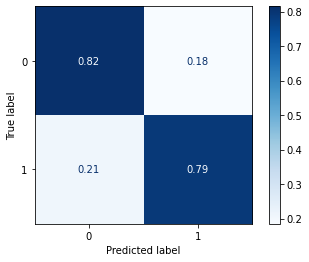

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_sp_12_15, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost SP for years 2012 to 2015**

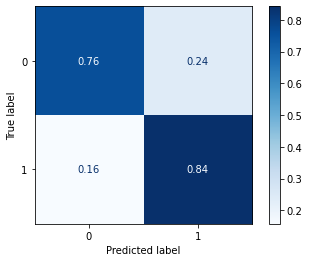

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_sp_12_15, X_testSP_16_21, y_testSP_16_21, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest Other states for years 2000 to 2003**

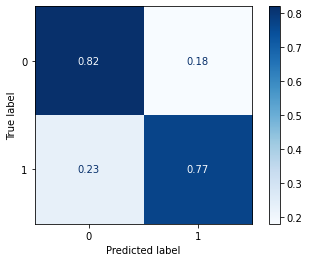

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_04_07, y_testOS_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

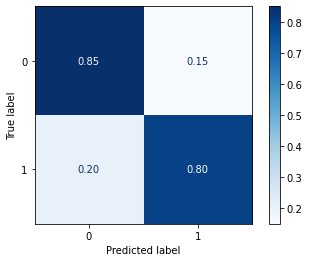

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_08_11, y_testOS_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

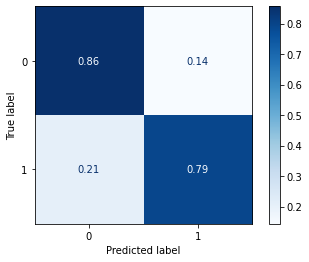

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

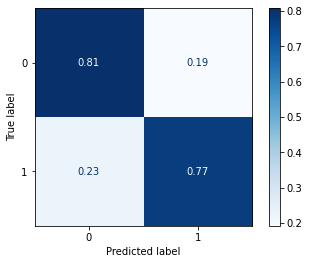

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_00_03, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost Other states for years 2000 to 2003**

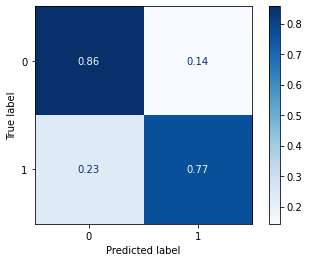

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_04_07, y_testOS_04_07, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

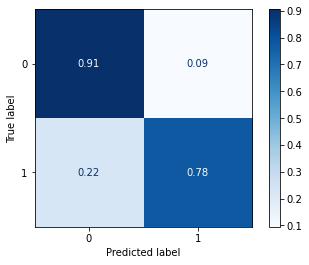

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_08_11, y_testOS_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

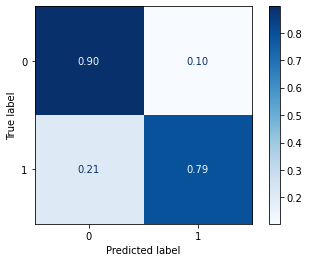

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

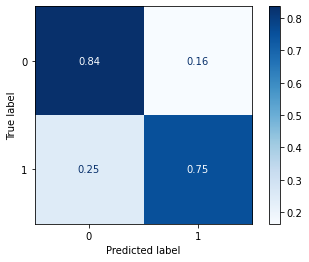

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_00_03, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest Other states for years 2004 to 2007**

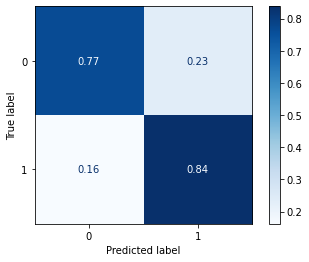

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_04_07, X_testOS_08_11, y_testOS_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

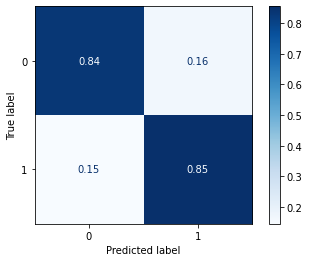

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_04_07, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

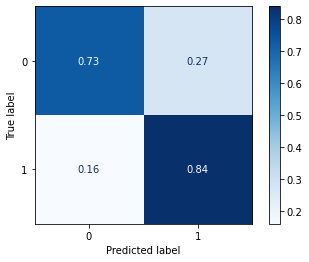

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_04_07, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost Other states for years 2004 to 2007**

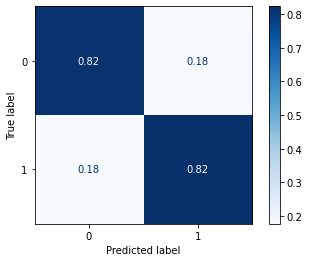

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_04_07, X_testOS_08_11, y_testOS_08_11, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

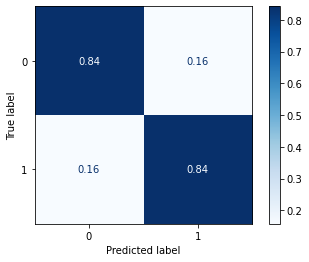

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_04_07, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

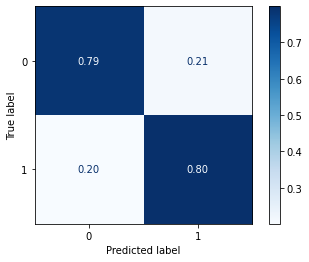

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_04_07, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest Other states for years 2008 to 2011**

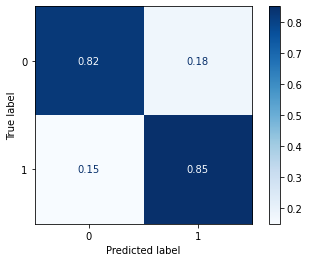

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_08_11, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

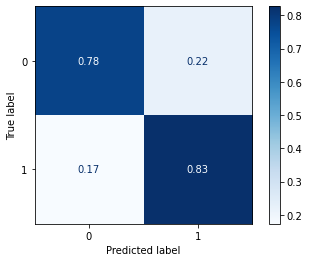

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_08_11, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost Other states for years 2008 to 2011**

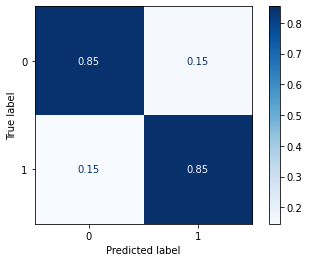

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_08_11, X_testOS_12_15, y_testOS_12_15, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

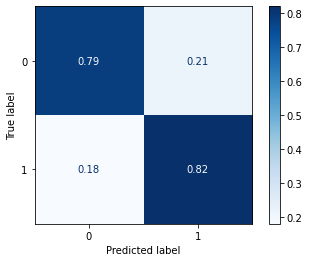

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_08_11, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **Random Forest Other states for years 2012 to 2015**

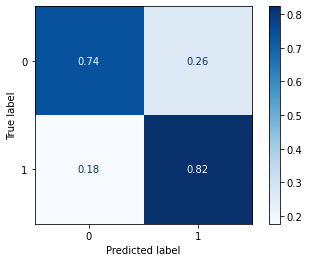

In [ ]:
ConfusionMatrixDisplay.from_estimator(rf_fora_12_15, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()

### **XGBoost Other states for years 2012 to 2015**

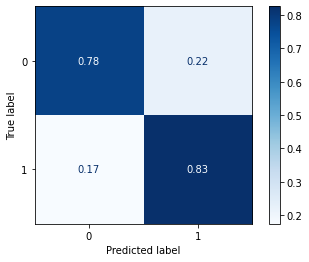

In [ ]:
ConfusionMatrixDisplay.from_estimator(xgb_fora_12_15, X_testOS_16_20, y_testOS_16_20, cmap='Blues',
                                      normalize='true', values_format='.2f')
plt.show()